In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

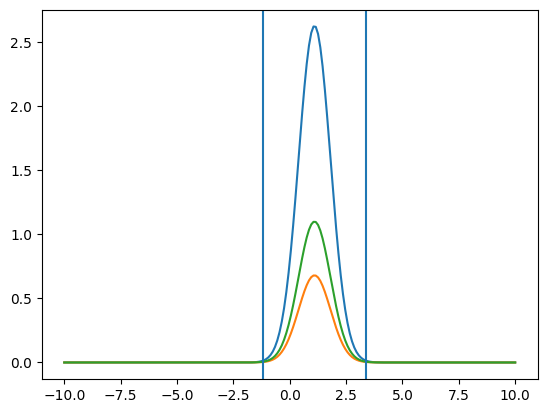

*Extracting Pieces for TH1*
Available Functions:
	Num_Xbins(TH1_) returns number of X bins for a TH1
	XEdges_1d(TH1_) returns edges of x bins for a TH1
	Center_Xbins(TH1_) returns center values for x bins for a TH1
	Values_1d(TH1_) returns the y values for a TH1
	Errors_1d(TH1_) returns the error values for TH1
	Errors2_1d(TH1_) returns the squared error values for TH1
Enjoy using TH1s

You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is concerned


In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [3]:
#date="06-13-2022"
date="07-15-2024"
par="pim"
sim="sim"
run="e16"
#SLURM_ID="13866486"
top="m"+par
#dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/"+date
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/"+date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file=dir+"/"+sim+"_"+run+"_clas6_mm_"+par+"_"+date+".root"
file=uproot3.open(root_file)

In [33]:
Particle=''
if par == "pro":
    Particle = "Proton"
elif par == "pip":
    Particle = "\u03C0+"
elif par == "pim":
    Particle ="\u03C0-"
else:
    Particle = "Explicit"

In [5]:
#The Various layers of TDirectories to get to the histograms
layer0='MM'
layer1='MM_'+top
layer2=layer1+"_no-cut"
layer3=[layer2+"_sec"+str(i+1) for i in range(6)]
layer4=[layer3[i]+"_clean" for i in range(6)]
layer51=[layer4[i]+"_W_dep" for i in range(6)]
layer52=[layer4[i]+"_W_Range" for i in range(6)]
dir_loc=[([layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer51[i]],[layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer52[i]]) for i in range(6)]
names1=[["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:"+W_Bin_Name[j] for j in range(_W_bins_)] for i in range(6)]
names2=["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:in_range" for i in range(6)]
#Histogram Names
hist_name=[[[file[dir_loc[i][0][0]][names1[i][j]] for j in range(_W_bins_)],file[dir_loc[i][1][0]][names2[i]]] for i in range(6)]
          

In [6]:
def sign(n_):
    if n_ >= 0:
        return 1
    else:
        return -1

initial bw fit:  [0.38674432 0.15661141 0.10493072]
-0.002835924744202526 0.049801345337712896
Breit-Wigner Peak [0.34701078 0.15324069 0.09366364]
Gaus2 [0.33081803 0.36415918 0.06245736]
Gaus3 [0.32525191 0.08       0.03950745]


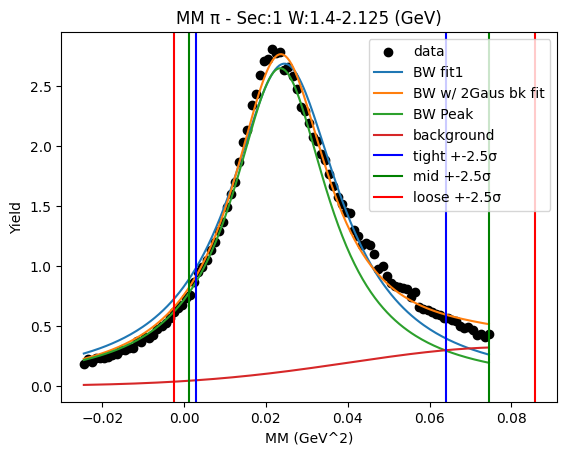

W bin: 1 1.425GeV-1.450GeV
initial bw fit:  [0.00403649 0.14298783 0.07127075]


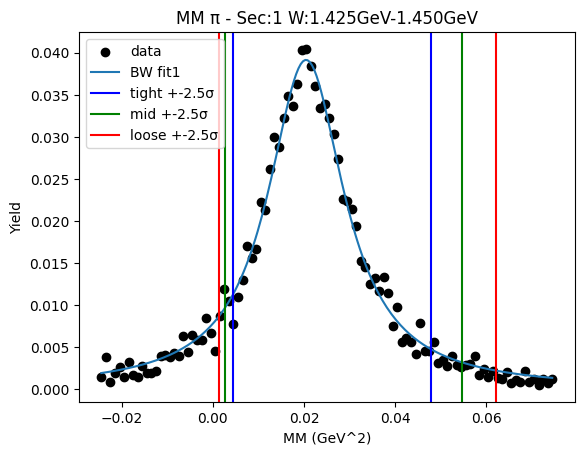

W bin: 2 1.450GeV-1.475GeV
initial bw fit:  [0.005177   0.1466025  0.07339629]


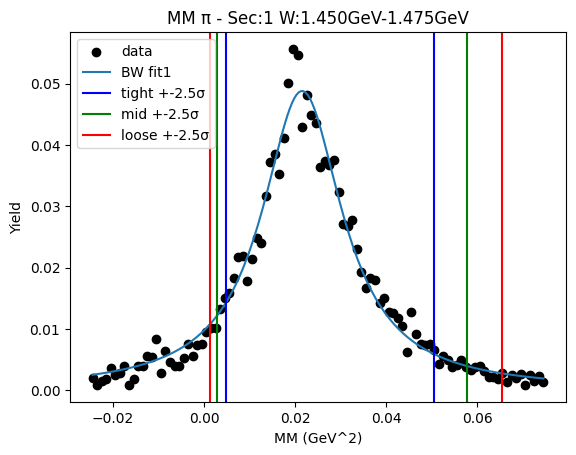

W bin: 3 1.475GeV-1.500GeV
initial bw fit:  [0.00667059 0.14767211 0.07565814]


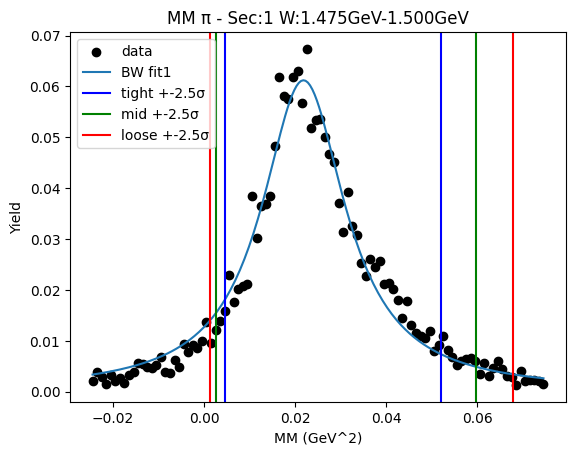

W bin: 4 1.500GeV-1.525GeV
initial bw fit:  [0.00774072 0.15150864 0.08016003]


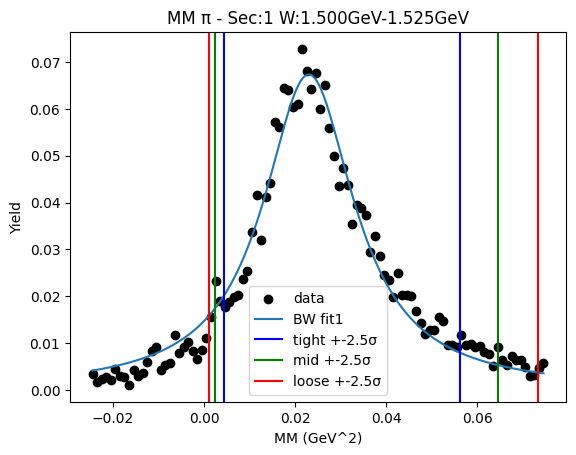

W bin: 5 1.525GeV-1.550GeV
initial bw fit:  [0.00835525 0.15487554 0.08003716]


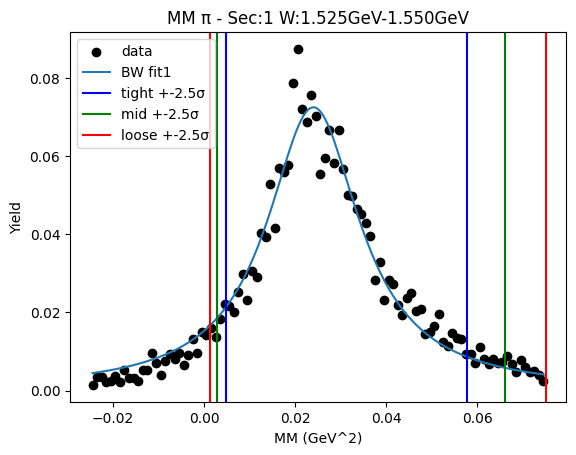

W bin: 6 1.550GeV-1.575GeV
initial bw fit:  [0.00818978 0.15697448 0.07964964]


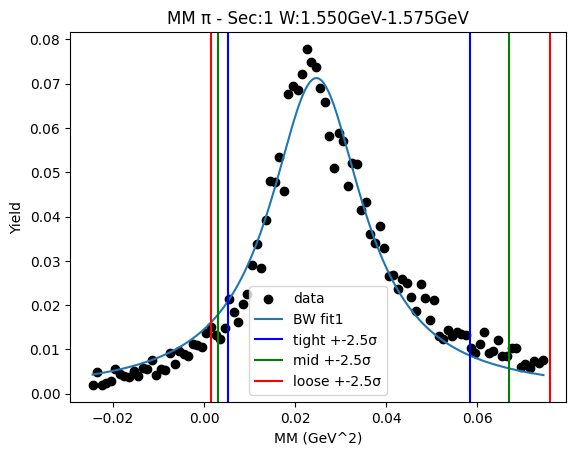

W bin: 7 1.575GeV-1.600GeV
initial bw fit:  [0.00849627 0.15517422 0.09084177]


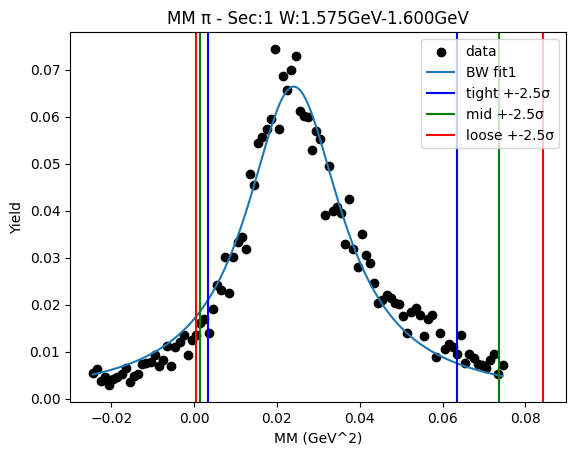

W bin: 8 1.600GeV-1.625GeV
initial bw fit:  [0.00901185 0.15631737 0.08565287]


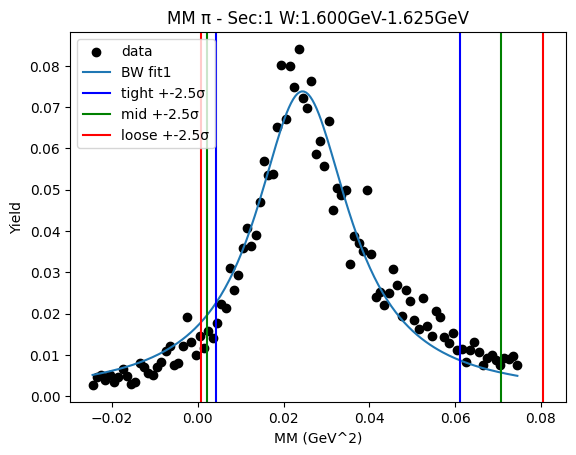

W bin: 9 1.625GeV-1.650GeV
initial bw fit:  [0.01038892 0.15372093 0.09053817]


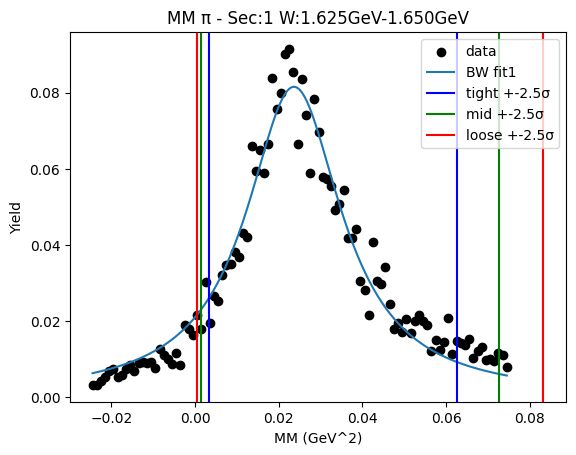

W bin: 10 1.650GeV-1.675GeV
initial bw fit:  [0.01155048 0.15352786 0.09396435]


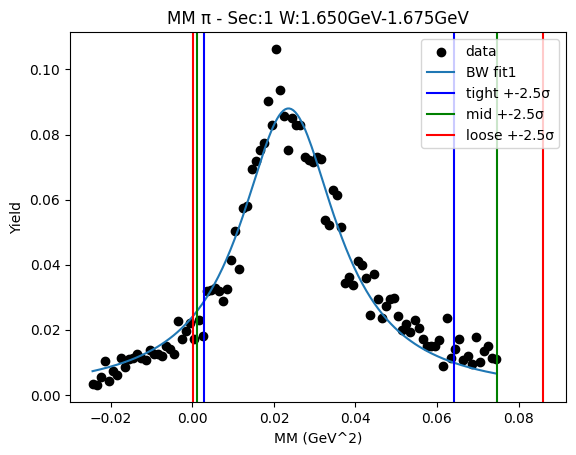

W bin: 11 1.675GeV-1.700GeV
initial bw fit:  [0.01398101 0.1525754  0.09689021]


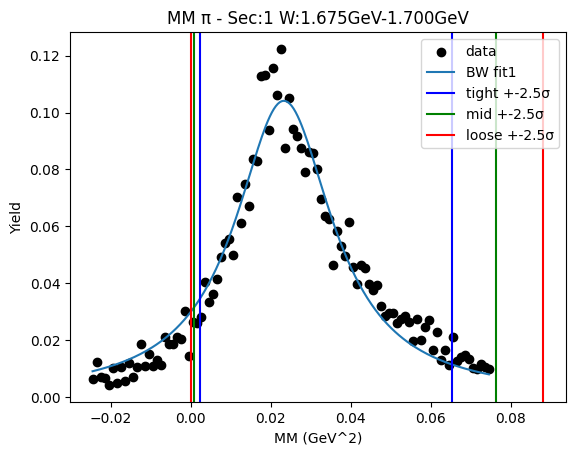

W bin: 12 1.700GeV-1.725GeV
initial bw fit:  [0.01598822 0.15361772 0.09138566]


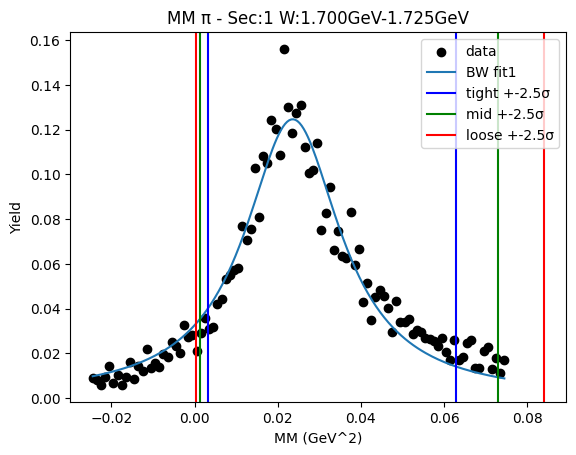

W bin: 13 1.725GeV-1.750GeV
initial bw fit:  [0.01686187 0.15643893 0.09652125]


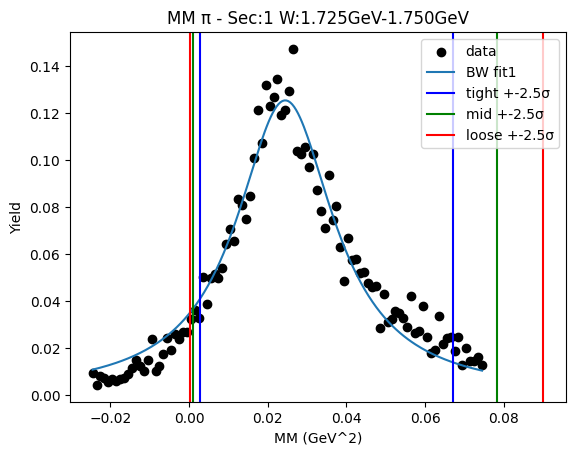

W bin: 14 1.750GeV-1.775GeV
initial bw fit:  [0.01599608 0.15866918 0.09653595]


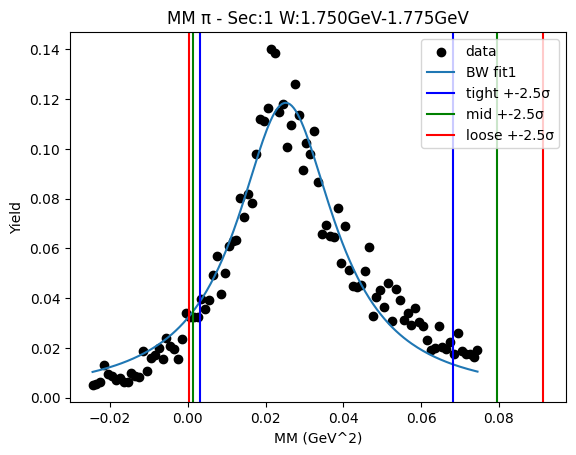

W bin: 15 1.775GeV-1.800GeV
initial bw fit:  [0.01506074 0.16040823 0.1072896 ]


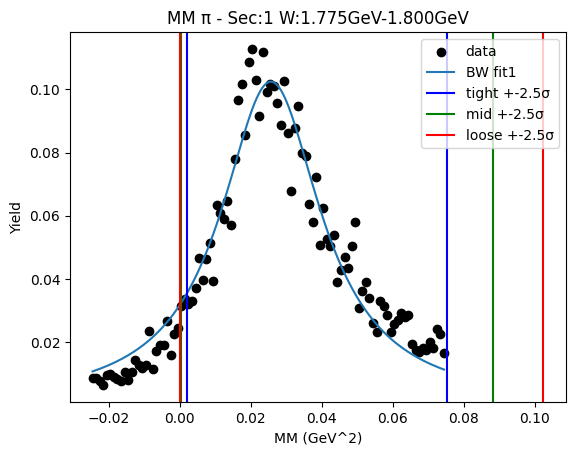

W bin: 16 1.800GeV-1.825GeV
initial bw fit:  [0.01525575 0.1597648  0.11109948]


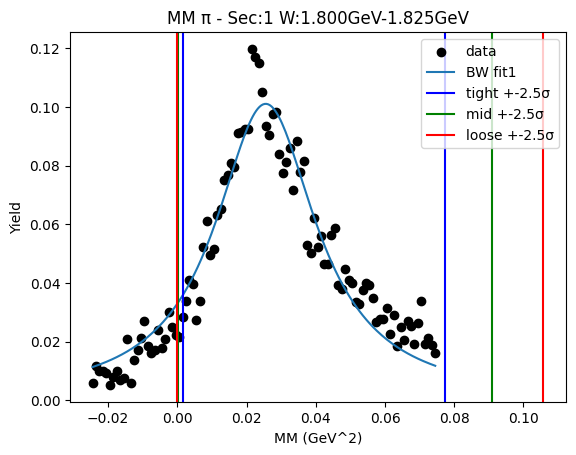

W bin: 17 1.825GeV-1.850GeV
initial bw fit:  [0.01559164 0.15869565 0.12229238]


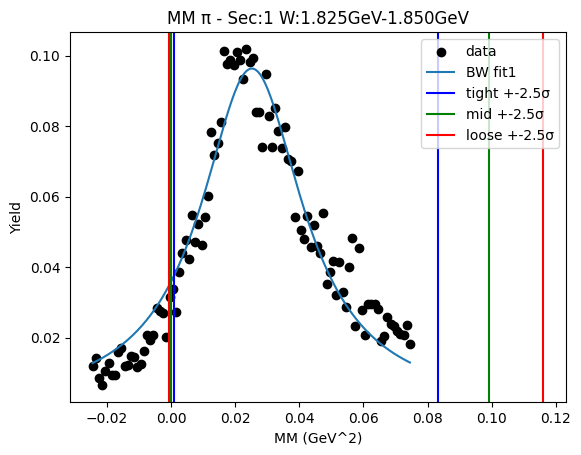

W bin: 18 1.850GeV-1.875GeV
initial bw fit:  [0.01613664 0.16017297 0.11766792]


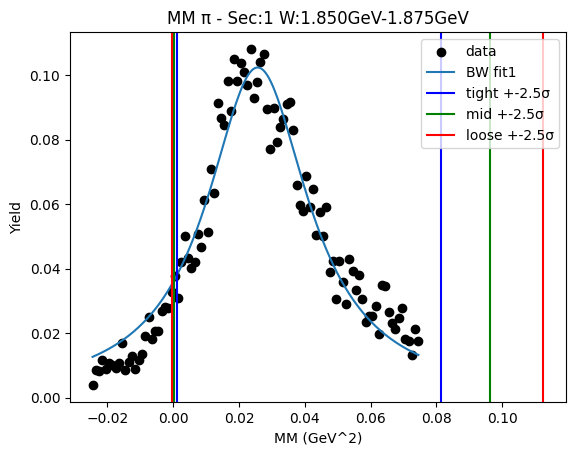

W bin: 19 1.875GeV-1.900GeV
initial bw fit:  [0.01604222 0.15870023 0.11835683]


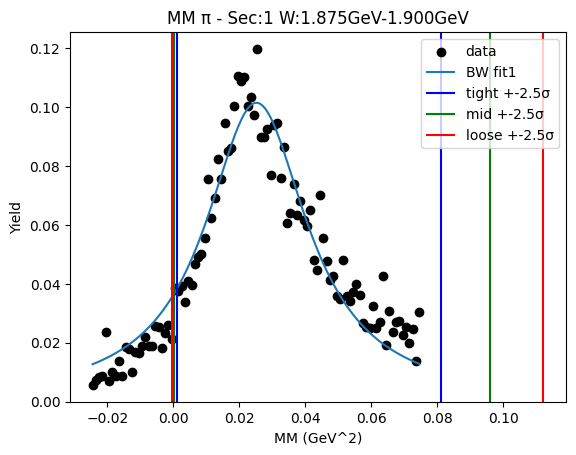

W bin: 20 1.900GeV-1.925GeV
initial bw fit:  [0.01661896 0.15921718 0.1066645 ]
W1_ini_pars: [0.01661896 0.15921718 0.1066645  0.04       0.3        0.06742853
 0.04       0.4        0.10165907]
0.00037872297276762834 0.046858077819191886
Breit-Wigner Peak [0.01228576 0.15368279 0.08801454]
Gaus2 [0.02241945 0.04       0.0262229 ]
Gaus3 [0.00545727 0.0800031  0.00838539]


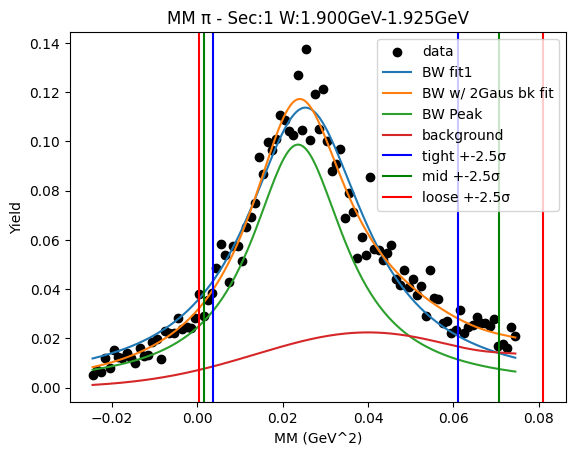

W bin: 21 1.925GeV-1.950GeV
initial bw fit:  [0.01754854 0.15943875 0.11594475]
W1_ini_pars: [0.01754854 0.15943875 0.11594475 0.02241945 0.04       0.0262229
 0.00545727 0.0800031  0.00838539]
-0.0014385732676756822 0.046521120883482064
Breit-Wigner Peak [0.01175164 0.15013752 0.08940516]
Gaus2 [0.03059484 0.04128914 0.02634398]
Gaus3 [0.00524852 0.61538738 0.00399134]


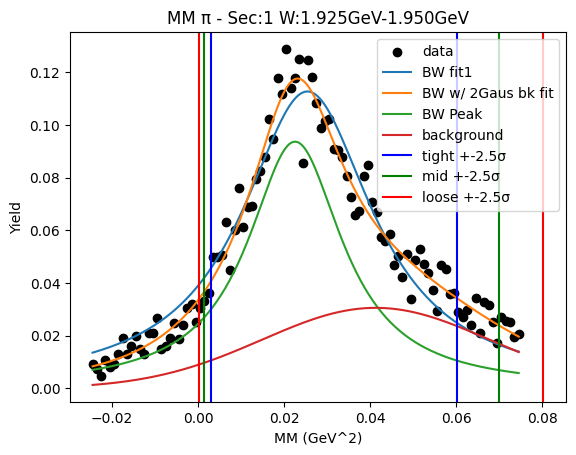

W bin: 22 1.950GeV-1.975GeV
initial bw fit:  [0.01821739 0.15869593 0.11204816]
W1_ini_pars: [0.01821739 0.15869593 0.11204816 0.03059484 0.04128914 0.02634398
 0.00524852 0.61538738 0.00399134]
-0.0039815606693372335 0.04917476743219553
Breit-Wigner Peak [0.01438733 0.15032167 0.09412432]
Gaus2 [0.02441657 0.04712195 0.02353053]
Gaus3 [0.00524852 0.61538738 0.00399134]


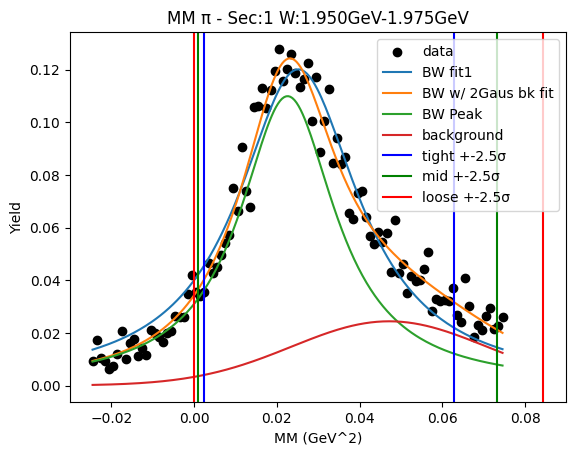

W bin: 23 1.975GeV-2.000GeV
initial bw fit:  [0.01836283 0.15974498 0.11904643]
W1_ini_pars: [0.01836283 0.15974498 0.11904643 0.02441657 0.04712195 0.02353053
 0.00524852 0.61538738 0.00399134]
-0.0029265020066243305 0.04886244662026817
Breit-Wigner Peak [0.01228571 0.15155188 0.09290582]
Gaus2 [0.03018863 0.04       0.02796529]
Gaus3 [0.00524852 0.61538738 0.00399134]


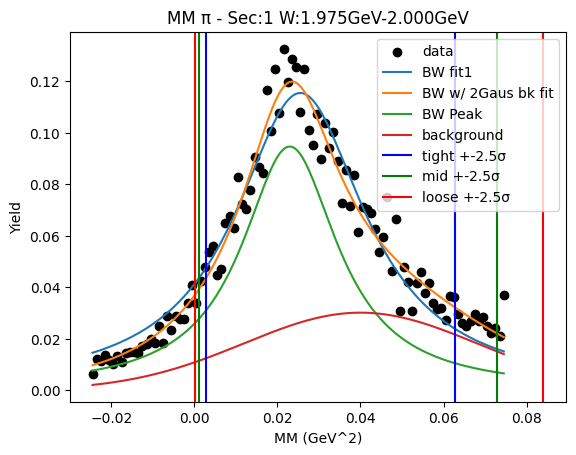

W bin: 24 2.000GeV-2.025GeV
initial bw fit:  [0.01794366 0.15847098 0.11847394]
W1_ini_pars: [0.01794366 0.15847098 0.11847394 0.03018863 0.04       0.02796529
 0.00524852 0.61538738 0.00399134]
-0.0018422197891703358 0.04721734025614055
Breit-Wigner Peak [0.01190188 0.1506239  0.09042452]
Gaus2 [0.02933384 0.04       0.02902307]
Gaus3 [0.00524852 0.61538738 0.00399134]


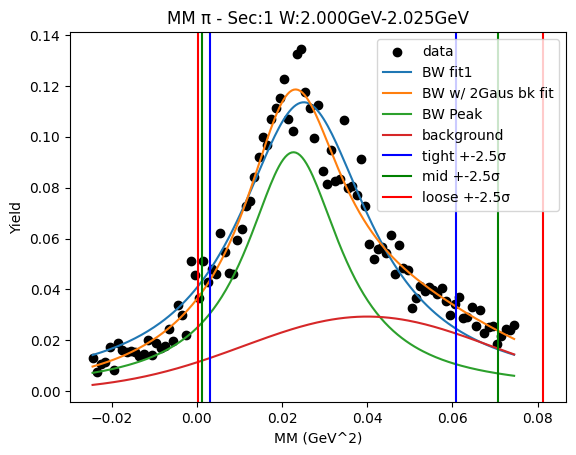

W bin: 25 2.025GeV-2.050GeV
initial bw fit:  [0.0180475  0.15887042 0.11502026]
W1_ini_pars: [0.0180475  0.15887042 0.11502026 0.02933384 0.04       0.02902307
 0.00524852 0.61538738 0.00399134]
-0.00618794683309043 0.05202226125767579
Breit-Wigner Peak [0.01453703 0.15138414 0.09849721]
Gaus2 [0.02133064 0.04776935 0.02512654]
Gaus3 [0.00524852 0.61538738 0.00399134]


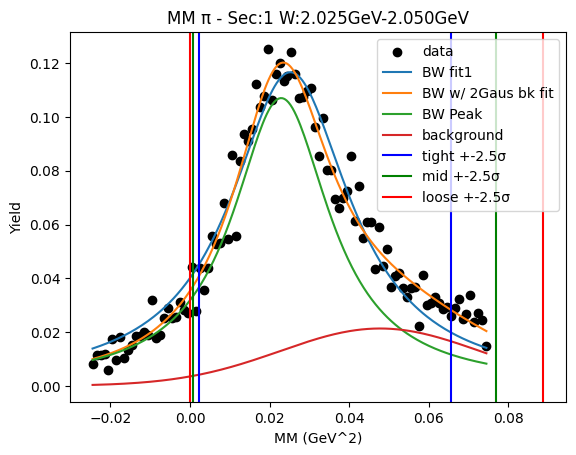

W bin: 26 2.050GeV-2.075GeV
initial bw fit:  [0.01859386 0.16083364 0.12326414]
W1_ini_pars: [0.01859386 0.16083364 0.12326414 0.02133064 0.04776935 0.02512654
 0.00524852 0.61538738 0.00399134]
-0.011061505545855645 0.05595324941408757
Breit-Wigner Peak [0.01463419 0.14981946 0.10568409]
Gaus2 [0.02638574 0.04618095 0.02154531]
Gaus3 [0.00524852 0.61538738 0.00399134]


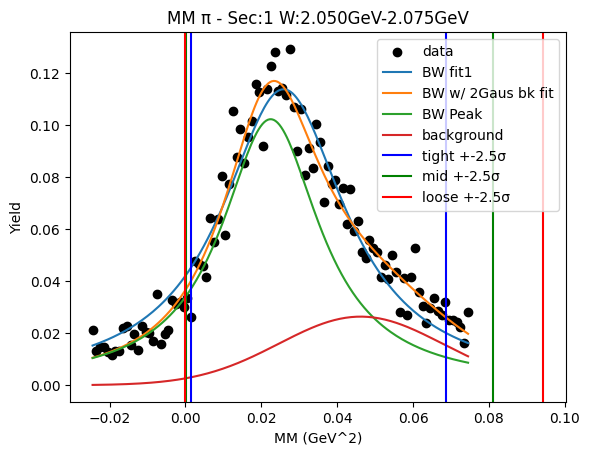

W bin: 27 2.075GeV-2.100GeV
initial bw fit:  [0.01896207 0.15813958 0.12544725]
W1_ini_pars: [0.01896207 0.15813958 0.12544725 0.02638574 0.04618095 0.02154531
 0.00524852 0.61538738 0.00399134]
-0.01535887320423212 0.05917515989148427
Breit-Wigner Peak [0.01433367 0.148014   0.11145555]
Gaus2 [0.02727925 0.04028173 0.02291495]
Gaus3 [0.00524852 0.61538738 0.00399134]


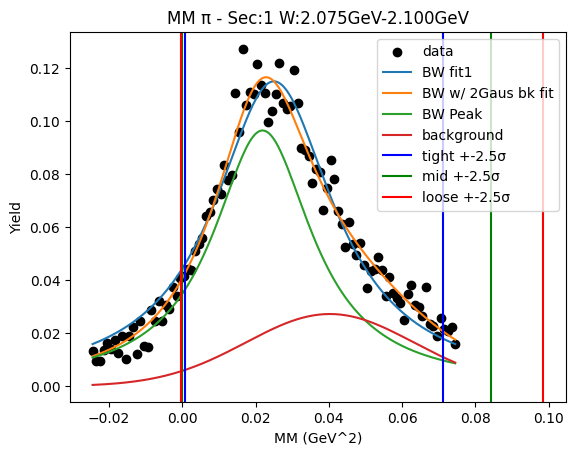

W bin: 28 2.100GeV-2.125GeV
initial bw fit:  [0.01976636 0.15922245 0.12054747]
W1_ini_pars: [0.01976636 0.15922245 0.12054747 0.02727925 0.04028173 0.02291495
 0.00524852 0.61538738 0.00399134]
-0.010357258549424181 0.05622003436215858
Breit-Wigner Peak [0.01659693 0.15143113 0.10533858]
Gaus2 [0.02104973 0.05003037 0.02342812]
Gaus3 [0.00524852 0.61538738 0.00399134]


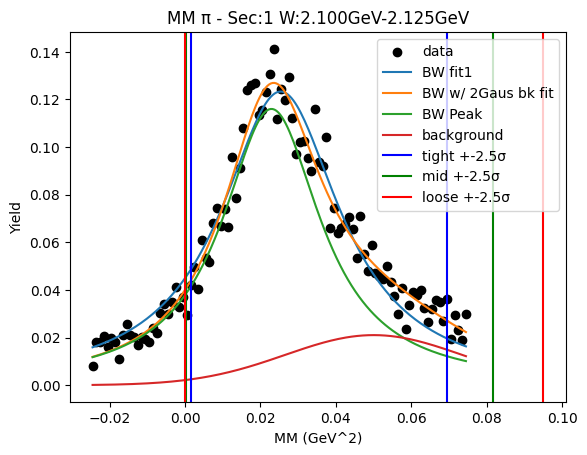

initial bw fit:  [0.20202967 0.15870527 0.11862785]
-0.007916722431890098 0.05314062108740494
Breit-Wigner Peak [0.16173119 0.1503727  0.10087727]
Gaus2 [0.2488379  0.04790677 0.02456763]
Gaus3 [0.14736809 0.63114883 0.0532499 ]


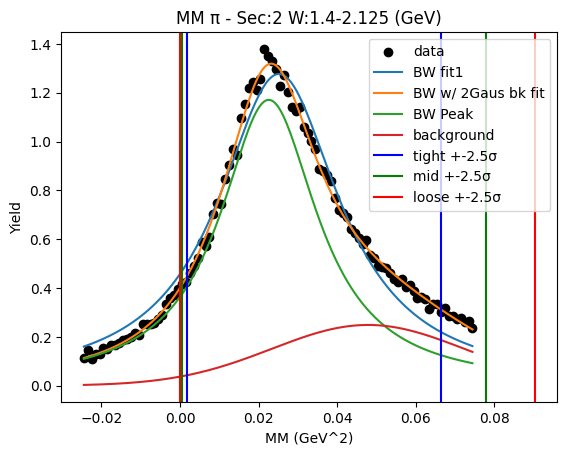

W bin: 1 1.425GeV-1.450GeV
initial bw fit:  [5.95477541e-04 1.22488899e-03 4.54798324e+01]


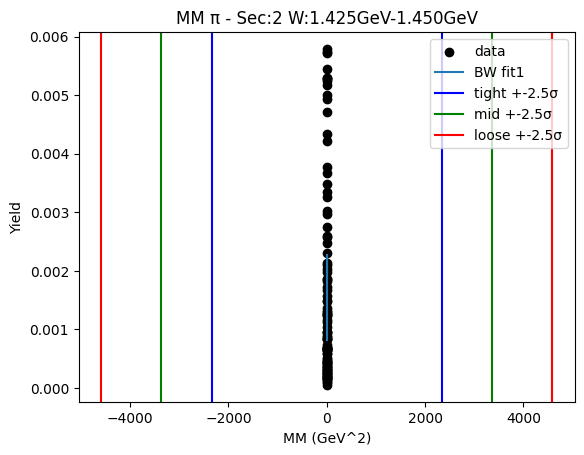

W bin: 2 1.450GeV-1.475GeV
initial bw fit:  [9.12006784e-04 2.07462637e-03 2.90999842e+01]


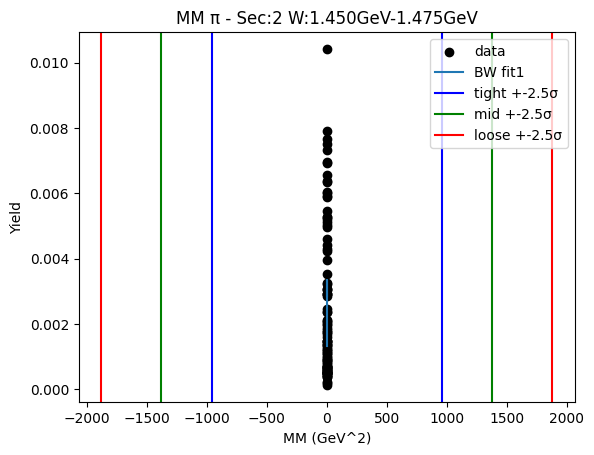

W bin: 3 1.475GeV-1.500GeV
initial bw fit:  [0.00119301 0.15266865 0.08343205]


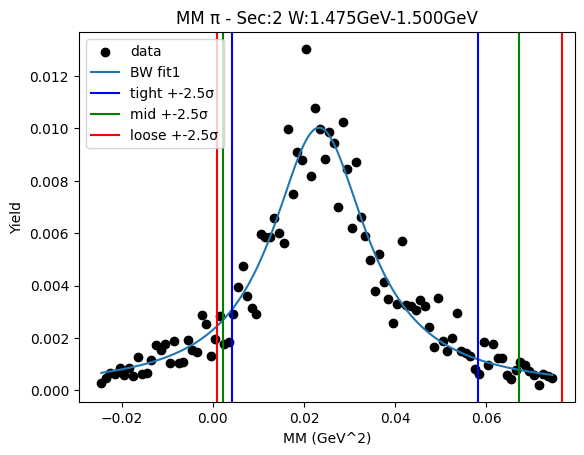

W bin: 4 1.500GeV-1.525GeV
initial bw fit:  [0.00153758 0.15414199 0.08249673]


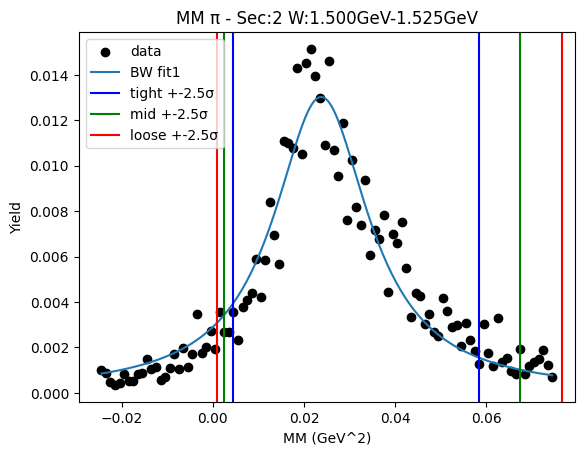

W bin: 5 1.525GeV-1.550GeV
initial bw fit:  [0.00175971 0.15883552 0.09415817]


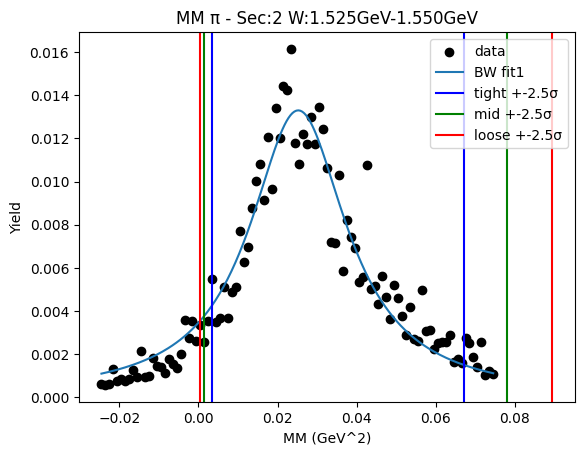

W bin: 6 1.550GeV-1.575GeV
initial bw fit:  [0.0020067  0.15888739 0.09427628]


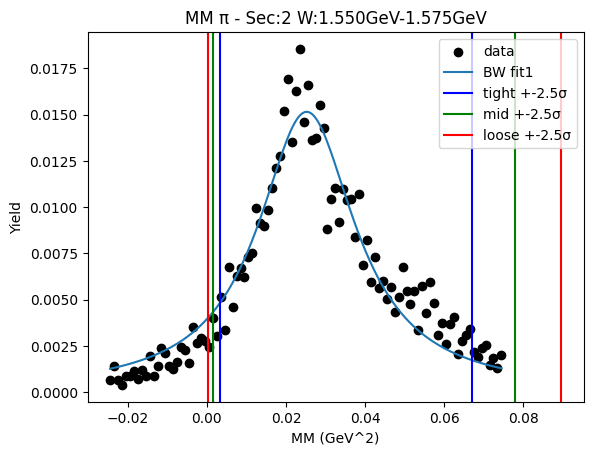

W bin: 7 1.575GeV-1.600GeV
initial bw fit:  [0.00230179 0.15654791 0.11064091]


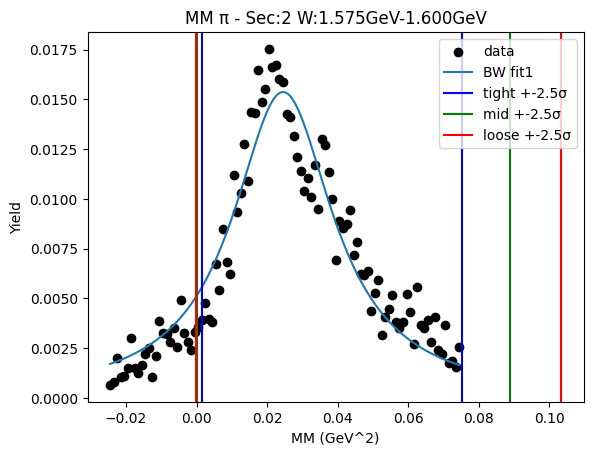

W bin: 8 1.600GeV-1.625GeV
initial bw fit:  [0.00263613 0.15434422 0.10751425]


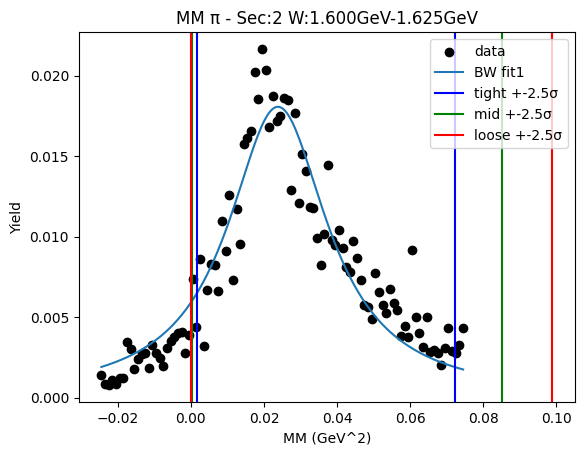

W bin: 9 1.625GeV-1.650GeV
initial bw fit:  [0.00316468 0.15440222 0.11223241]


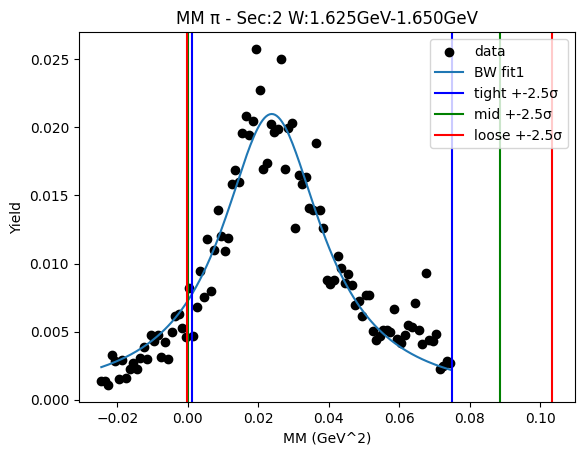

W bin: 10 1.650GeV-1.675GeV
initial bw fit:  [0.00378135 0.15510002 0.11018558]


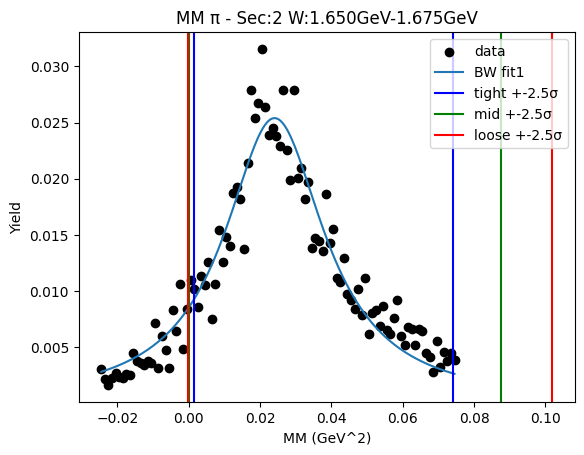

W bin: 11 1.675GeV-1.700GeV
initial bw fit:  [0.00484387 0.15420597 0.10067062]


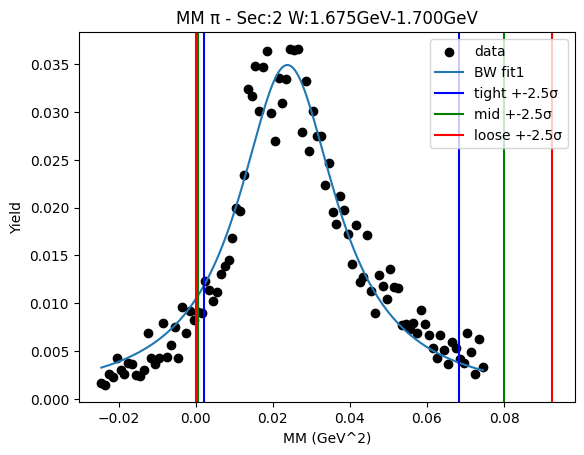

W bin: 12 1.700GeV-1.725GeV
initial bw fit:  [0.00609385 0.154677   0.10650835]


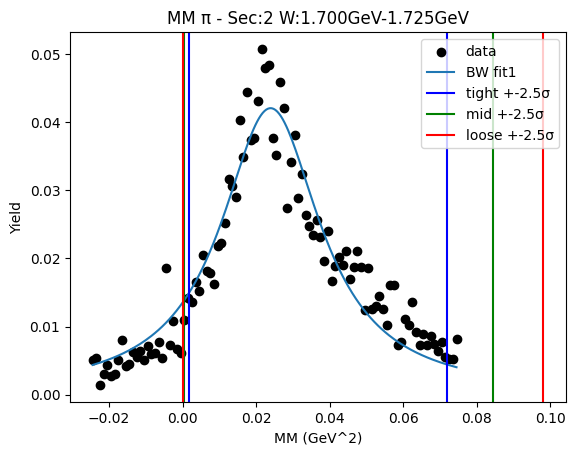

W bin: 13 1.725GeV-1.750GeV
initial bw fit:  [0.00660608 0.15683211 0.10598526]


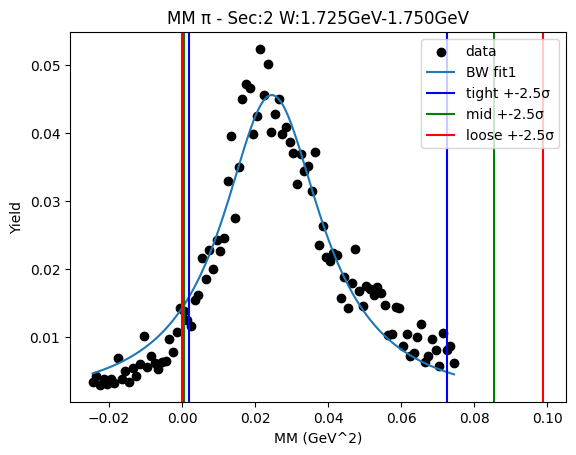

W bin: 14 1.750GeV-1.775GeV
initial bw fit:  [0.00688229 0.16015709 0.10831179]


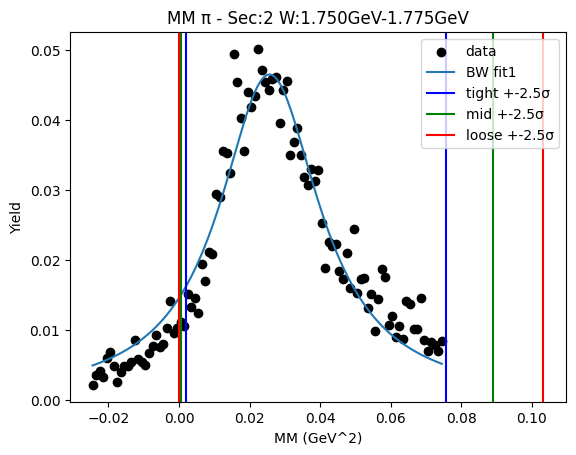

W bin: 15 1.775GeV-1.800GeV
initial bw fit:  [0.00680249 0.16131778 0.11377561]


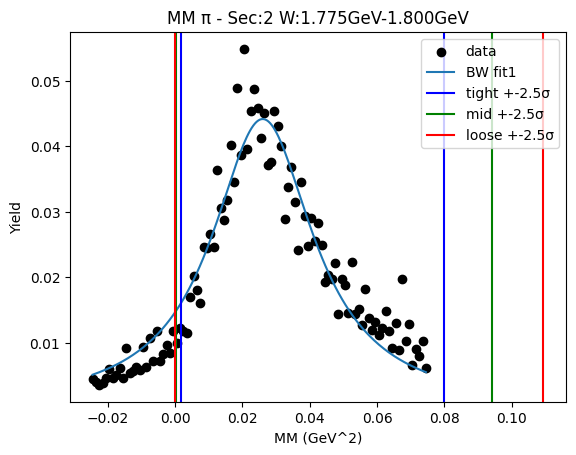

W bin: 16 1.800GeV-1.825GeV
initial bw fit:  [0.00734649 0.16032357 0.11521236]


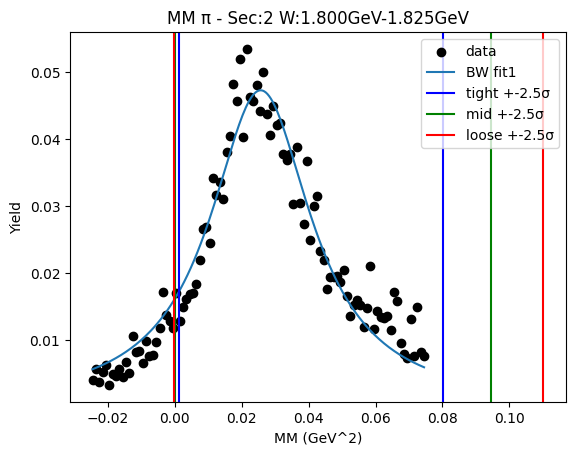

W bin: 17 1.825GeV-1.850GeV
initial bw fit:  [0.00792975 0.16228368 0.12602201]


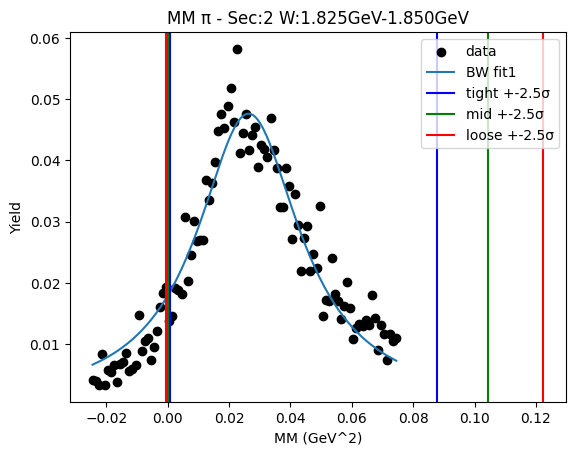

W bin: 18 1.850GeV-1.875GeV
initial bw fit:  [0.00879422 0.15971414 0.12959702]


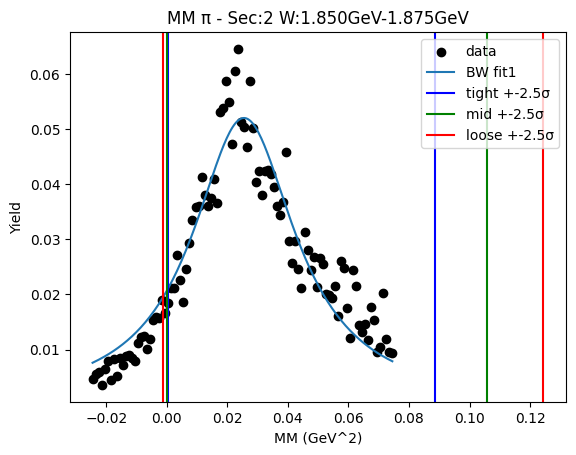

W bin: 19 1.875GeV-1.900GeV
initial bw fit:  [0.00939049 0.16281494 0.12962727]


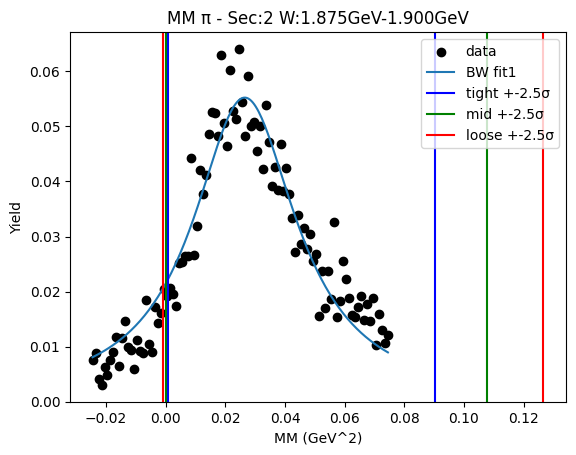

W bin: 20 1.900GeV-1.925GeV
initial bw fit:  [0.01027042 0.15961632 0.11451993]
W1_ini_pars: [0.01027042 0.15961632 0.11451993 0.04       0.3        0.06742853
 0.04       0.4        0.10165907]
0.0013044613189962667 0.044234892826992424
Breit-Wigner Peak [0.00650903 0.15089625 0.08458766]
Gaus2 [0.01894927 0.04       0.0274642 ]
Gaus3 [0.06202715 1.056322   0.1157202 ]


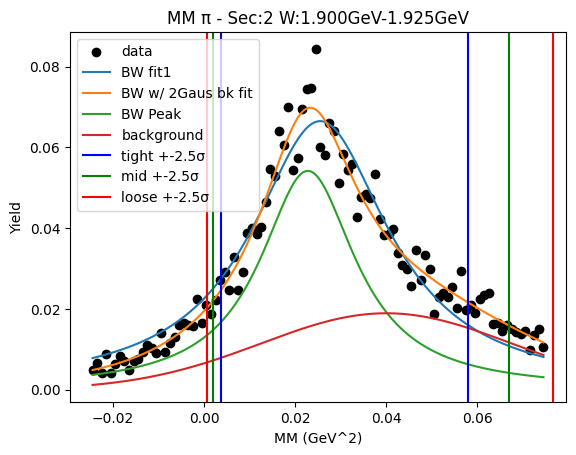

W bin: 21 1.925GeV-1.950GeV
initial bw fit:  [0.01104188 0.1598281  0.12197378]
W1_ini_pars: [0.01104188 0.1598281  0.12197378 0.01894927 0.04       0.0274642
 0.06202715 1.056322   0.1157202 ]
-0.00892631352480568 0.05424280436537807
Breit-Wigner Peak [0.00885696 0.15052656 0.10260695]
Gaus2 [0.0140414  0.05048044 0.02460965]
Gaus3 [0.06202715 1.056322   0.1157202 ]


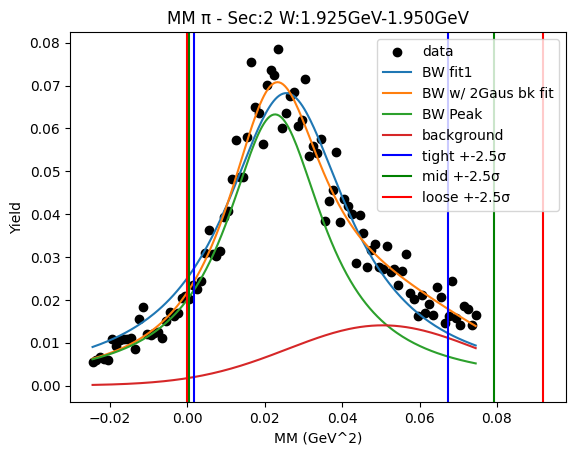

W bin: 22 1.950GeV-1.975GeV
initial bw fit:  [0.01122486 0.15900517 0.12219417]
W1_ini_pars: [0.01122486 0.15900517 0.12219417 0.0140414  0.05048044 0.02460965
 0.06202715 1.056322   0.1157202 ]
-0.009676259363455599 0.055513805412966626
Breit-Wigner Peak [0.0094564  0.15138947 0.10423536]
Gaus2 [0.01228258 0.05791234 0.02699051]
Gaus3 [0.06202715 1.056322   0.1157202 ]


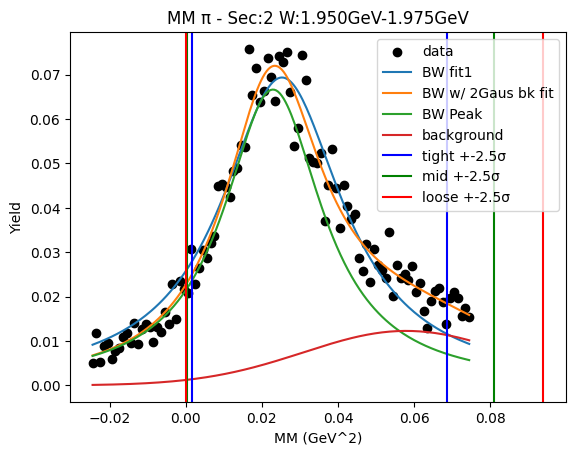

W bin: 23 1.975GeV-2.000GeV
initial bw fit:  [0.01244087 0.15986633 0.11764547]
W1_ini_pars: [0.01244087 0.15986633 0.11764547 0.01228258 0.05791234 0.02699051
 0.06202715 1.056322   0.1157202 ]
-0.008760669186885197 0.05594972651007611
Breit-Wigner Peak [0.01052213 0.15360511 0.10385117]
Gaus2 [0.01191432 0.05262812 0.02723443]
Gaus3 [0.06202715 1.056322   0.1157202 ]


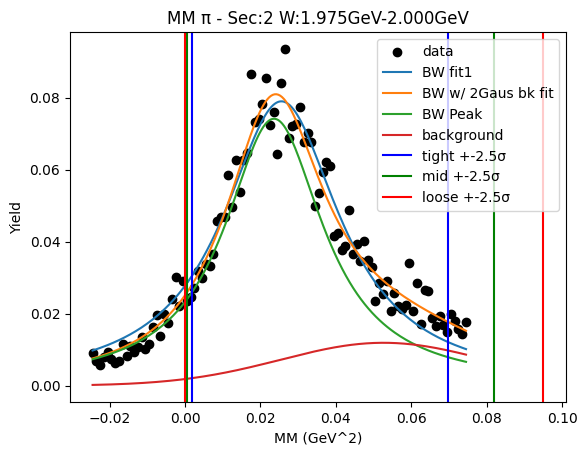

W bin: 24 2.000GeV-2.025GeV
initial bw fit:  [0.01243031 0.16162776 0.12485536]
W1_ini_pars: [0.01243031 0.16162776 0.12485536 0.01191432 0.05262812 0.02723443
 0.06202715 1.056322   0.1157202 ]
-0.001068901697428494 0.048266460589494006
Breit-Wigner Peak [0.00769875 0.15361894 0.09067833]
Gaus2 [0.02145199 0.04092764 0.03240553]
Gaus3 [0.06202715 1.056322   0.1157202 ]


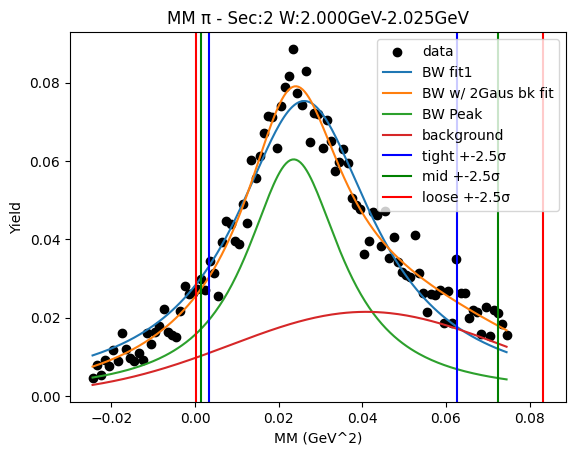

W bin: 25 2.025GeV-2.050GeV
initial bw fit:  [0.01391885 0.16061525 0.12351953]
W1_ini_pars: [0.01391885 0.16061525 0.12351953 0.02145199 0.04092764 0.03240553
 0.06202715 1.056322   0.1157202 ]
-0.008928813964009113 0.05455704793982699
Breit-Wigner Peak [0.0097121  0.15104343 0.10286388]
Gaus2 [0.02242313 0.04000001 0.02534941]
Gaus3 [0.06202715 1.056322   0.1157202 ]


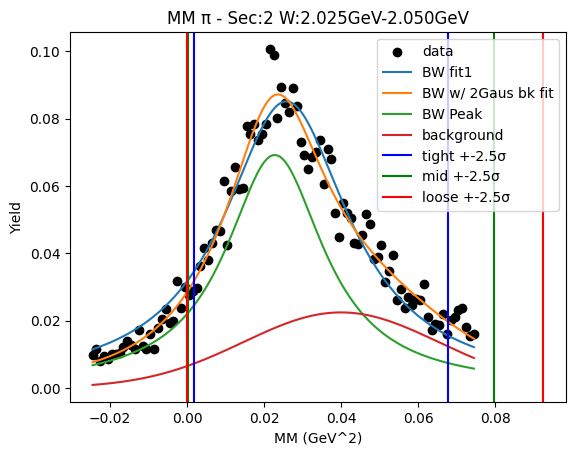

W bin: 26 2.050GeV-2.075GeV
initial bw fit:  [0.01433155 0.15710107 0.13007778]
W1_ini_pars: [0.01433155 0.15710107 0.13007778 0.02242313 0.04000001 0.02534941
 0.06202715 1.056322   0.1157202 ]
-0.01445340900353823 0.05797571144248806
Breit-Wigner Peak [0.0123151  0.14751661 0.10987047]
Gaus2 [0.01697105 0.05368474 0.01954725]
Gaus3 [0.06202715 1.056322   0.1157202 ]


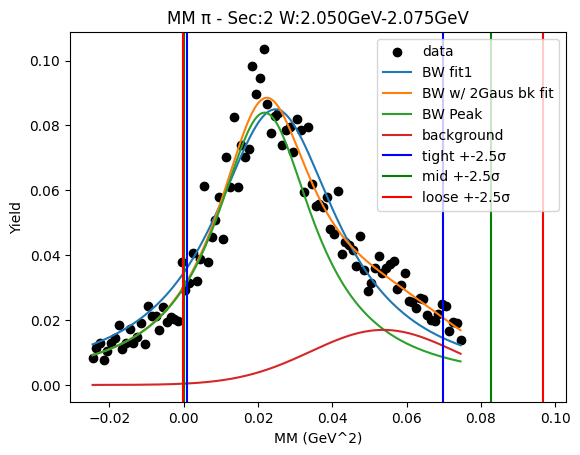

W bin: 27 2.075GeV-2.100GeV
initial bw fit:  [0.01537038 0.15779483 0.1245891 ]
W1_ini_pars: [0.01537038 0.15779483 0.1245891  0.01697105 0.05368474 0.01954725
 0.06202715 1.056322   0.1157202 ]
-0.011104500286954571 0.055705121638664104
Breit-Wigner Peak [0.01187245 0.14933289 0.10552221]
Gaus2 [0.01934367 0.04541645 0.02693572]
Gaus3 [0.06202715 1.056322   0.1157202 ]


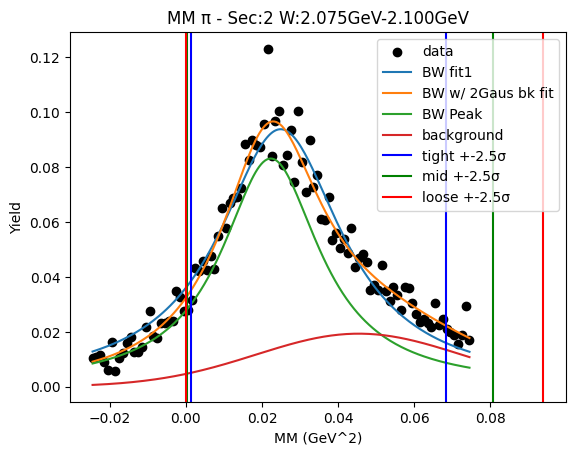

W bin: 28 2.100GeV-2.125GeV
initial bw fit:  [0.01615515 0.15821069 0.12938757]
W1_ini_pars: [0.01615515 0.15821069 0.12938757 0.01934367 0.04541645 0.02693572
 0.06202715 1.056322   0.1157202 ]
-0.008734296725192148 0.05543323316296572
Breit-Wigner Peak [0.01180293 0.15280533 0.10341464]
Gaus2 [0.01861602 0.04456099 0.0385707 ]
Gaus3 [0.06202715 1.056322   0.1157202 ]


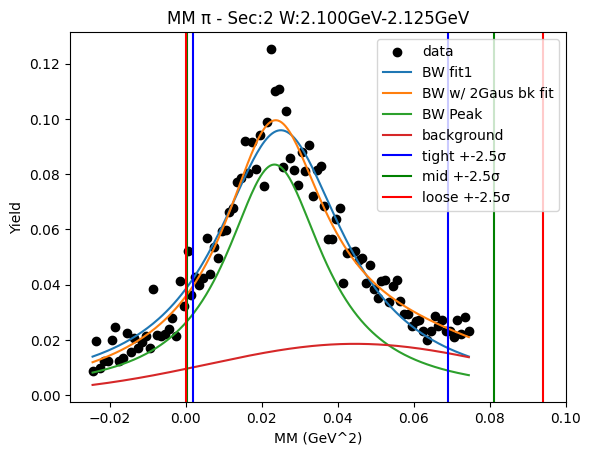

initial bw fit:  [0.09730828 0.15964632 0.11621053]
-0.00459173897089591 0.048742152944052666
Breit-Wigner Peak [0.07558548 0.14857728 0.0942814 ]
Gaus2 [0.0938022 0.04      0.0109863]
Gaus3 [0.09624749 0.08       0.04341419]


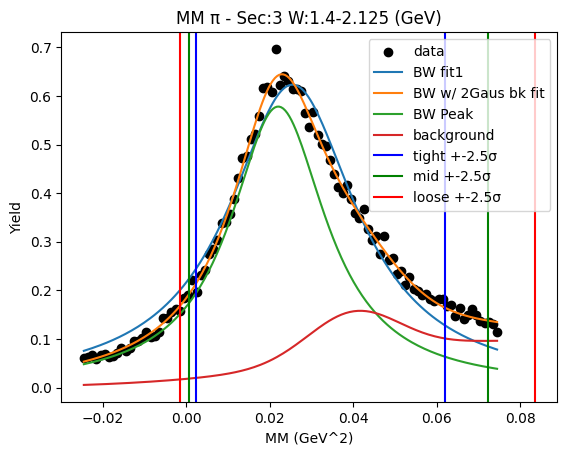

W bin: 1 1.425GeV-1.450GeV
initial bw fit:  [5.73525917e-03 7.49467040e-01 5.76106751e+01]


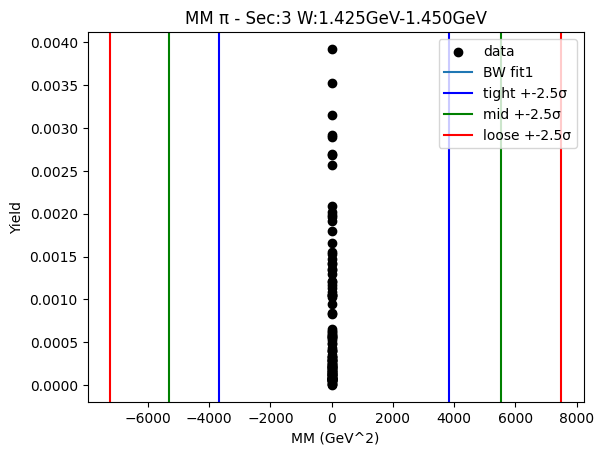

W bin: 2 1.450GeV-1.475GeV
initial bw fit:  [8.30426624e-03 7.49463854e-01 5.76110631e+01]


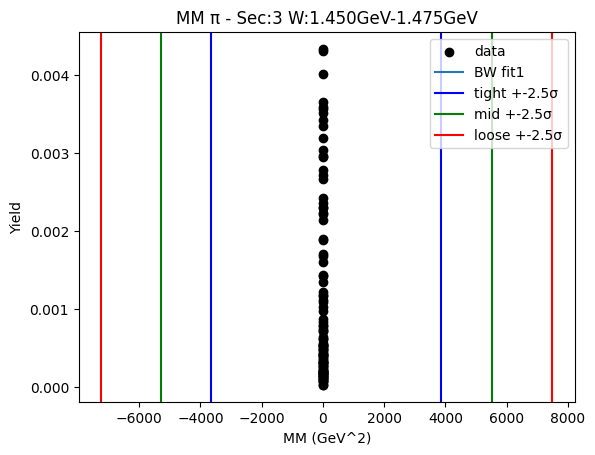

W bin: 3 1.475GeV-1.500GeV
initial bw fit:  [1.17539359e-02 7.49460967e-01 5.76110669e+01]


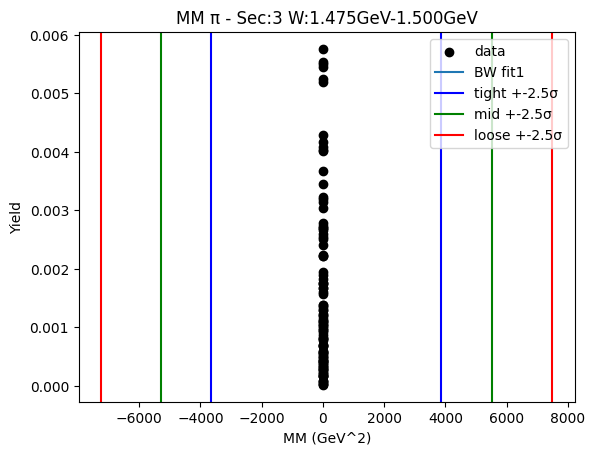

W bin: 4 1.500GeV-1.525GeV
initial bw fit:  [1.46306066e-02 7.49457118e-01 5.76100044e+01]


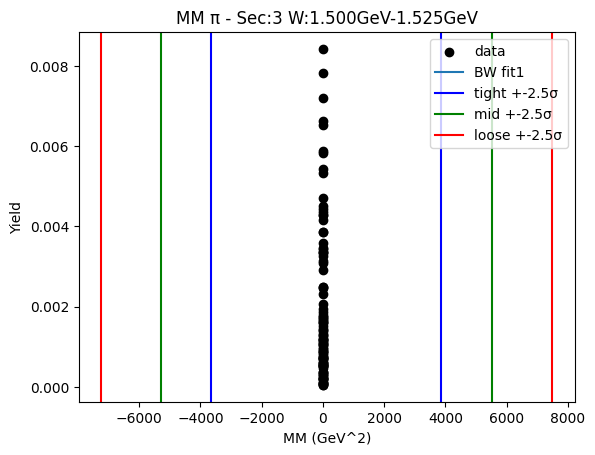

W bin: 5 1.525GeV-1.550GeV
initial bw fit:  [1.70559845e-02 7.49452918e-01 5.76073502e+01]


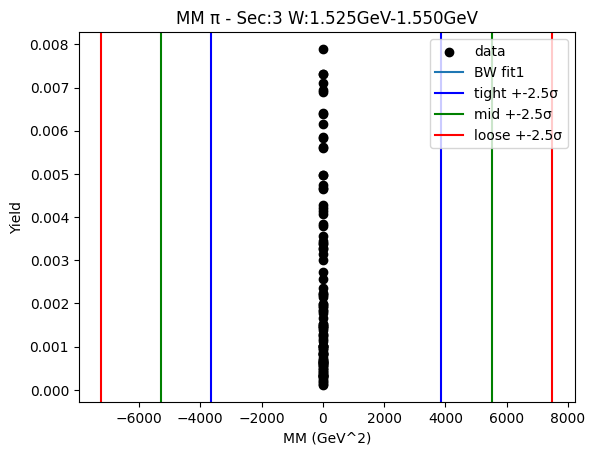

W bin: 6 1.550GeV-1.575GeV
initial bw fit:  [1.88938368e-02 7.49447616e-01 5.76029276e+01]


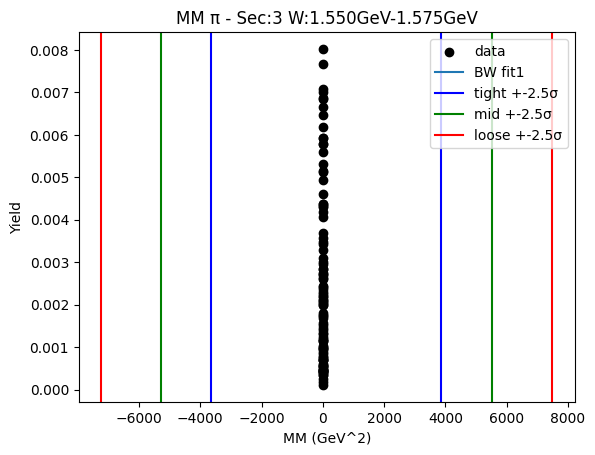

W bin: 7 1.575GeV-1.600GeV
initial bw fit:  [2.11512332e-02 7.49443359e-01 5.75983232e+01]


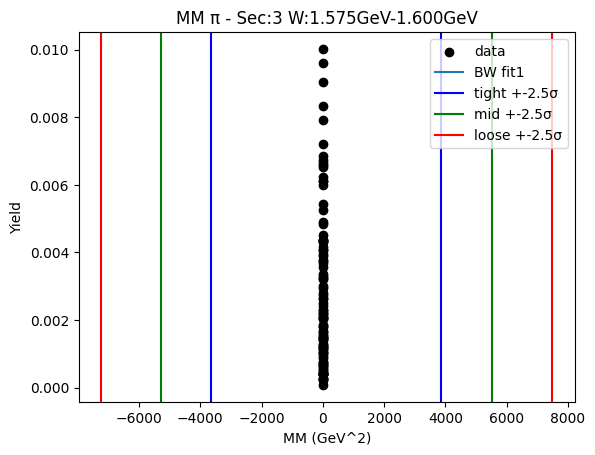

W bin: 8 1.600GeV-1.625GeV
initial bw fit:  [2.38020310e-02 7.49439205e-01 5.75944675e+01]


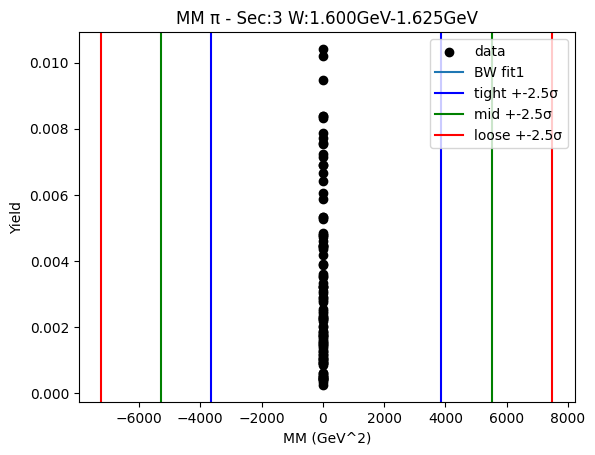

W bin: 9 1.625GeV-1.650GeV
initial bw fit:  [2.82697591e-02 7.49435379e-01 5.75927236e+01]


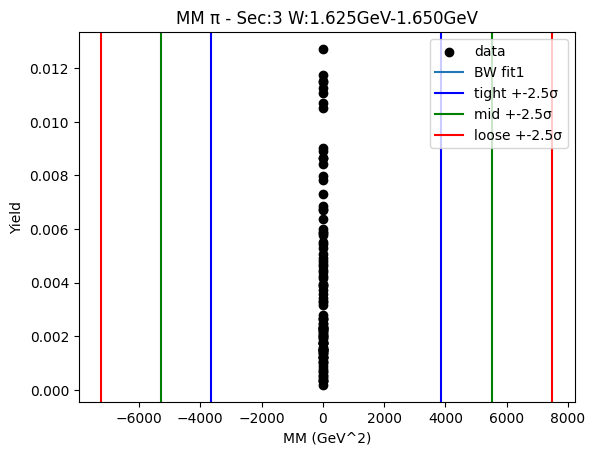

W bin: 10 1.650GeV-1.675GeV
initial bw fit:  [3.69343358e-02 7.49432806e-01 5.75915950e+01]


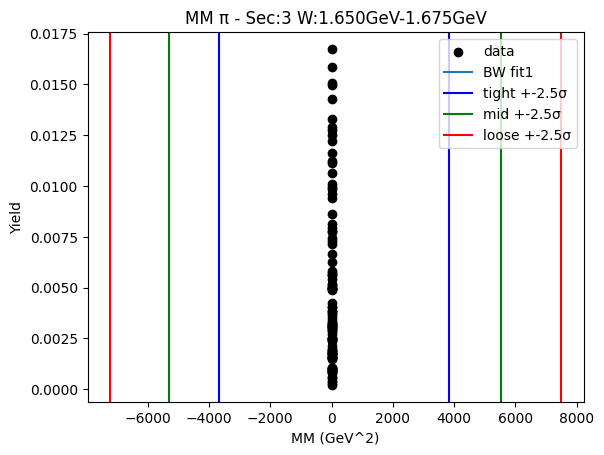

W bin: 11 1.675GeV-1.700GeV
initial bw fit:  [0.00215731 0.15682373 0.09847344]


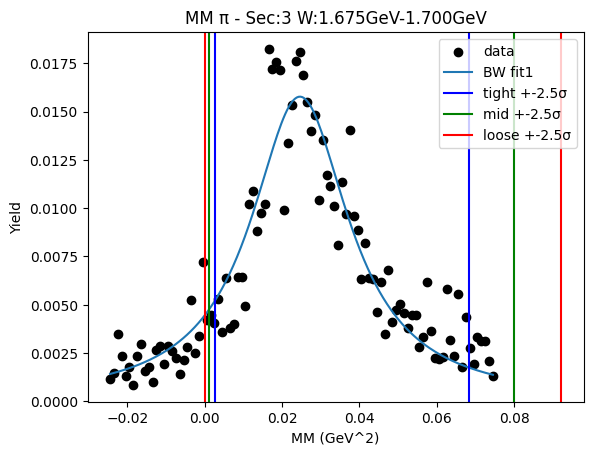

W bin: 12 1.700GeV-1.725GeV
initial bw fit:  [0.00259889 0.15724437 0.09850435]


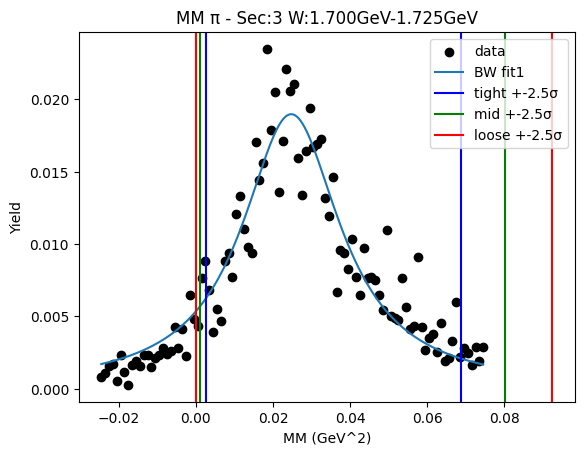

W bin: 13 1.725GeV-1.750GeV
initial bw fit:  [0.00303187 0.15949744 0.09978466]


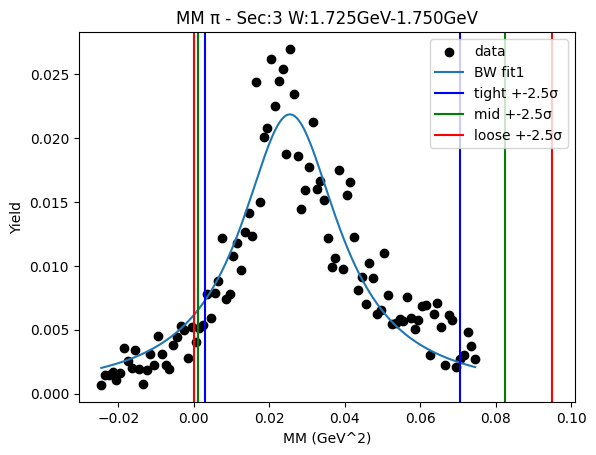

W bin: 14 1.750GeV-1.775GeV
initial bw fit:  [0.00304798 0.16335561 0.10099326]


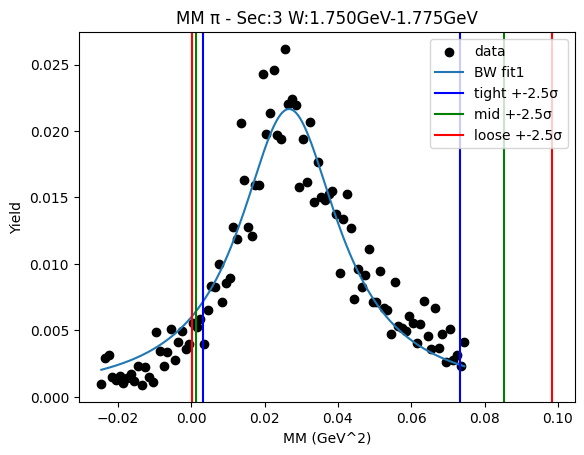

W bin: 15 1.775GeV-1.800GeV
initial bw fit:  [0.00324212 0.16028054 0.11066325]


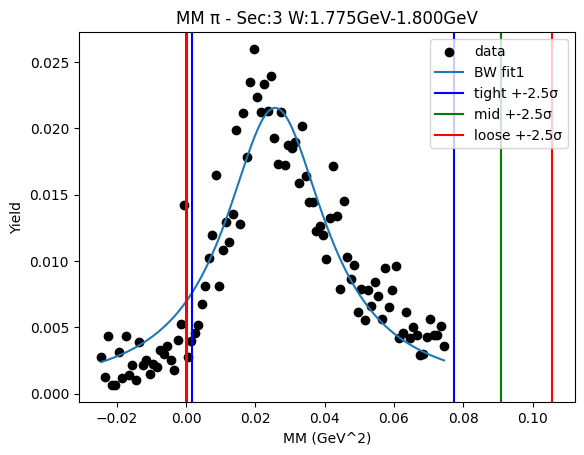

W bin: 16 1.800GeV-1.825GeV
initial bw fit:  [0.00308744 0.16117378 0.10552784]


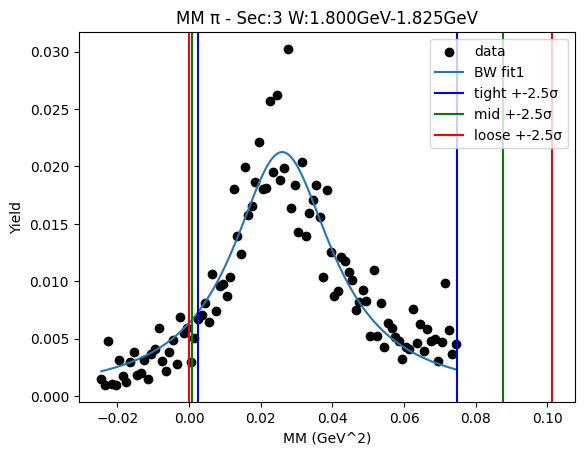

W bin: 17 1.825GeV-1.850GeV
initial bw fit:  [0.0036968  0.15879132 0.11694033]


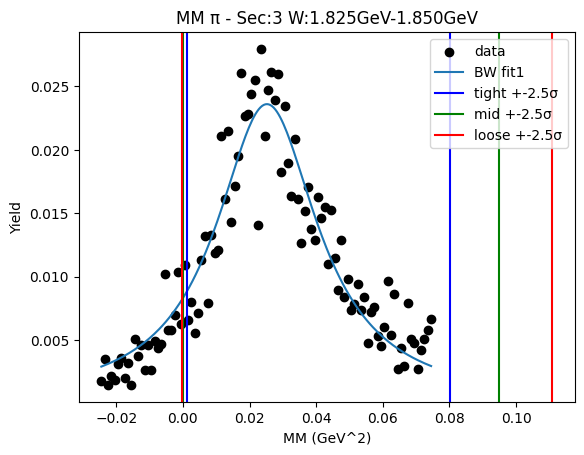

W bin: 18 1.850GeV-1.875GeV
initial bw fit:  [0.00428807 0.15717695 0.11982345]


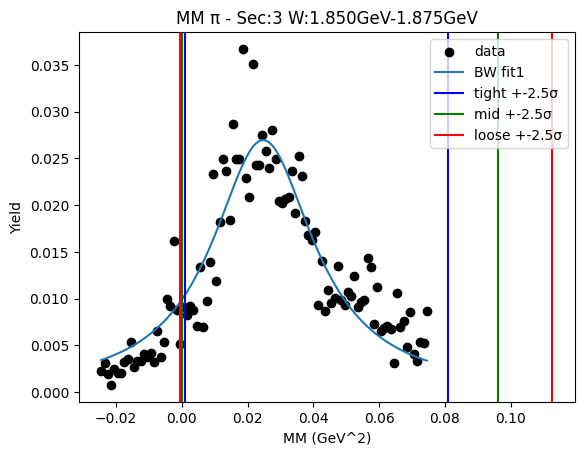

W bin: 19 1.875GeV-1.900GeV
initial bw fit:  [0.004314   0.16173892 0.12626847]


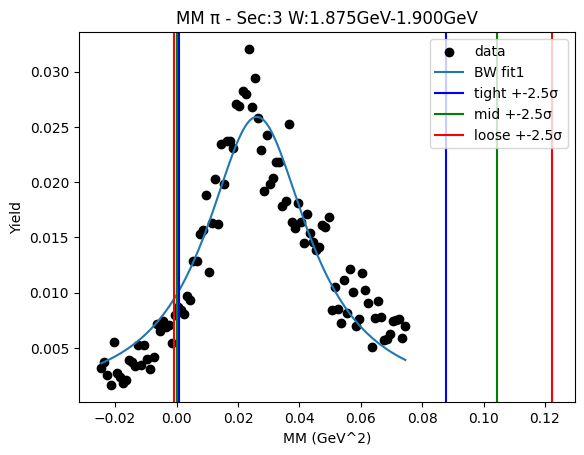

W bin: 20 1.900GeV-1.925GeV
initial bw fit:  [0.00470751 0.16186339 0.12328126]
W1_ini_pars: [0.00470751 0.16186339 0.12328126 0.04       0.3        0.06742853
 0.04       0.4        0.10165907]
-0.0021307018221812003 0.04184455200303322
Breit-Wigner Peak [0.00307356 0.1409146  0.0856108 ]
Gaus2 [0.00967363 0.04       0.01056871]
Gaus3 [0.00469847 0.08       0.053239  ]


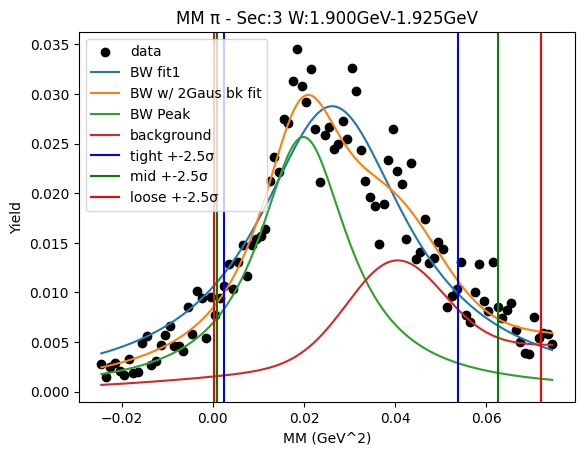

W bin: 21 1.925GeV-1.950GeV
initial bw fit:  [0.00510912 0.16171924 0.11287469]
W1_ini_pars: [0.00510912 0.16171924 0.11287469 0.00967363 0.04       0.01056871
 0.00469847 0.08       0.053239  ]
-0.0014373200354815437 0.04976956069797768
Breit-Wigner Peak [0.00453957 0.15545456 0.09238225]
Gaus2 [0.00505033 0.04776968 0.00546937]
Gaus3 [0.00594598 0.08       0.02252663]


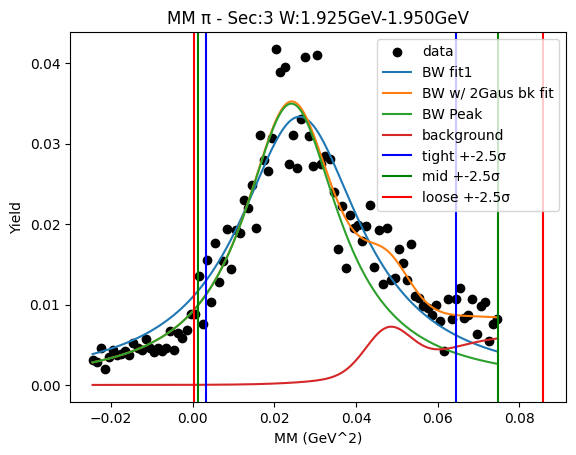

W bin: 22 1.950GeV-1.975GeV
initial bw fit:  [0.00568334 0.16075676 0.12494607]
W1_ini_pars: [0.00568334 0.16075676 0.12494607 0.00505033 0.04776968 0.00546937
 0.00594598 0.08       0.02252663]
-0.008564753425020569 0.05164372406209912
Breit-Wigner Peak [0.00470511 0.14676337 0.10017358]
Gaus2 [0.00823043 0.04085216 0.00901263]
Gaus3 [0.00756552 0.08       0.02140799]


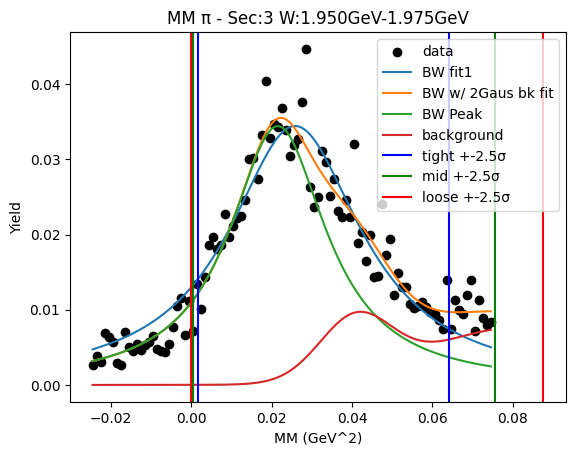

W bin: 23 1.975GeV-2.000GeV
initial bw fit:  [0.00622091 0.16036399 0.12017216]
W1_ini_pars: [0.00622091 0.16036399 0.12017216 0.00823043 0.04085216 0.00901263
 0.00756552 0.08       0.02140799]
-0.007051595685151603 0.05048781326064432
Breit-Wigner Peak [0.0048326  0.14737065 0.09792804]
Gaus2 [0.00731692 0.04039455 0.0106188 ]
Gaus3 [0.00572132 0.08       0.04198818]


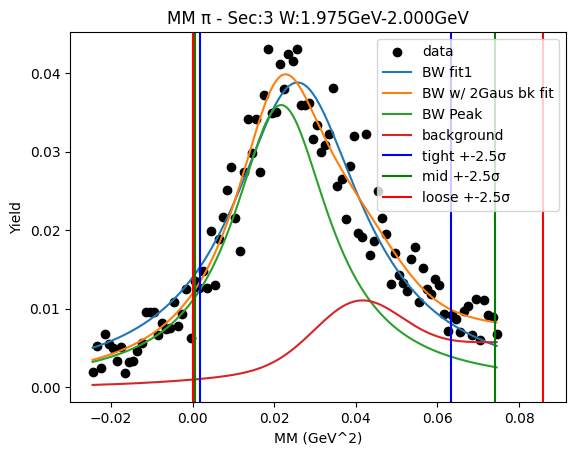

W bin: 24 2.000GeV-2.025GeV
initial bw fit:  [0.00647224 0.16041181 0.12586164]
W1_ini_pars: [0.00647224 0.16041181 0.12586164 0.00731692 0.04039455 0.0106188
 0.00572132 0.08       0.04198818]
-0.007870456103055763 0.05423049616017234
Breit-Wigner Peak [0.00451894 0.15224986 0.10173573]
Gaus2 [0.00949732 0.04       0.02758852]
Gaus3 [0.00266657 0.08000001 0.01173369]


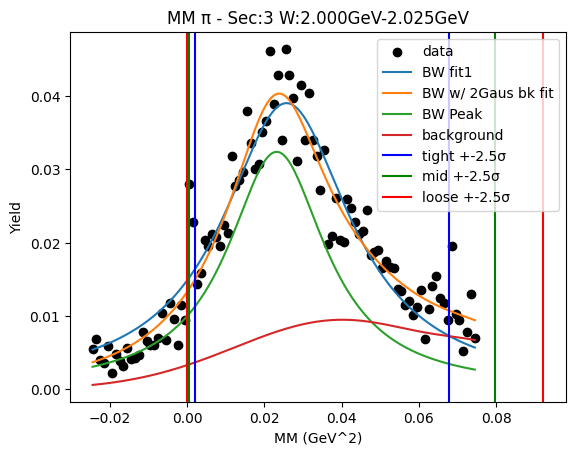

W bin: 25 2.025GeV-2.050GeV
initial bw fit:  [0.00670858 0.16255663 0.12594001]
W1_ini_pars: [0.00670858 0.16255663 0.12594001 0.00949732 0.04       0.02758852
 0.00266657 0.08000001 0.01173369]
-0.012578493090899902 0.061313006828650755
Breit-Wigner Peak [0.00591818 0.15610015 0.1109741 ]
Gaus2 [0.00671502 0.07172184 0.03071916]
Gaus3 [0.00227034 0.61215668 0.00701179]


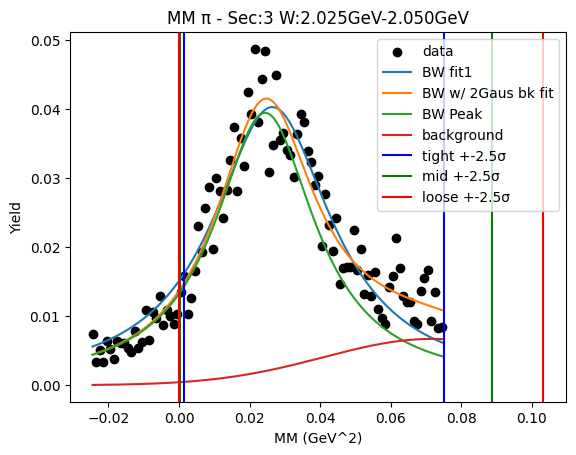

W bin: 26 2.050GeV-2.075GeV
initial bw fit:  [0.00740968 0.16024272 0.12079753]
W1_ini_pars: [0.00740968 0.16024272 0.12079753 0.00671502 0.07172184 0.03071916
 0.00227034 0.61215668 0.00701179]
-0.0046698434276965725 0.05213039538063989
Breit-Wigner Peak [0.00554761 0.15404634 0.097297  ]
Gaus2 [0.00900979 0.04987612 0.03495855]
Gaus3 [0.00227034 0.61215668 0.00701179]


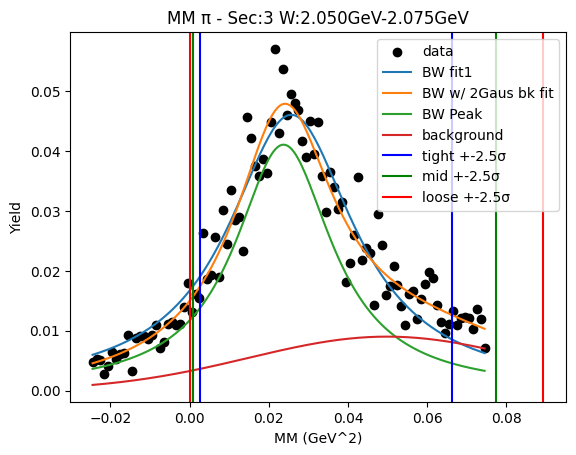

W bin: 27 2.075GeV-2.100GeV
initial bw fit:  [0.00803864 0.16039563 0.1268139 ]
W1_ini_pars: [0.00803864 0.16039563 0.1268139  0.00900979 0.04987612 0.03495855
 0.00227034 0.61215668 0.00701179]
-0.013332863647682103 0.05693822427430853
Breit-Wigner Peak [0.00577521 0.14765731 0.10822129]
Gaus2 [0.01351065 0.04147326 0.02271205]
Gaus3 [0.00227034 0.61215668 0.00701179]


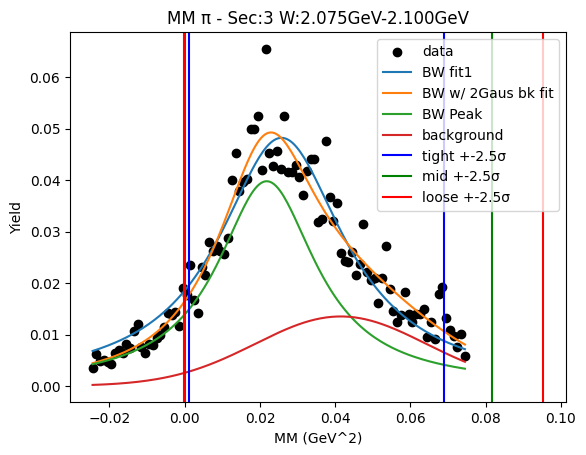

W bin: 28 2.100GeV-2.125GeV
initial bw fit:  [0.00855766 0.15823237 0.13490643]
W1_ini_pars: [0.00855766 0.15823237 0.13490643 0.01351065 0.04147326 0.02271205
 0.00227034 0.61215668 0.00701179]
-0.018827212953997828 0.0619877647748301
Breit-Wigner Peak [0.00637862 0.14690227 0.11605672]
Gaus2 [0.01220261 0.0430041  0.02533531]
Gaus3 [0.00227034 0.61215668 0.00701179]


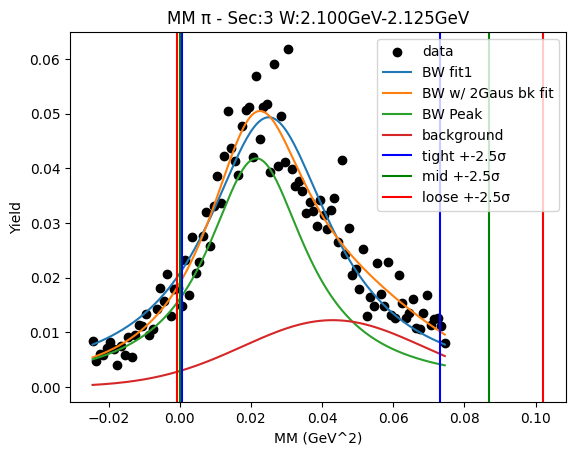

initial bw fit:  [0.2691162  0.15714736 0.10740598]
-0.0010084624425540124 0.04605986559658794
Breit-Wigner Peak [0.20392573 0.15008565 0.08857043]
Gaus2 [0.37384382 0.04303668 0.0246712 ]
Gaus3 [0.51837836 0.69341271 0.02147181]


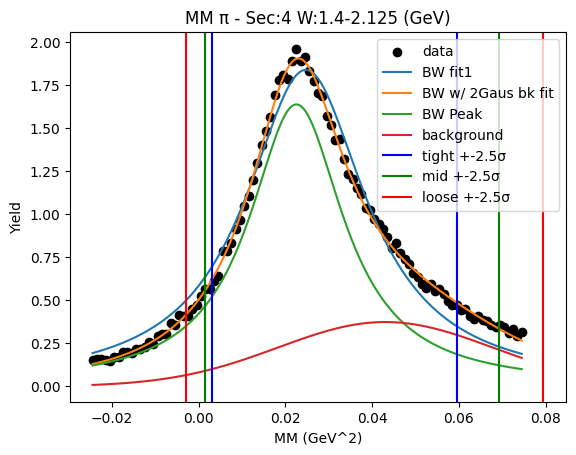

W bin: 1 1.425GeV-1.450GeV
initial bw fit:  [0.00193215 0.14430738 0.07282547]


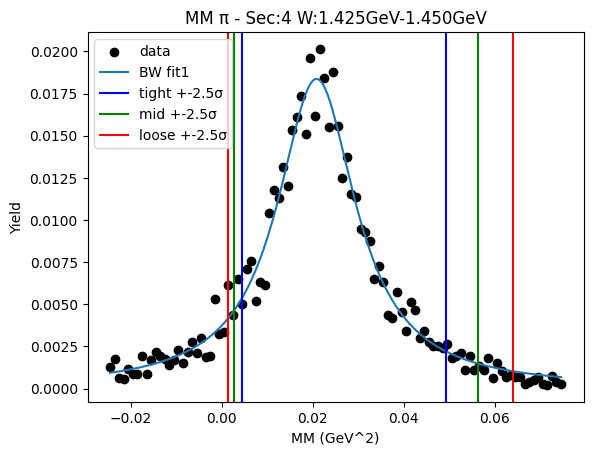

W bin: 2 1.450GeV-1.475GeV
initial bw fit:  [0.00269568 0.14989749 0.07543261]


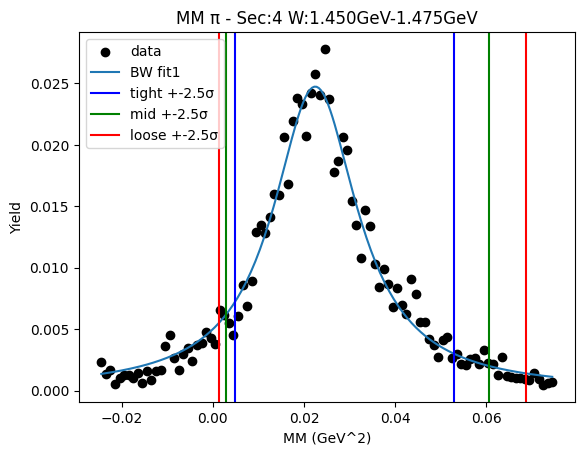

W bin: 3 1.475GeV-1.500GeV
initial bw fit:  [0.00341608 0.15135277 0.07484102]


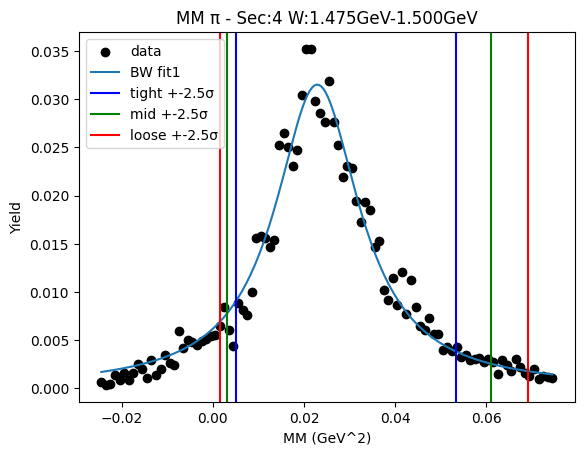

W bin: 4 1.500GeV-1.525GeV
initial bw fit:  [0.00404007 0.15284841 0.07940721]


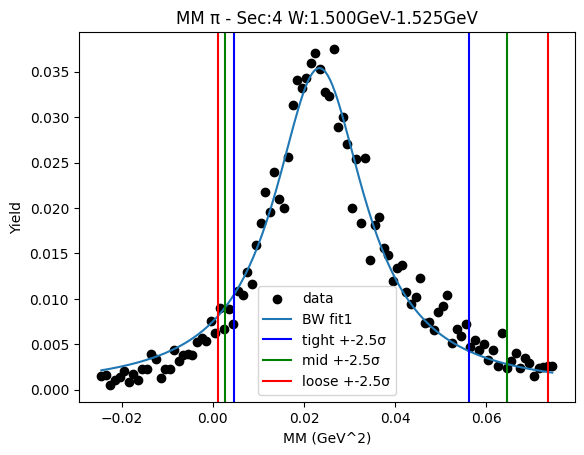

W bin: 5 1.525GeV-1.550GeV
initial bw fit:  [0.0044746  0.15512667 0.0805168 ]


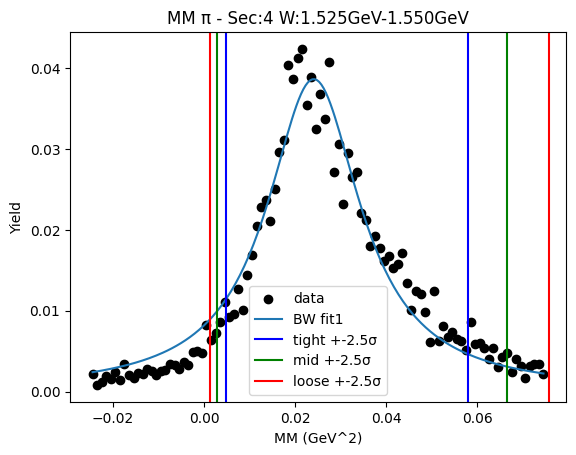

W bin: 6 1.550GeV-1.575GeV
initial bw fit:  [0.00481116 0.1562221  0.08168608]


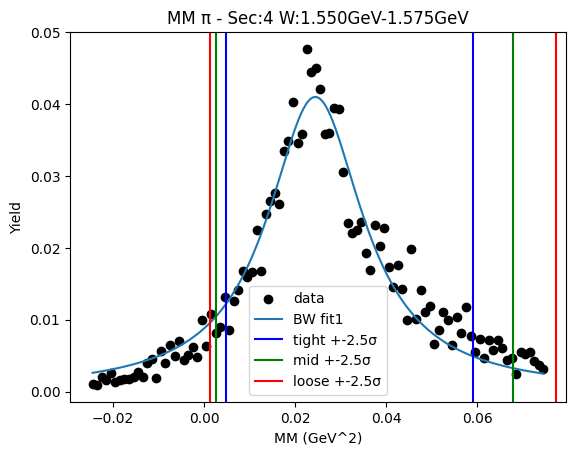

W bin: 7 1.575GeV-1.600GeV
initial bw fit:  [0.00490157 0.15556889 0.09312067]


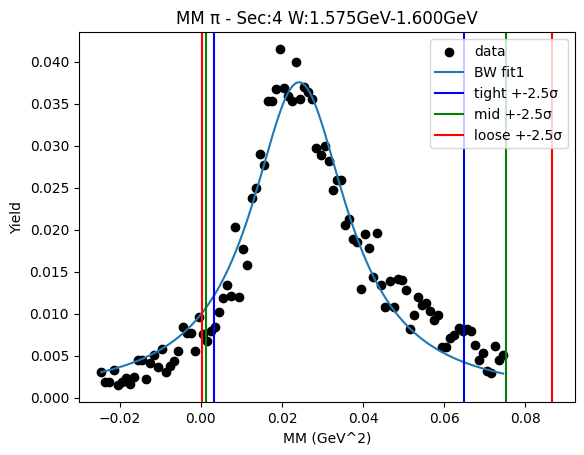

W bin: 8 1.600GeV-1.625GeV
initial bw fit:  [0.00536887 0.15371281 0.09073299]


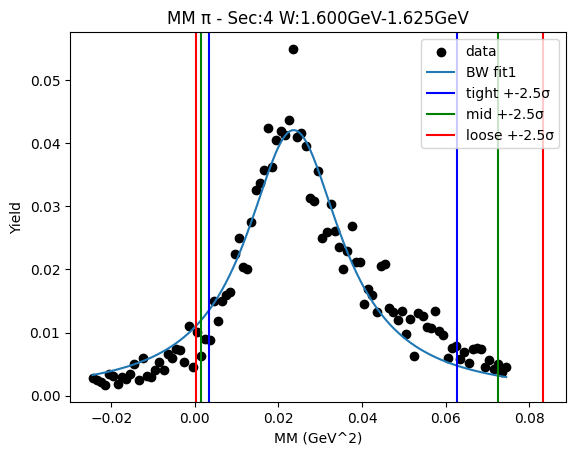

W bin: 9 1.625GeV-1.650GeV
initial bw fit:  [0.00611912 0.15328924 0.0930624 ]


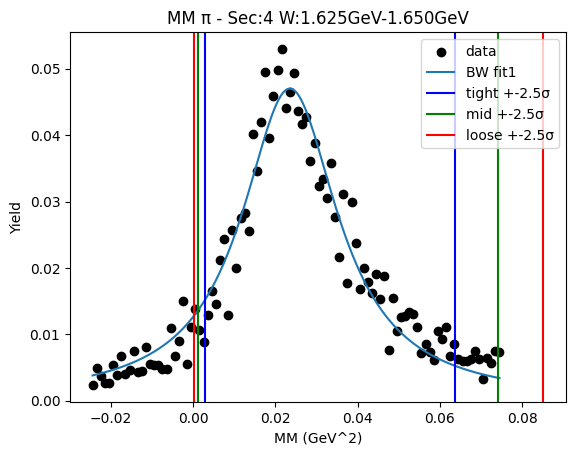

W bin: 10 1.650GeV-1.675GeV
initial bw fit:  [0.00734514 0.15578598 0.09556475]


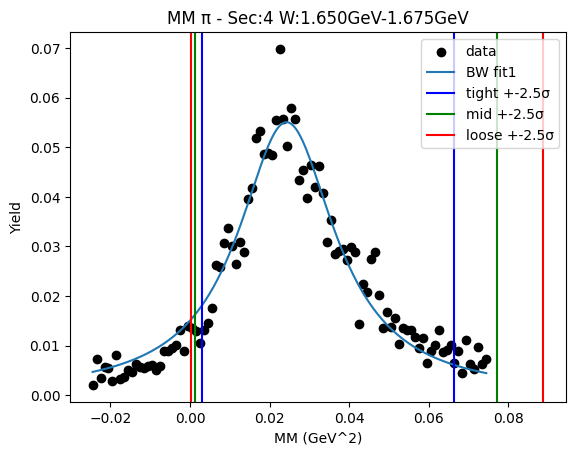

W bin: 11 1.675GeV-1.700GeV
initial bw fit:  [0.00875608 0.15263054 0.09832191]


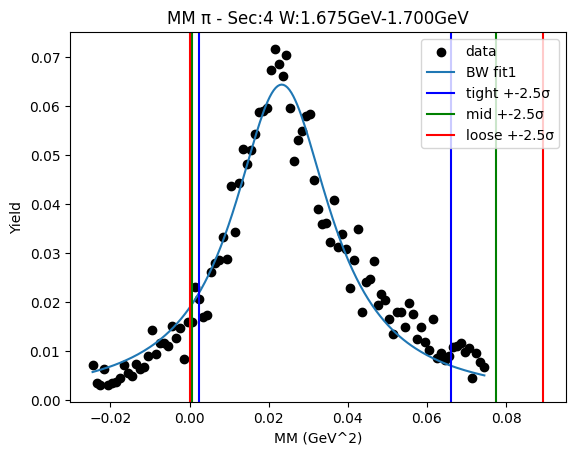

W bin: 12 1.700GeV-1.725GeV
initial bw fit:  [0.01010663 0.15523497 0.09674428]


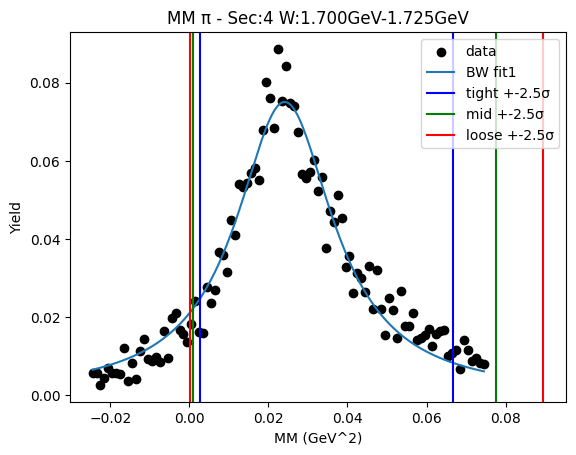

W bin: 13 1.725GeV-1.750GeV
initial bw fit:  [0.0109135  0.15674803 0.09516579]


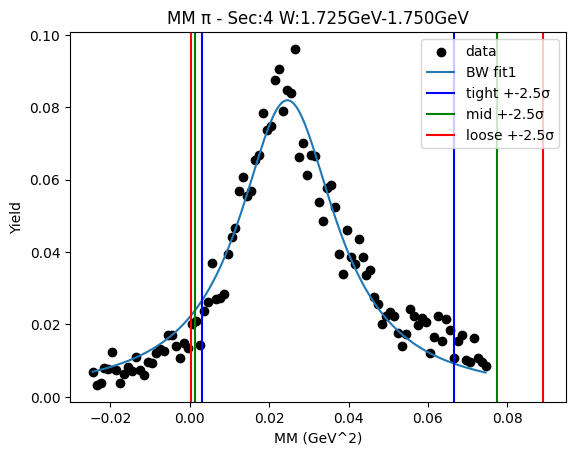

W bin: 14 1.750GeV-1.775GeV
initial bw fit:  [0.01077405 0.15996258 0.09920452]


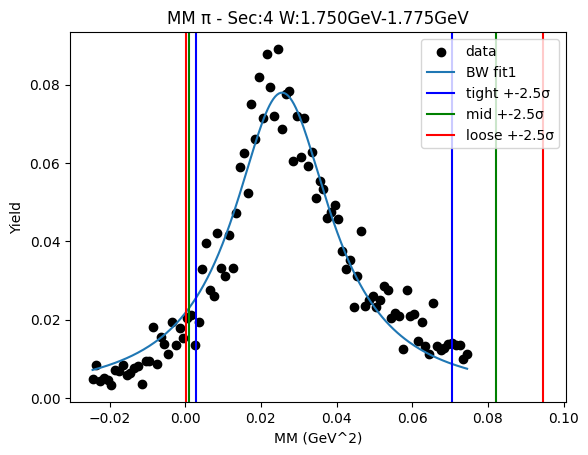

W bin: 15 1.775GeV-1.800GeV
initial bw fit:  [0.01007849 0.16038061 0.10320299]


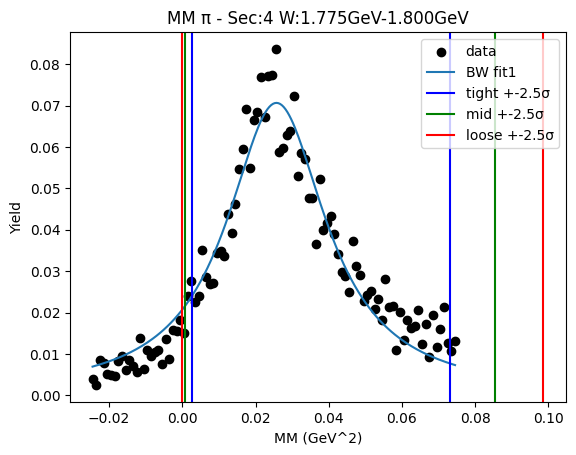

W bin: 16 1.800GeV-1.825GeV
initial bw fit:  [0.01006204 0.16107015 0.11658722]


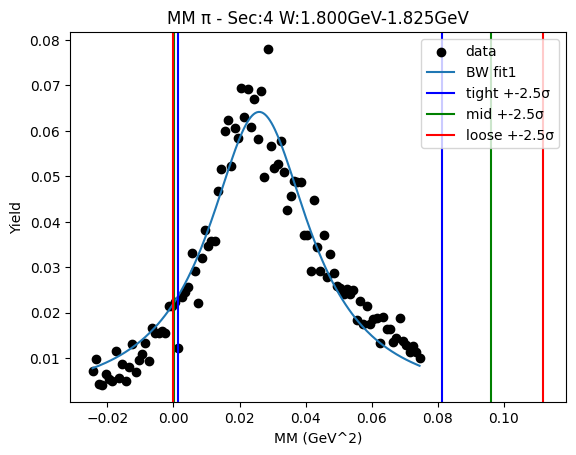

W bin: 17 1.825GeV-1.850GeV
initial bw fit:  [0.01068473 0.1611644  0.1148566 ]


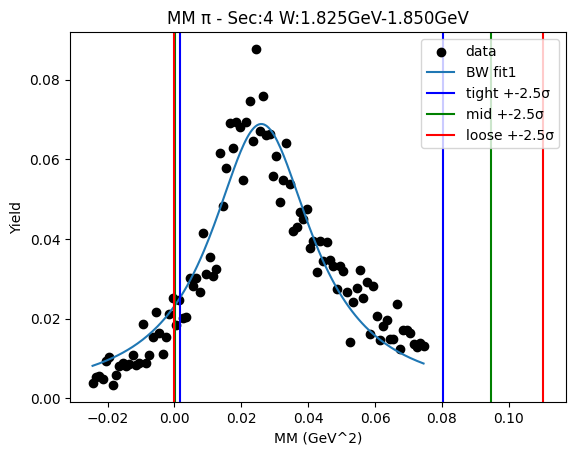

W bin: 18 1.850GeV-1.875GeV
initial bw fit:  [0.01146254 0.16000477 0.11035636]


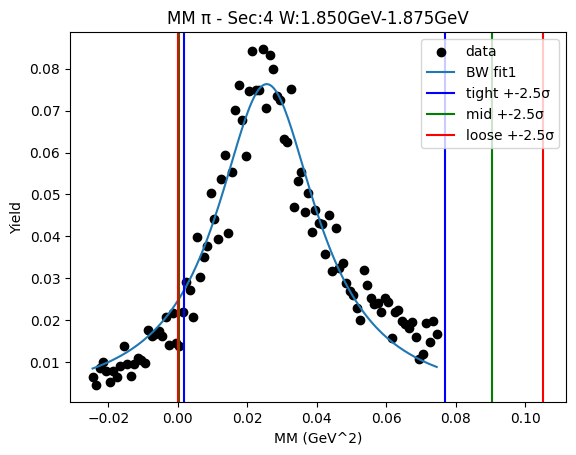

W bin: 19 1.875GeV-1.900GeV
initial bw fit:  [0.01183013 0.15834682 0.11091292]


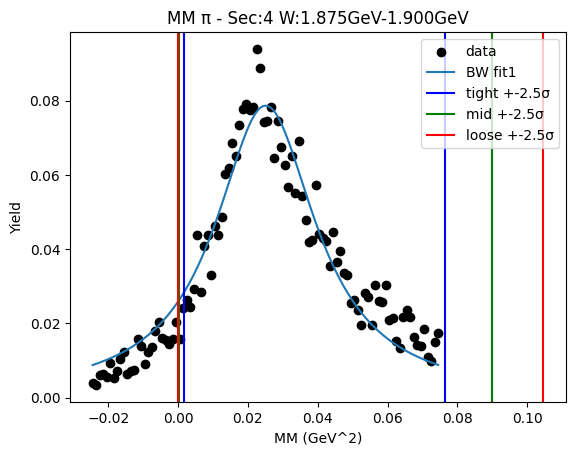

W bin: 20 1.900GeV-1.925GeV
initial bw fit:  [0.0123518  0.1586353  0.11606004]
W1_ini_pars: [0.0123518  0.1586353  0.11606004 0.04       0.3        0.06742853
 0.04       0.4        0.10165907]
-0.002529566725925681 0.04601702960523012
Breit-Wigner Peak [0.0085669  0.14745756 0.08995054]
Gaus2 [0.01758434 0.04       0.01792946]
Gaus3 [8.26633400e+02 2.08524023e+00 4.17184675e-01]


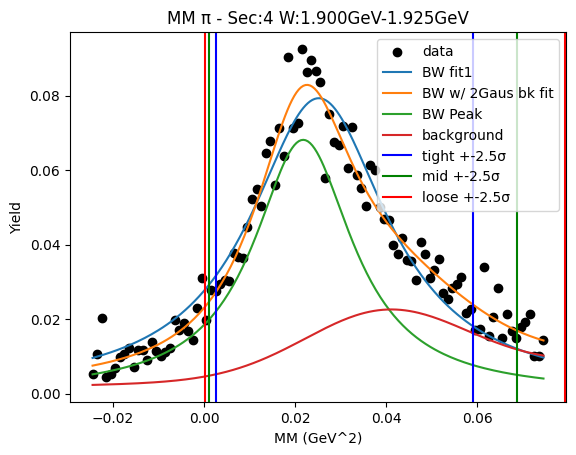

W bin: 21 1.925GeV-1.950GeV
initial bw fit:  [0.01317887 0.15877545 0.1199994 ]
W1_ini_pars: [1.31788680e-02 1.58775453e-01 1.19999400e-01 1.75843361e-02
 4.00000000e-02 1.79294566e-02 8.26633400e+02 2.08524023e+00
 4.17184675e-01]
-0.011595521204761674 0.056676956549023355
Breit-Wigner Peak [0.01113392 0.15013566 0.10667121]
Gaus2 [0.01502671 0.04738814 0.02006474]
Gaus3 [8.27420611e+02 2.75853130e+00 2.01834660e-01]


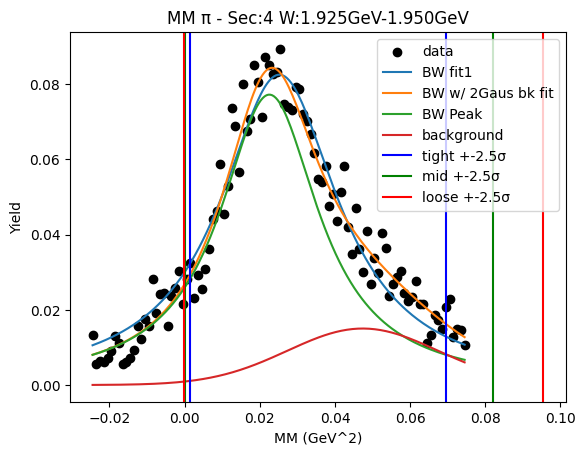

W bin: 22 1.950GeV-1.975GeV
initial bw fit:  [0.01356728 0.15587165 0.11027109]
W1_ini_pars: [1.35672817e-02 1.55871650e-01 1.10271090e-01 1.50267112e-02
 4.73881369e-02 2.00647448e-02 8.27420611e+02 2.75853130e+00
 2.01834660e-01]
-0.001922114275058711 0.04680220768668464
Breit-Wigner Peak [0.01079252 0.14980002 0.09011504]
Gaus2 [0.0160241  0.05358833 0.03085303]
Gaus3 [8.27420611e+02 2.75853130e+00 2.01834660e-01]


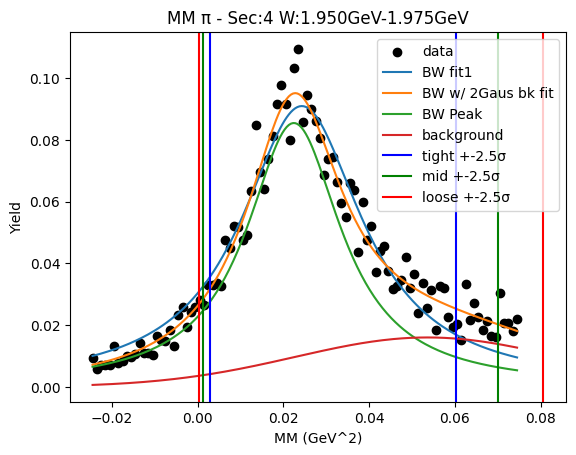

W bin: 23 1.975GeV-2.000GeV
initial bw fit:  [0.01378632 0.15800388 0.11128975]
W1_ini_pars: [1.37863152e-02 1.58003877e-01 1.11289747e-01 1.60241027e-02
 5.35883261e-02 3.08530337e-02 8.27420611e+02 2.75853130e+00
 2.01834660e-01]
-0.0036174001419055045 0.048309865803688776
Breit-Wigner Peak [0.01103383 0.14948656 0.0930298 ]
Gaus2 [0.01852807 0.04667029 0.0215023 ]
Gaus3 [8.27420611e+02 2.75853130e+00 2.01834660e-01]


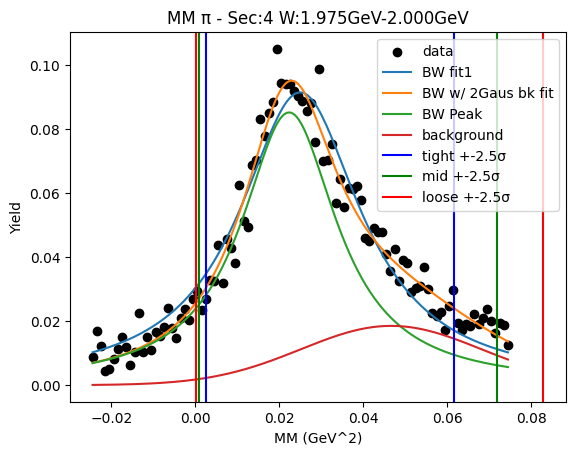

W bin: 24 2.000GeV-2.025GeV
initial bw fit:  [0.0146265  0.15828909 0.11360928]
W1_ini_pars: [1.46265025e-02 1.58289091e-01 1.13609276e-01 1.85280688e-02
 4.66702910e-02 2.15023001e-02 8.27420611e+02 2.75853130e+00
 2.01834660e-01]
-0.006036030738536143 0.05237761945439359
Breit-Wigner Peak [0.01237532 0.15221956 0.09866919]
Gaus2 [0.01467477 0.05465669 0.02725134]
Gaus3 [8.27420611e+02 2.75853130e+00 2.01834660e-01]


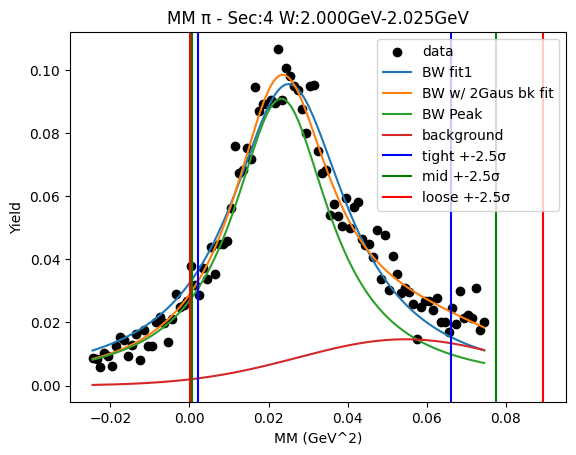

W bin: 25 2.025GeV-2.050GeV
initial bw fit:  [0.01453105 0.15909633 0.12405358]
W1_ini_pars: [1.45310459e-02 1.59096328e-01 1.24053584e-01 1.46747708e-02
 5.46566858e-02 2.72513407e-02 8.27420611e+02 2.75853130e+00
 2.01834660e-01]
-0.010365750378599221 0.05345371251532605
Breit-Wigner Peak [0.01087716 0.14677868 0.10313378]
Gaus2 [0.02338105 0.04508373 0.02250179]
Gaus3 [8.27420611e+02 2.75853130e+00 2.01834660e-01]


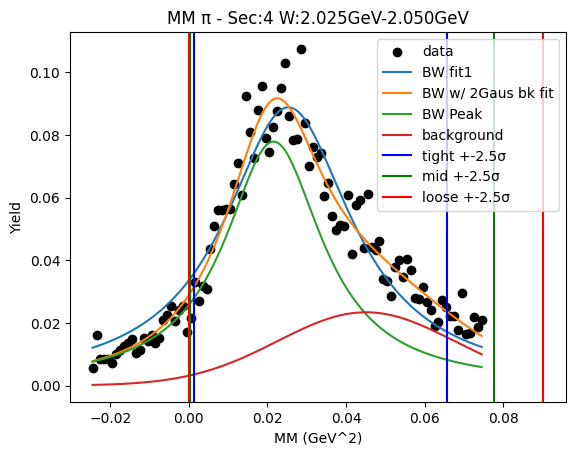

W bin: 26 2.050GeV-2.075GeV
initial bw fit:  [0.0151339  0.15897532 0.12199035]
W1_ini_pars: [1.51338994e-02 1.58975317e-01 1.21990349e-01 2.33810503e-02
 4.50837323e-02 2.25017931e-02 8.27420611e+02 2.75853130e+00
 2.01834660e-01]
-0.011514644875213687 0.056189282014820846
Breit-Wigner Peak [0.01257515 0.14945674 0.10622612]
Gaus2 [0.01859018 0.04961014 0.02157054]
Gaus3 [8.27420611e+02 2.75853130e+00 2.01834660e-01]


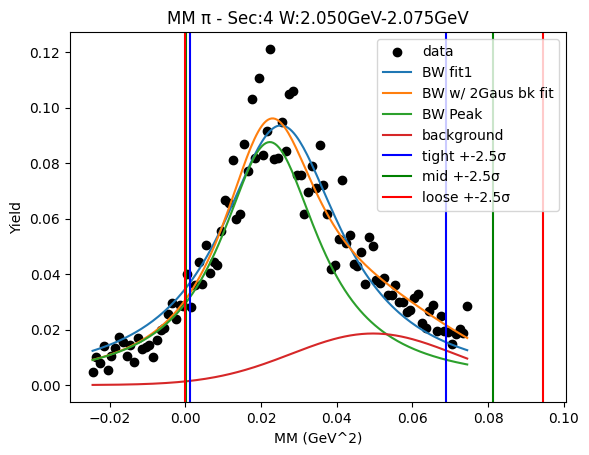

W bin: 27 2.075GeV-2.100GeV
initial bw fit:  [0.01509909 0.15920756 0.12567428]
W1_ini_pars: [1.50990894e-02 1.59207555e-01 1.25674283e-01 1.85901778e-02
 4.96101372e-02 2.15705409e-02 8.27420611e+02 2.75853130e+00
 2.01834660e-01]
-0.014329420926417324 0.06003187320270309
Breit-Wigner Peak [0.01293879 0.15116622 0.11132632]
Gaus2 [0.01541012 0.05381964 0.02415   ]
Gaus3 [8.27420611e+02 2.75853130e+00 2.01834660e-01]


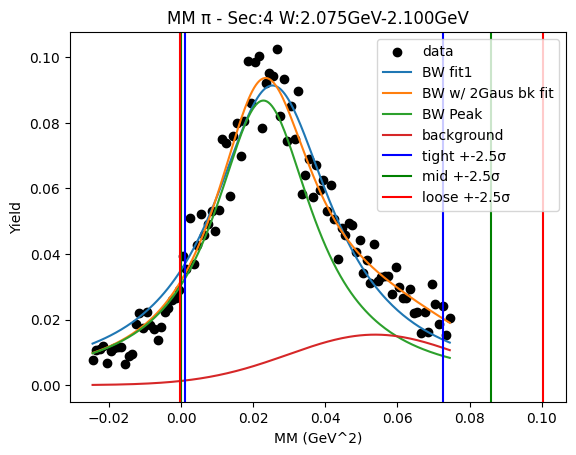

W bin: 28 2.100GeV-2.125GeV
initial bw fit:  [0.01608059 0.15812276 0.1306267 ]
W1_ini_pars: [1.60805903e-02 1.58122762e-01 1.30626699e-01 1.54101222e-02
 5.38196432e-02 2.41500017e-02 8.27420611e+02 2.75853130e+00
 2.01834660e-01]
-0.018377004913202696 0.06425379719911732
Breit-Wigner Peak [0.01425772 0.15145427 0.11735331]
Gaus2 [0.01326692 0.05753706 0.02537538]
Gaus3 [8.27420611e+02 2.75853130e+00 2.01834660e-01]


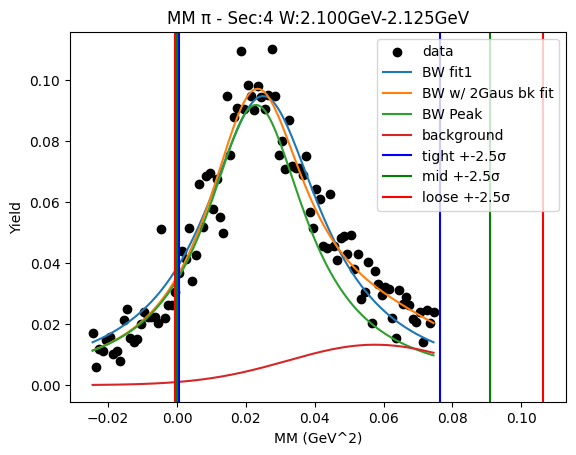

initial bw fit:  [0.7603743  0.15346908 0.10956668]
-0.006592195054643486 0.05186367730116811
Breit-Wigner Peak [0.68701985 0.15045179 0.09870484]
Gaus2 [0.39088207 0.41890045 0.04729469]
Gaus3 [0.5514436  0.08       0.04240601]


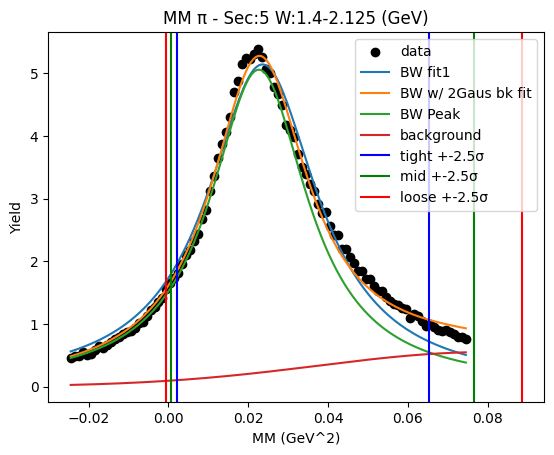

W bin: 1 1.425GeV-1.450GeV
initial bw fit:  [0.01159725 0.14035063 0.08176543]


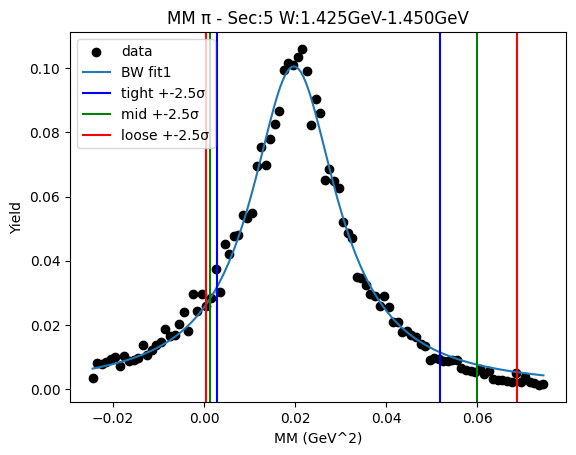

W bin: 2 1.450GeV-1.475GeV
initial bw fit:  [0.01500876 0.14299152 0.08778101]


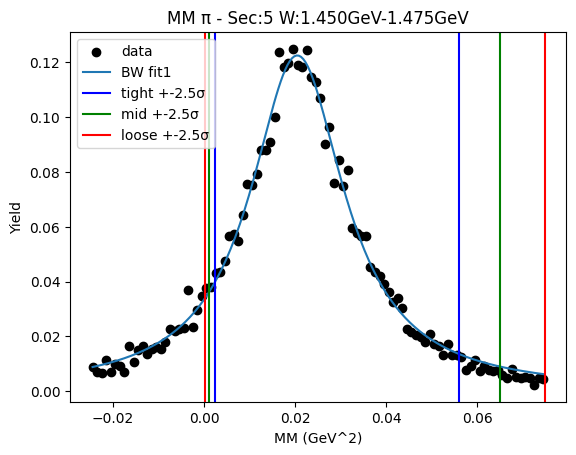

W bin: 3 1.475GeV-1.500GeV
initial bw fit:  [0.01811311 0.14516553 0.08689971]


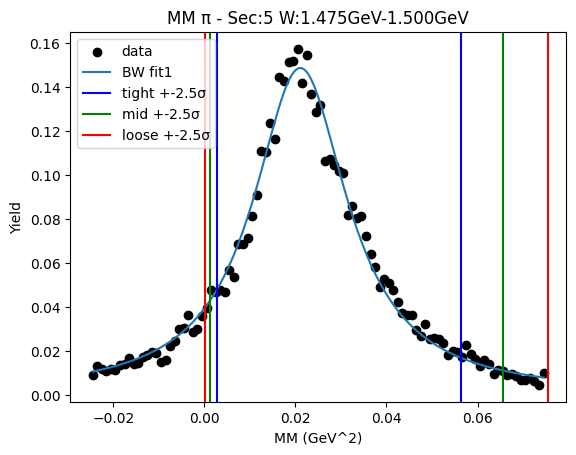

W bin: 4 1.500GeV-1.525GeV
initial bw fit:  [0.02046367 0.14914014 0.08469179]


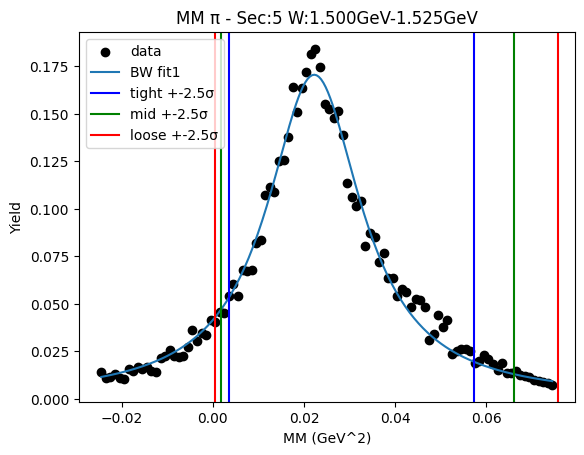

W bin: 5 1.525GeV-1.550GeV
initial bw fit:  [0.02147678 0.15209558 0.09058655]


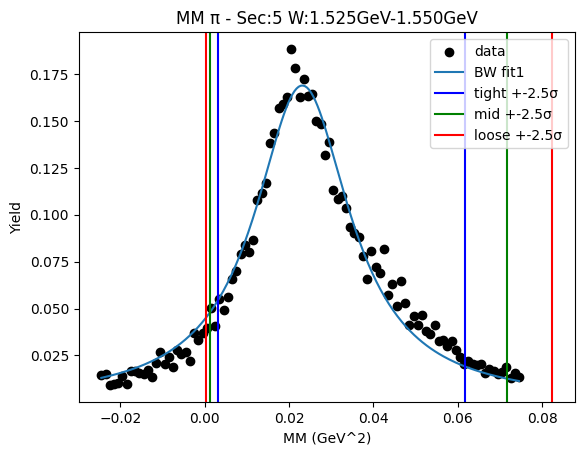

W bin: 6 1.550GeV-1.575GeV
initial bw fit:  [0.02148686 0.15270926 0.09646805]


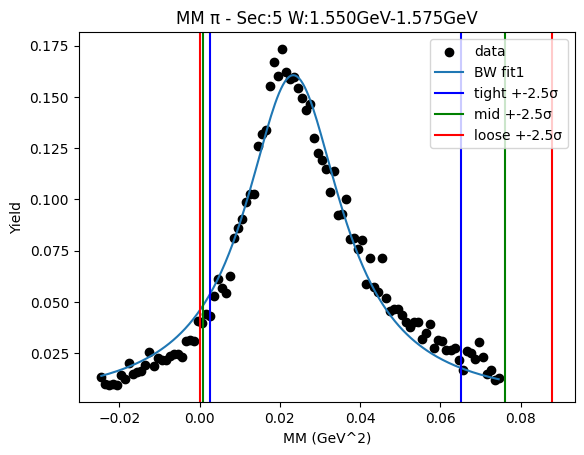

W bin: 7 1.575GeV-1.600GeV
initial bw fit:  [0.02247854 0.15161793 0.10060828]


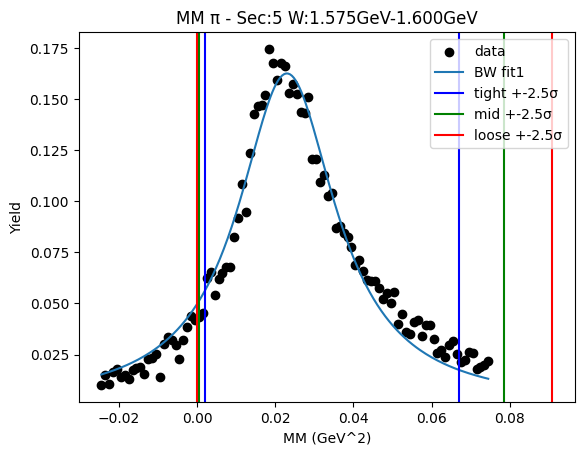

W bin: 8 1.600GeV-1.625GeV
initial bw fit:  [0.02353255 0.15168876 0.09934097]


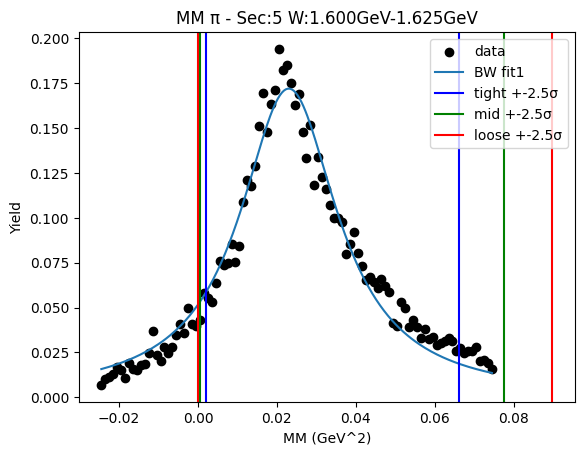

W bin: 9 1.625GeV-1.650GeV
initial bw fit:  [0.02561094 0.150769   0.10039989]


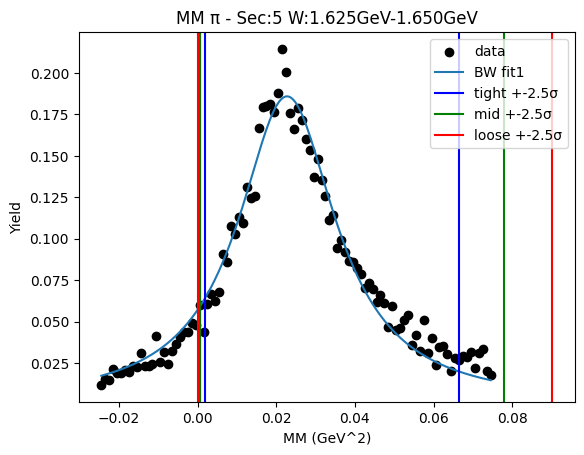

W bin: 10 1.650GeV-1.675GeV
initial bw fit:  [0.02959195 0.14946772 0.10664652]


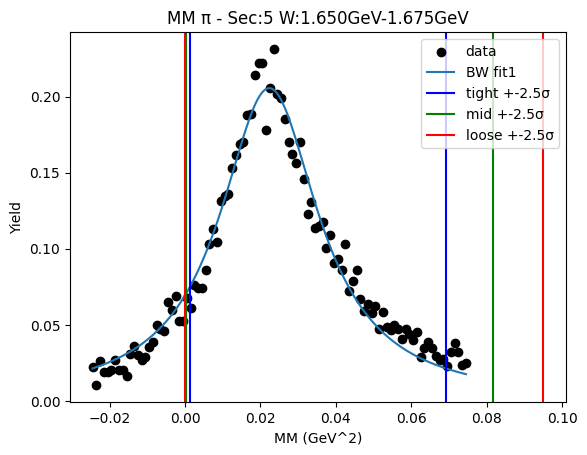

W bin: 11 1.675GeV-1.700GeV
initial bw fit:  [0.03367911 0.14987745 0.10433061]


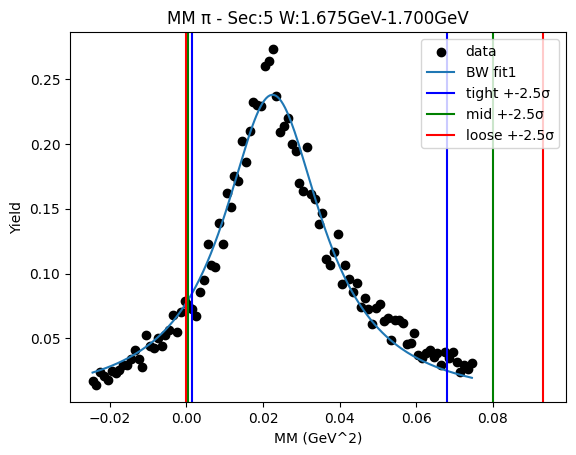

W bin: 12 1.700GeV-1.725GeV
initial bw fit:  [0.03757095 0.1527377  0.1020443 ]


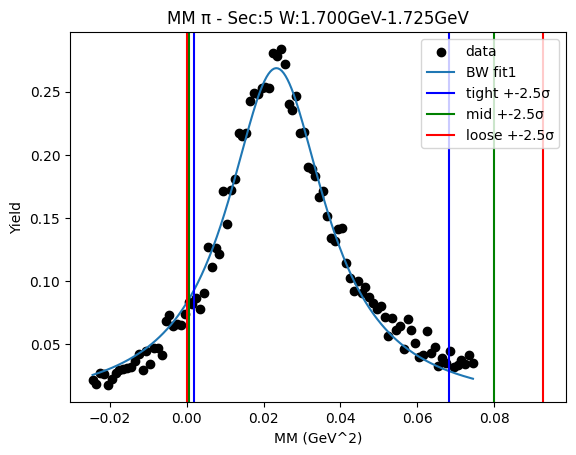

W bin: 13 1.725GeV-1.750GeV
initial bw fit:  [0.03693933 0.15528223 0.10580847]


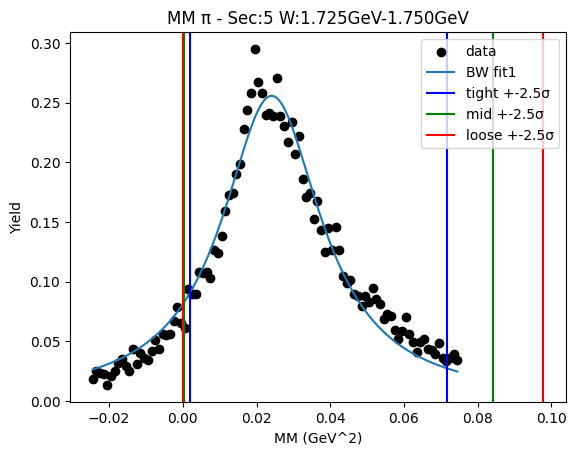

W bin: 14 1.750GeV-1.775GeV
initial bw fit:  [0.03413209 0.15801935 0.10773197]


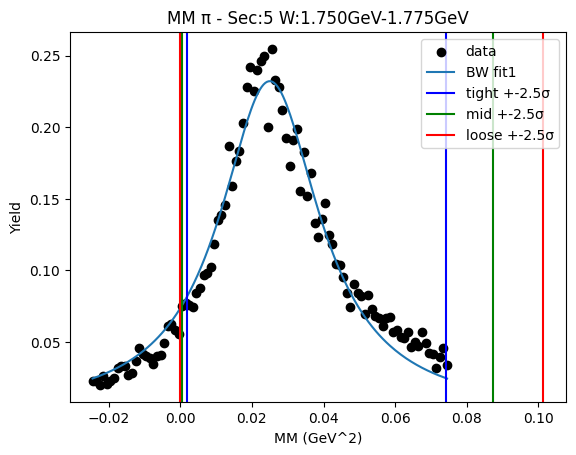

W bin: 15 1.775GeV-1.800GeV
initial bw fit:  [0.03167896 0.15822129 0.10862587]


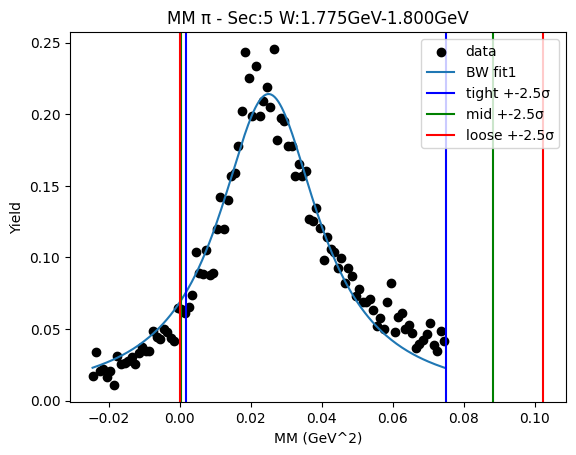

W bin: 16 1.800GeV-1.825GeV
initial bw fit:  [0.03007139 0.15887273 0.12302153]


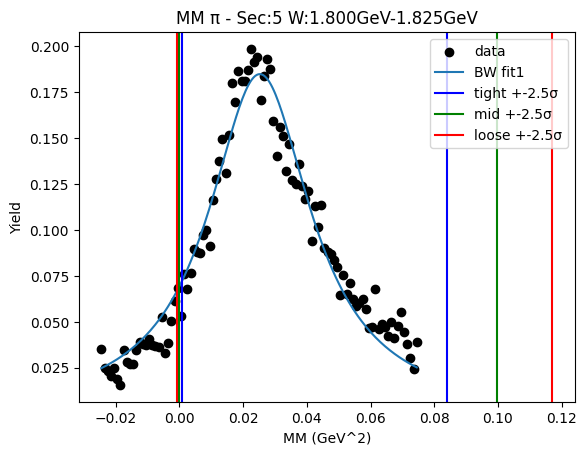

W bin: 17 1.825GeV-1.850GeV
initial bw fit:  [0.02997557 0.15531774 0.11762949]


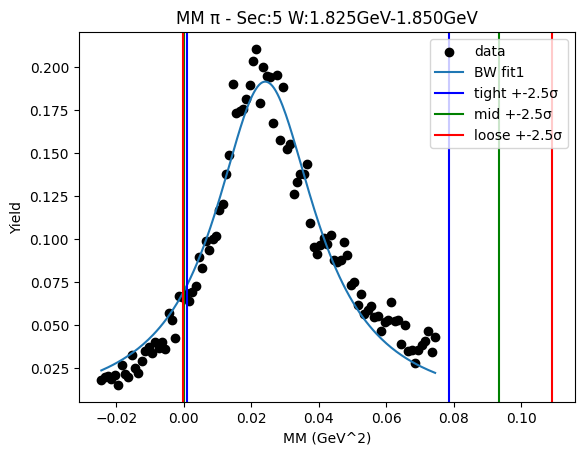

W bin: 18 1.850GeV-1.875GeV
initial bw fit:  [0.03054867 0.1575441  0.121994  ]


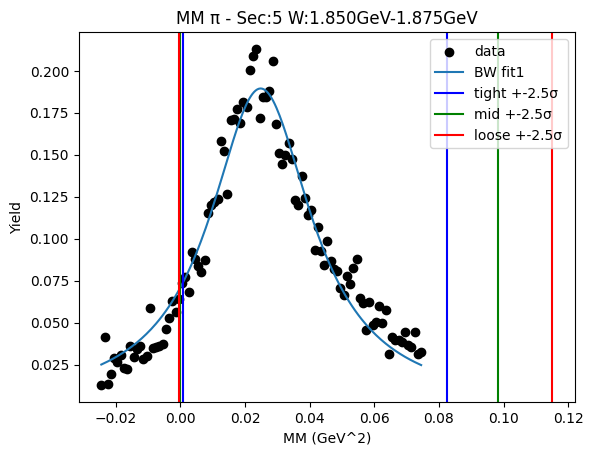

W bin: 19 1.875GeV-1.900GeV
initial bw fit:  [0.02935171 0.15735085 0.11760531]


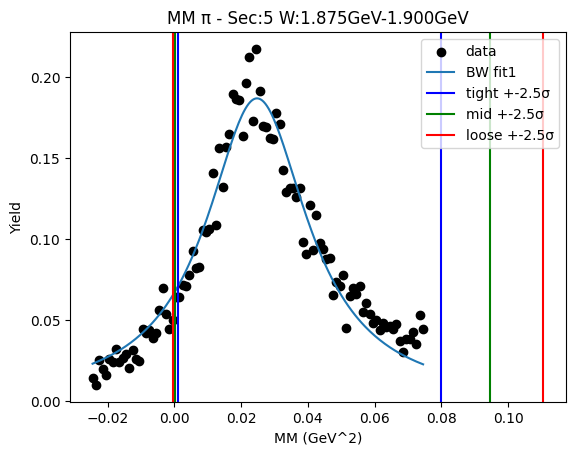

W bin: 20 1.900GeV-1.925GeV
initial bw fit:  [0.02961941 0.15573522 0.12082892]
W1_ini_pars: [0.02961941 0.15573522 0.12082892 0.04       0.3        0.06742853
 0.04       0.4        0.10165907]
-0.006910594452644428 0.049975225502341465
Breit-Wigner Peak [0.02277947 0.14673894 0.09737027]
Gaus2 [0.02439875 0.04       0.01061861]
Gaus3 [0.0240011  0.08       0.06228937]


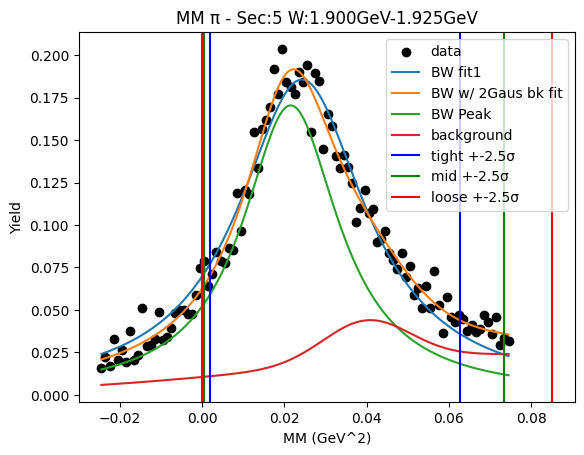

W bin: 21 1.925GeV-1.950GeV
initial bw fit:  [0.02941673 0.15798699 0.12332137]
W1_ini_pars: [0.02941673 0.15798699 0.12332137 0.02439875 0.04       0.01061861
 0.0240011  0.08       0.06228937]
-0.01221820297501974 0.0563826562070773
Breit-Wigner Peak [0.02416949 0.1486009  0.10692744]
Gaus2 [0.03556231 0.04762064 0.02197416]
Gaus3 [0.11643305 0.18122034 0.00369467]


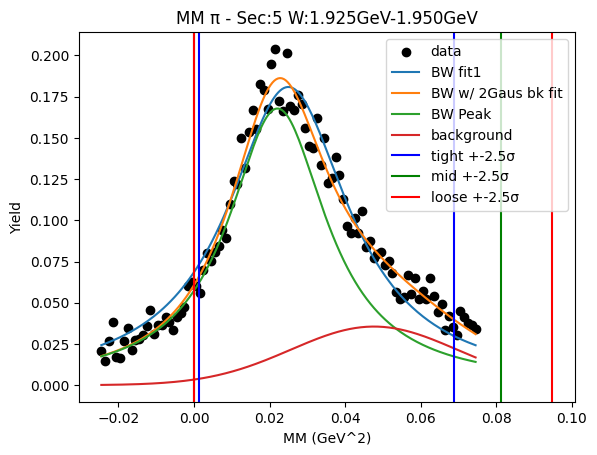

W bin: 22 1.950GeV-1.975GeV
initial bw fit:  [0.02900217 0.15546082 0.11946171]
W1_ini_pars: [0.02900217 0.15546082 0.11946171 0.03556231 0.04762064 0.02197416
 0.11643305 0.18122034 0.00369467]
-0.009579187640021448 0.05374797666590366
Breit-Wigner Peak [0.02508476 0.14860819 0.10273523]
Gaus2 [0.02965405 0.05618297 0.02393395]
Gaus3 [0.11643305 0.18122034 0.00369467]


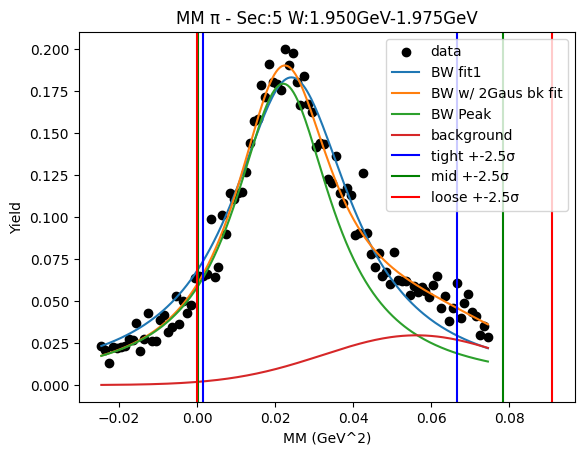

W bin: 23 1.975GeV-2.000GeV
initial bw fit:  [0.02893227 0.15692874 0.12159981]
W1_ini_pars: [0.02893227 0.15692874 0.12159981 0.02965405 0.05618297 0.02393395
 0.11643305 0.18122034 0.00369467]
-0.011265599083355164 0.05608142016998704
Breit-Wigner Peak [0.02359376 0.14969272 0.10594576]
Gaus2 [0.03097172 0.04753664 0.02676923]
Gaus3 [0.11643305 0.18122034 0.00369467]


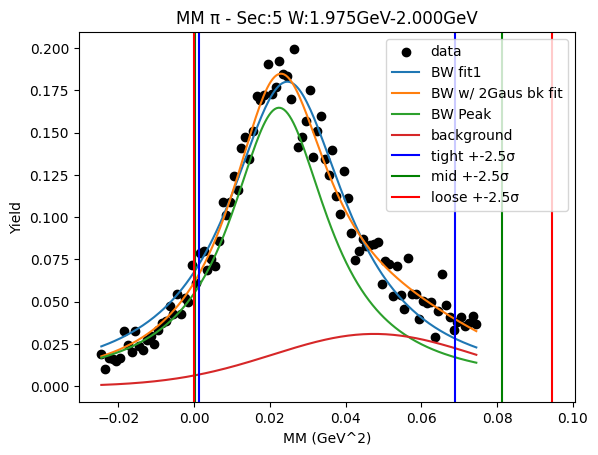

W bin: 24 2.000GeV-2.025GeV
initial bw fit:  [0.02783067 0.15626794 0.11852007]
W1_ini_pars: [0.02783067 0.15626794 0.11852007 0.03097172 0.04753664 0.02676923
 0.11643305 0.18122034 0.00369467]
-0.0034705352225326176 0.04697387810660077
Breit-Wigner Peak [0.01880779 0.14748448 0.09169189]
Gaus2 [0.04618209 0.04       0.02711757]
Gaus3 [0.11643305 0.18122034 0.00369467]


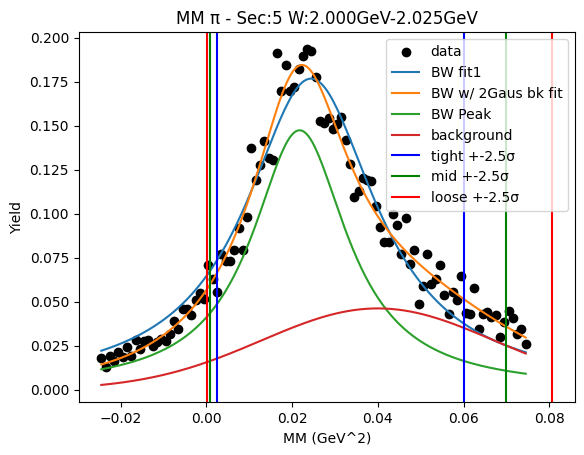

W bin: 25 2.025GeV-2.050GeV
initial bw fit:  [0.02675838 0.15876042 0.12162814]
W1_ini_pars: [0.02675838 0.15876042 0.12162814 0.04618209 0.04       0.02711757
 0.11643305 0.18122034 0.00369467]
-0.00987315921021949 0.0552148595092091
Breit-Wigner Peak [0.02311127 0.15056842 0.10415375]
Gaus2 [0.02986406 0.05243273 0.01914588]
Gaus3 [0.11643305 0.18122034 0.00369467]


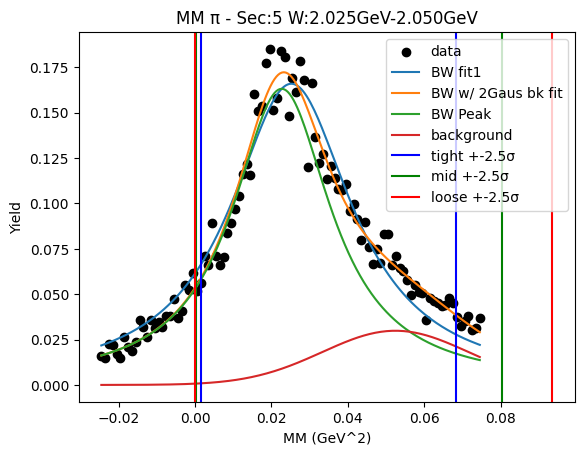

W bin: 26 2.050GeV-2.075GeV
initial bw fit:  [0.02656833 0.15759989 0.12344084]
W1_ini_pars: [0.02656833 0.15759989 0.12344084 0.02986406 0.05243273 0.01914588
 0.11643305 0.18122034 0.00369467]
-0.012805820841668886 0.05765157820229898
Breit-Wigner Peak [0.02257781 0.14974271 0.10836466]
Gaus2 [0.0274023  0.04980729 0.02248794]
Gaus3 [0.11643305 0.18122034 0.00369467]


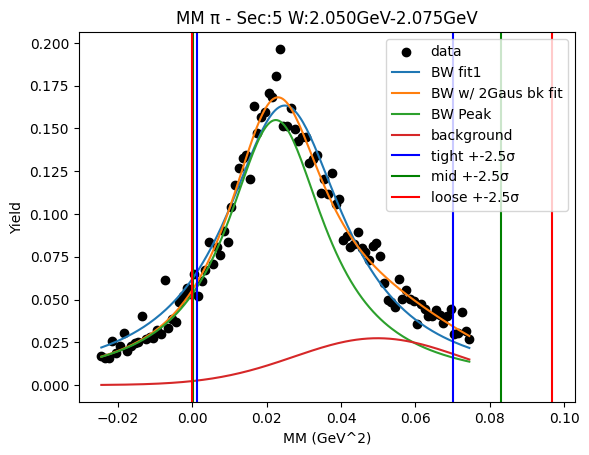

W bin: 27 2.075GeV-2.100GeV
initial bw fit:  [0.02634126 0.15711675 0.1313906 ]
W1_ini_pars: [0.02634126 0.15711675 0.1313906  0.0274023  0.04980729 0.02248794
 0.11643305 0.18122034 0.00369467]
-0.010400375188430466 0.05552373521249393
Breit-Wigner Peak [0.01877472 0.15020546 0.10482057]
Gaus2 [0.03418005 0.04280756 0.03412218]
Gaus3 [0.11643305 0.18122034 0.00369467]


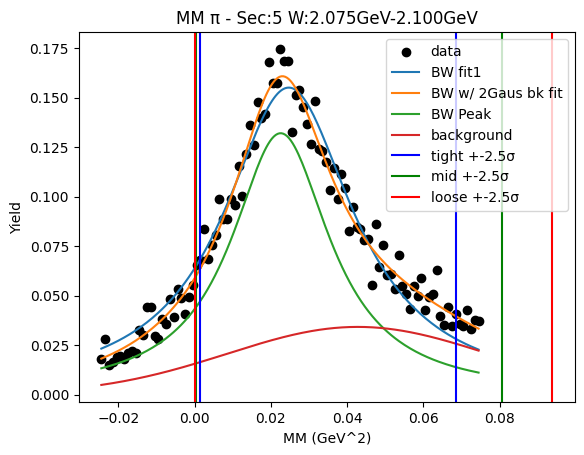

W bin: 28 2.100GeV-2.125GeV
initial bw fit:  [0.02570383 0.15453856 0.11925028]
W1_ini_pars: [0.02570383 0.15453856 0.11925028 0.03418005 0.04280756 0.03412218
 0.11643305 0.18122034 0.00369467]
0.0005623084928590184 0.04280027607068966
Breit-Wigner Peak [0.01621567 0.14724569 0.08390269]
Gaus2 [0.04338841 0.04       0.03228594]
Gaus3 [0.11643305 0.18122034 0.00369467]


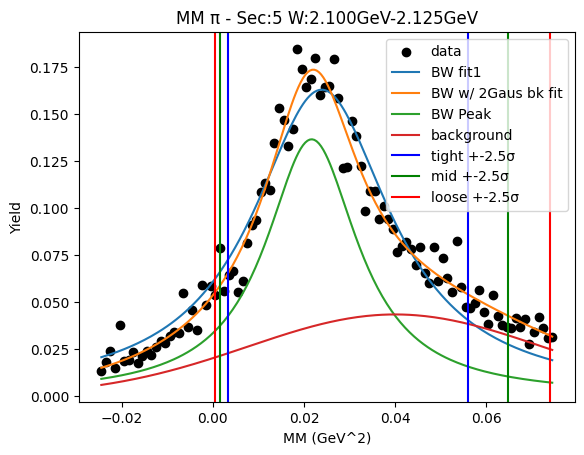

initial bw fit:  [0.1302913  0.15877914 0.11276134]
-0.0013182214999675756 0.045618840902439645
Breit-Wigner Peak [0.09682277 0.1488298  0.08844684]
Gaus2 [0.12647368 0.04       0.01201216]
Gaus3 [0.12161987 0.08       0.05349516]


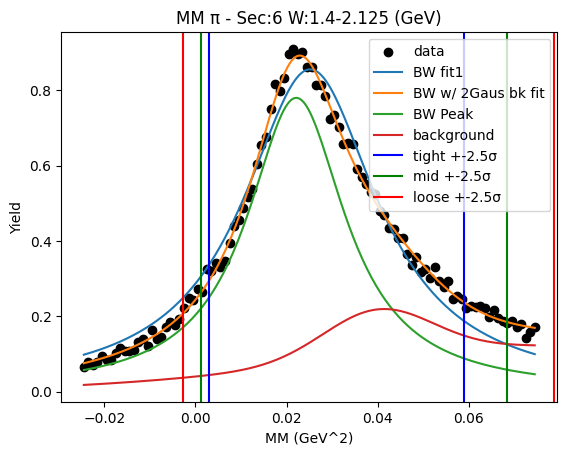

W bin: 1 1.425GeV-1.450GeV
initial bw fit:  [5.16573101e-04 9.78562931e-04 5.58339733e+01]


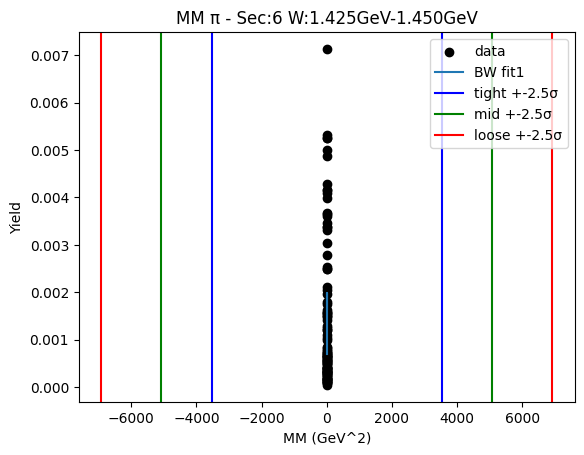

W bin: 2 1.450GeV-1.475GeV
initial bw fit:  [0.00079766 0.14677563 0.07880966]


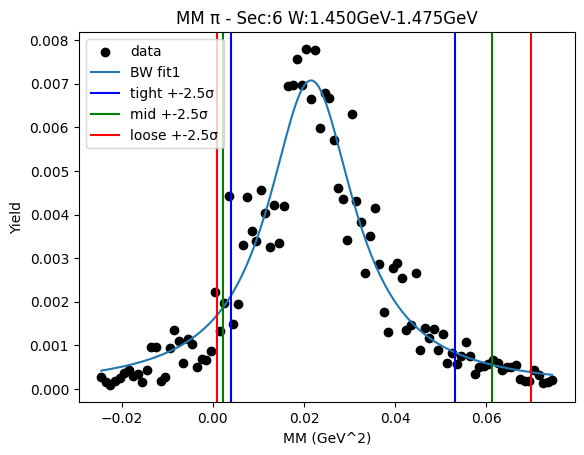

W bin: 3 1.475GeV-1.500GeV
initial bw fit:  [0.00105807 0.15138455 0.07673142]


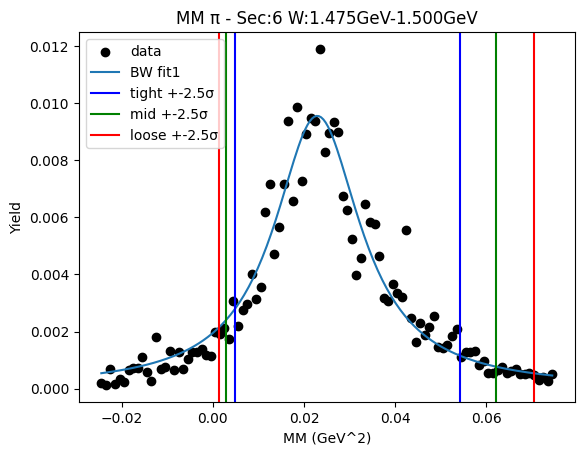

W bin: 4 1.500GeV-1.525GeV
initial bw fit:  [0.00126726 0.15243535 0.07386354]


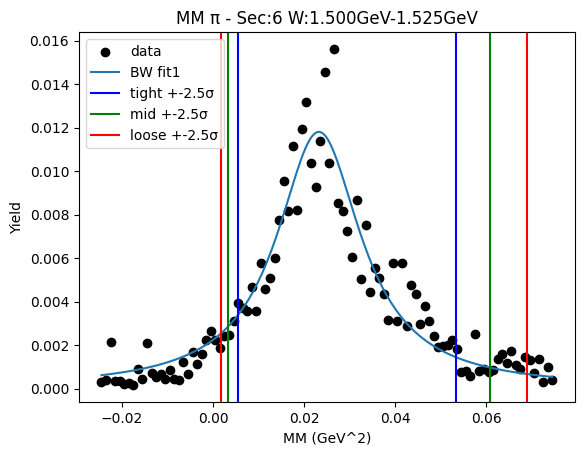

W bin: 5 1.525GeV-1.550GeV
initial bw fit:  [0.00149454 0.15503252 0.08003625]


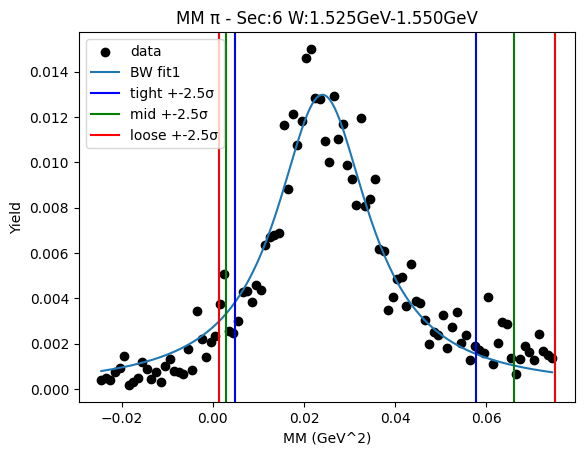

W bin: 6 1.550GeV-1.575GeV
initial bw fit:  [0.00152231 0.16088314 0.09893661]


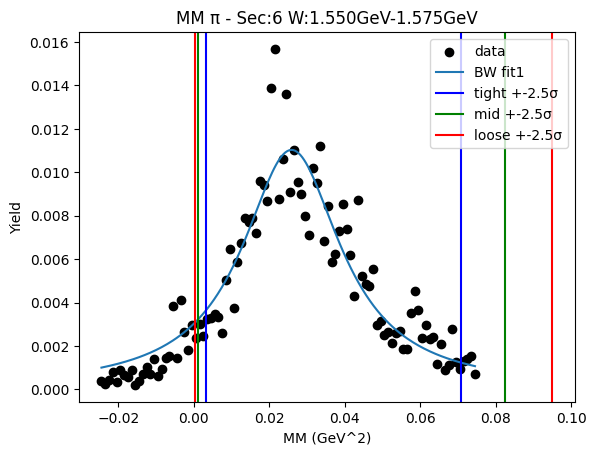

W bin: 7 1.575GeV-1.600GeV
initial bw fit:  [0.00174729 0.15272335 0.09421161]


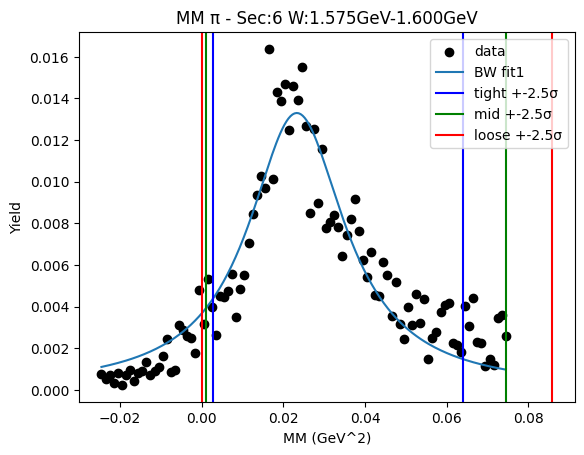

W bin: 8 1.600GeV-1.625GeV
initial bw fit:  [0.00199299 0.15823359 0.09434799]


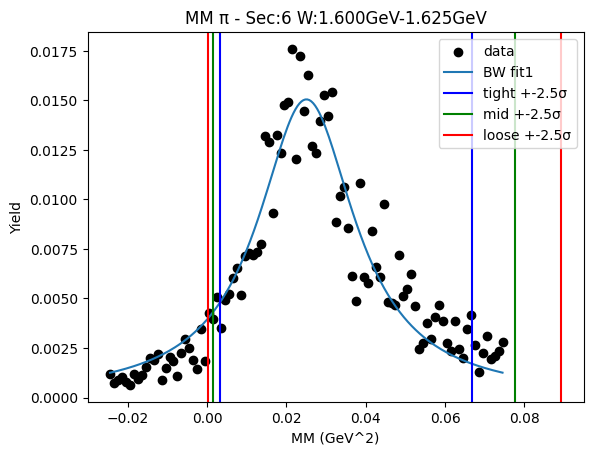

W bin: 9 1.625GeV-1.650GeV
initial bw fit:  [0.00223013 0.15511587 0.09070656]


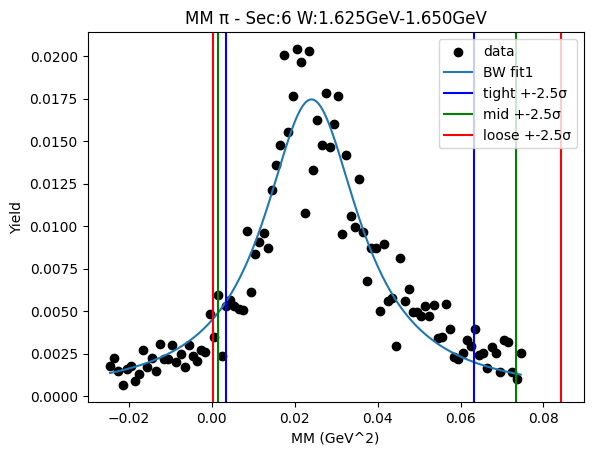

W bin: 10 1.650GeV-1.675GeV
initial bw fit:  [0.00290505 0.1540656  0.10190087]


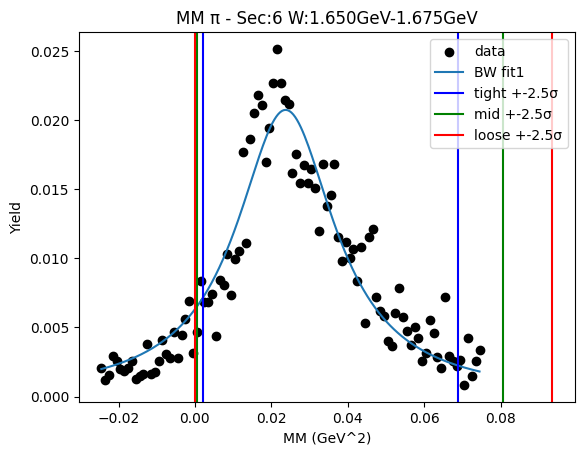

W bin: 11 1.675GeV-1.700GeV
initial bw fit:  [0.003469   0.15418307 0.10316701]


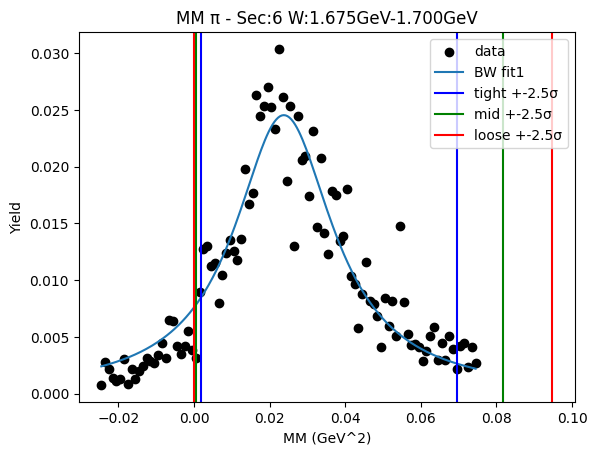

W bin: 12 1.700GeV-1.725GeV
initial bw fit:  [0.0042082  0.15577709 0.09666213]


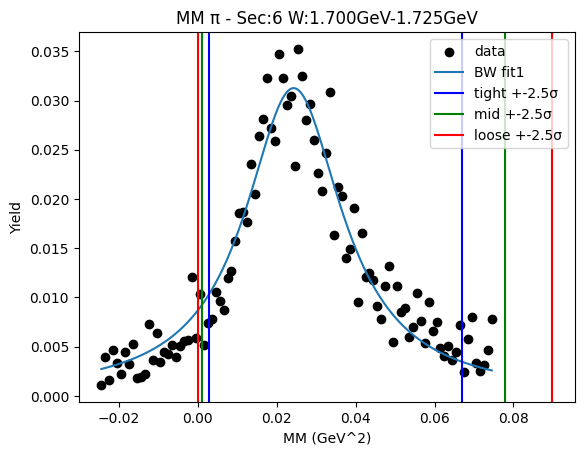

W bin: 13 1.725GeV-1.750GeV
initial bw fit:  [0.00459167 0.1572065  0.10191455]


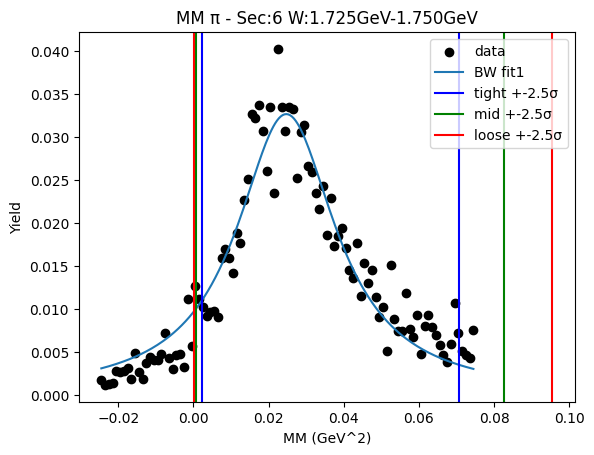

W bin: 14 1.750GeV-1.775GeV
initial bw fit:  [0.0048466  0.1588006  0.10578075]


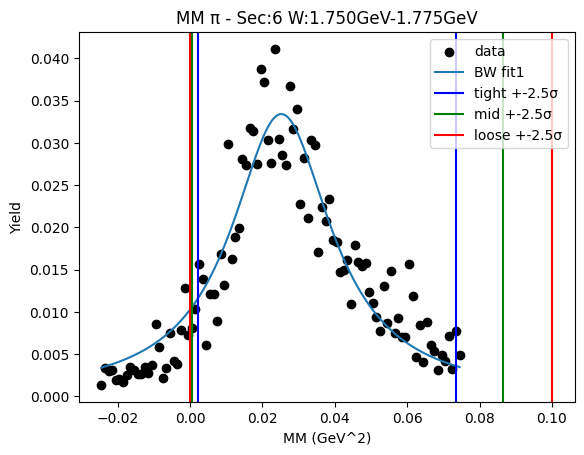

W bin: 15 1.775GeV-1.800GeV
initial bw fit:  [0.00456261 0.16174337 0.10473443]


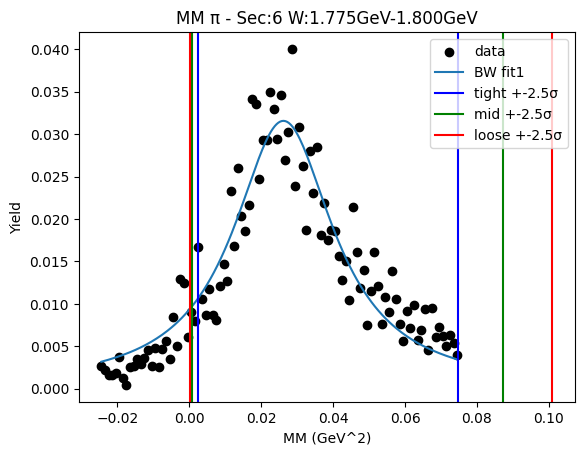

W bin: 16 1.800GeV-1.825GeV
initial bw fit:  [0.00471995 0.16215028 0.11121015]


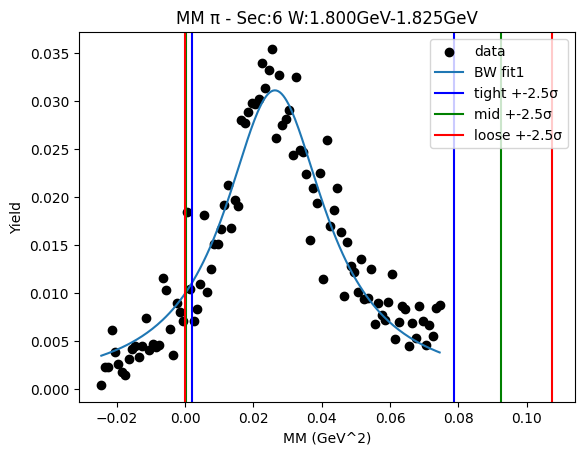

W bin: 17 1.825GeV-1.850GeV
initial bw fit:  [0.00506274 0.16257271 0.12405602]


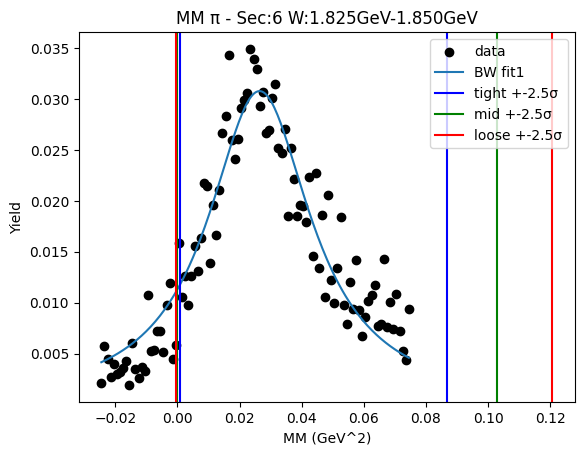

W bin: 18 1.850GeV-1.875GeV
initial bw fit:  [0.00565751 0.16068775 0.11278262]


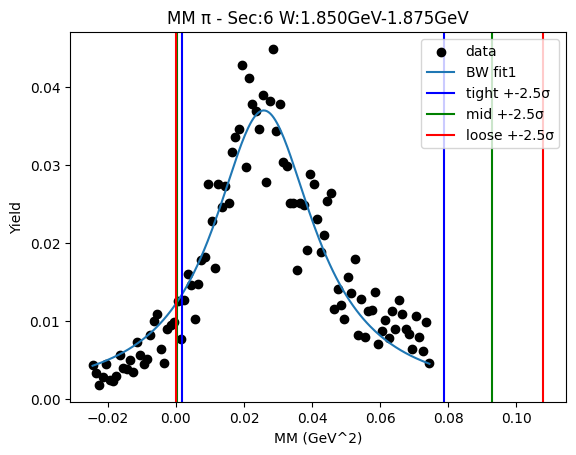

W bin: 19 1.875GeV-1.900GeV
initial bw fit:  [0.00572149 0.16175535 0.11891858]


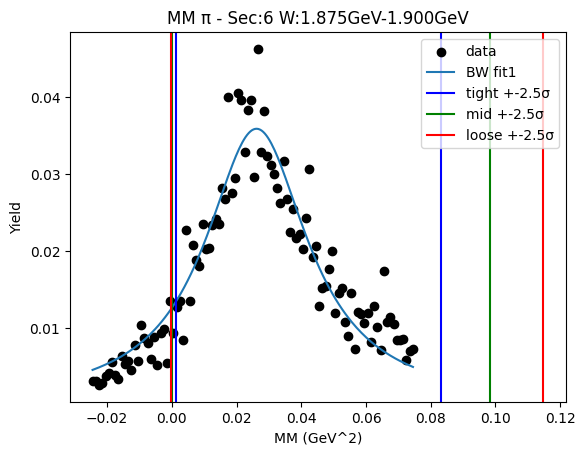

W bin: 20 1.900GeV-1.925GeV
initial bw fit:  [0.00626332 0.15676847 0.11652599]
W1_ini_pars: [0.00626332 0.15676847 0.11652599 0.04       0.3        0.06742853
 0.04       0.4        0.10165907]
0.005909373856256752 0.037400405309636925
Breit-Wigner Peak [0.00346818 0.147156   0.07244657]
Gaus2 [0.01335888 0.04       0.0295941 ]
Gaus3 [0.03829568 0.6860524  0.04989564]


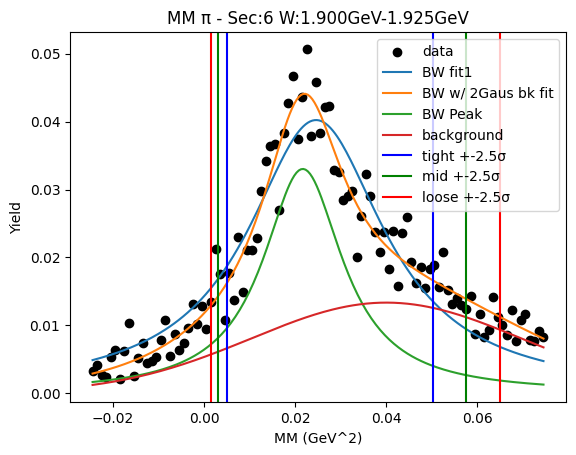

W bin: 21 1.925GeV-1.950GeV
initial bw fit:  [0.00660227 0.1591776  0.11628486]
W1_ini_pars: [0.00660227 0.1591776  0.11628486 0.01335888 0.04       0.0295941
 0.03829568 0.6860524  0.04989564]
0.002831817314479429 0.04366702966256025
Breit-Wigner Peak [0.00412676 0.15247762 0.08249769]
Gaus2 [0.01136408 0.04       0.03122322]
Gaus3 [0.03829568 0.6860524  0.04989564]


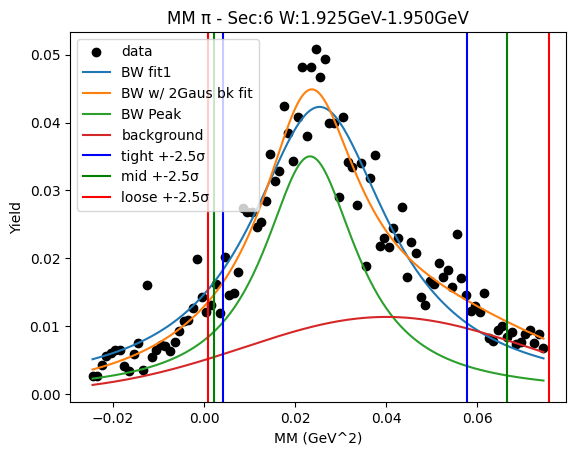

W bin: 22 1.950GeV-1.975GeV
initial bw fit:  [0.00709506 0.1606765  0.11411473]
W1_ini_pars: [0.00709506 0.1606765  0.11411473 0.01136408 0.04       0.03122322
 0.03829568 0.6860524  0.04989564]
0.0007466997155430796 0.04576082735652509
Breit-Wigner Peak [0.00463096 0.15249185 0.08661613]
Gaus2 [0.01230983 0.04       0.02772101]
Gaus3 [0.03829568 0.6860524  0.04989564]


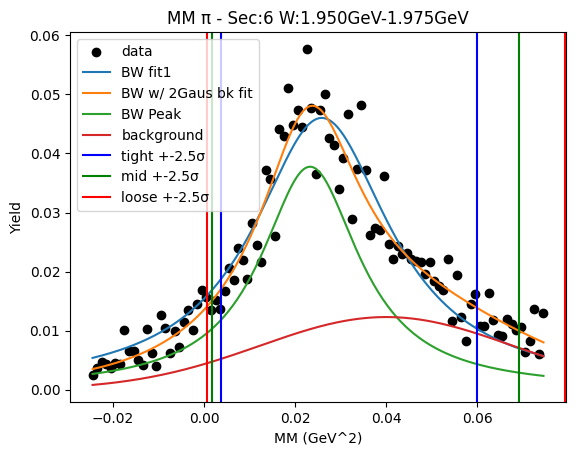

W bin: 23 1.975GeV-2.000GeV
initial bw fit:  [0.0074791  0.15921353 0.11338051]
W1_ini_pars: [0.0074791  0.15921353 0.11338051 0.01230983 0.04       0.02772101
 0.03829568 0.6860524  0.04989564]
-0.006219324501833826 0.05373837542819422
Breit-Wigner Peak [0.00679426 0.15414125 0.09996474]
Gaus2 [0.00660326 0.05865266 0.01887965]
Gaus3 [0.03829568 0.6860524  0.04989564]


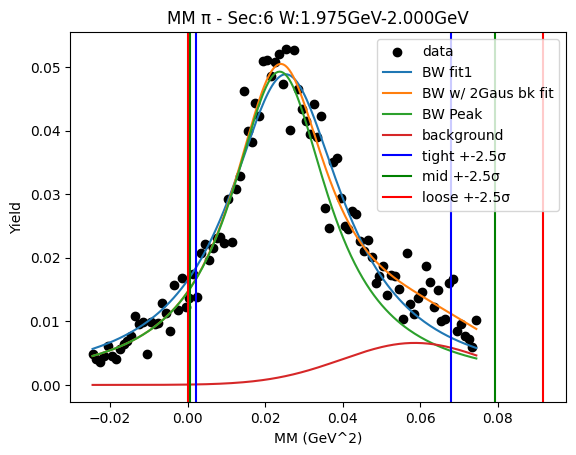

W bin: 24 2.000GeV-2.025GeV
initial bw fit:  [0.00803765 0.15956169 0.1210274 ]
W1_ini_pars: [0.00803765 0.15956169 0.1210274  0.00660326 0.05865266 0.01887965
 0.03829568 0.6860524  0.04989564]
-0.008609758216820123 0.052697640657155514
Breit-Wigner Peak [0.00599079 0.14847202 0.10108363]
Gaus2 [0.01241844 0.04386188 0.02325482]
Gaus3 [0.03829568 0.6860524  0.04989564]


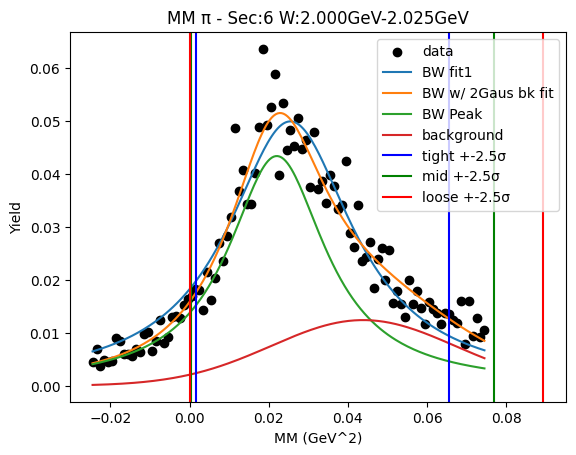

W bin: 25 2.025GeV-2.050GeV
initial bw fit:  [0.00828511 0.16235062 0.1232175 ]
W1_ini_pars: [0.00828511 0.16235062 0.1232175  0.01241844 0.04386188 0.02325482
 0.03829568 0.6860524  0.04989564]
-0.007172522094323543 0.05413155483307462
Breit-Wigner Peak [0.00714394 0.15323027 0.10108089]
Gaus2 [0.01084391 0.05510046 0.01644259]
Gaus3 [0.03829568 0.6860524  0.04989564]


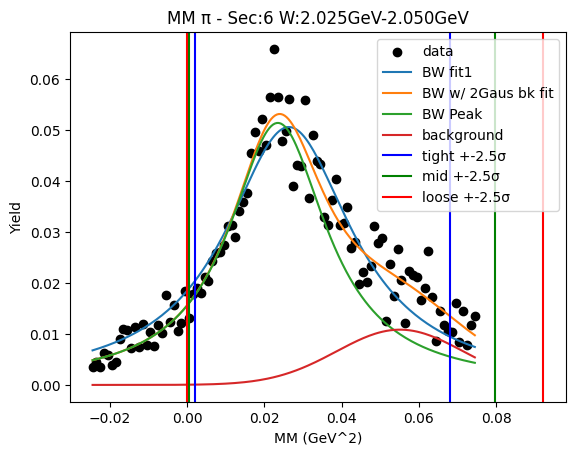

W bin: 26 2.050GeV-2.075GeV
initial bw fit:  [0.00856889 0.16120446 0.13185943]
W1_ini_pars: [0.00856889 0.16120446 0.13185943 0.01084391 0.05510046 0.01644259
 0.03829568 0.6860524  0.04989564]
-0.01414185946708411 0.06058505707646576
Breit-Wigner Peak [0.00751021 0.15238635 0.11159967]
Gaus2 [0.00956026 0.05671416 0.01836726]
Gaus3 [0.03829568 0.6860524  0.04989564]


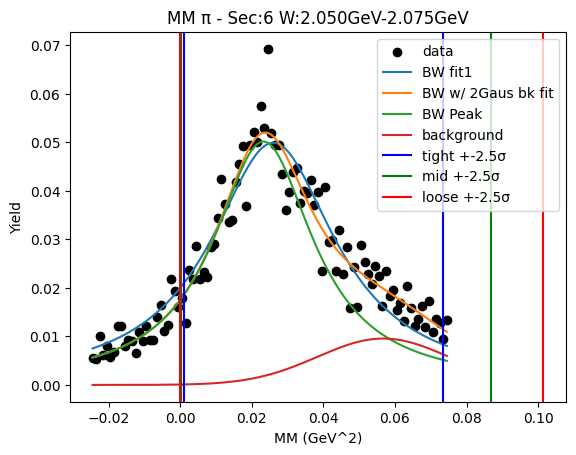

W bin: 27 2.075GeV-2.100GeV
initial bw fit:  [0.00955495 0.15808359 0.12107532]
W1_ini_pars: [0.00955495 0.15808359 0.12107532 0.00956026 0.05671416 0.01836726
 0.03829568 0.6860524  0.04989564]
-0.00944722179828971 0.05433163388786035
Breit-Wigner Peak [0.00823601 0.14980723 0.10310097]
Gaus2 [0.01103242 0.05314832 0.01934754]
Gaus3 [0.03829568 0.6860524  0.04989564]


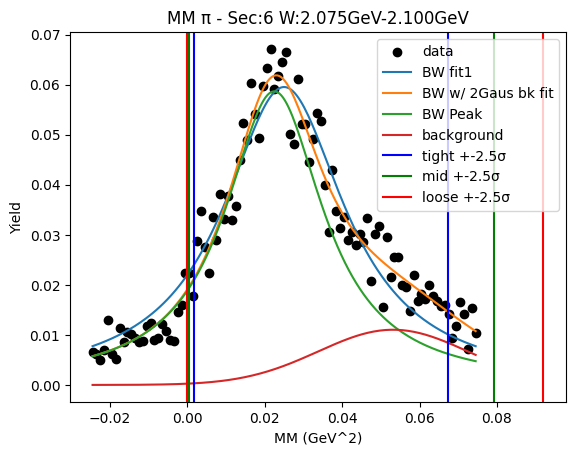

W bin: 28 2.100GeV-2.125GeV
initial bw fit:  [0.00980448 0.16106086 0.13127163]
W1_ini_pars: [0.00980448 0.16106086 0.13127163 0.01103242 0.05314832 0.01934754
 0.03829568 0.6860524  0.04989564]
-0.017811579657828768 0.06530083489049009
Breit-Wigner Peak [0.00827081 0.15409292 0.11769481]
Gaus2 [0.00877986 0.05280866 0.02976668]
Gaus3 [0.03829568 0.6860524  0.04989564]


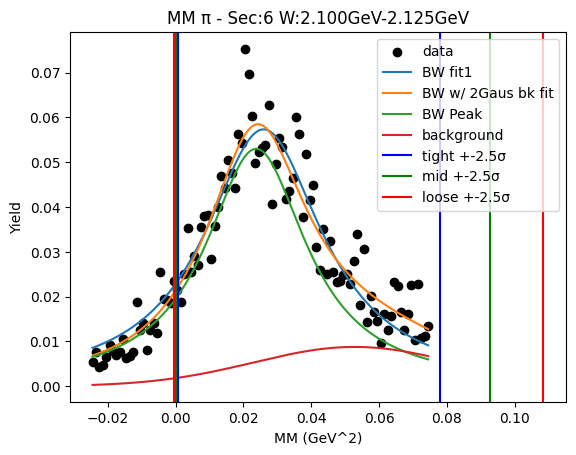

In [10]:
bkgd=True
Wlow_bin = 0
Wbin_bkgd = 20

tight = 2.5
mid = 3
loose = 3.5
cut_names=["tight","mid","loose"]
color_order=['b','g','r']

a_ini=148
m_ini=0.149
g_ini=0.08
bw_ini = [a_ini,m_ini,g_ini]


gaus2_ini = [0.04,  0.3, 0.06287]
gaus3_ini = [0.04, 0.4, 0.2417]
 
bw_ini_w = [0.65, 0.15, 0.035]
gaus2_ini_w = [0.04, 0.3, 0.06742853]
gaus3_ini_w = [0.04, 0.4, 0.10165907]

bw_bounds = [[0.0,0.0,0.0],[np.inf,np.inf,np.inf]]
full_bounds = [[0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.08,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]
   

bw_pars = np.zeros((6,_W_bins_+1,3))
gaus2_pars = np.zeros((6,_W_bins_+1,3))
gaus3_pars = np.zeros((6,_W_bins_+1,3))


ini_pars= np.zeros(9)
for i in range(3):
    ini_pars[i] = bw_ini[i]
    ini_pars[i+3] = gaus2_ini[i]
    ini_pars[i+6] = gaus3_ini[i]

    #sec W low, high, tight, mid, loose
cut_bounds = np.zeros((6,_W_bins_+1,2,3))

bw_ini_w1 = np.zeros(3)
    
for sec in range(6):
    x_r=Center_Xbins(hist_name[sec][1])
    y_r=Values_1d(hist_name[sec][1])
    plt.scatter(x_r,y_r,color='k',label='data')
    plt.title("MM {} Sec:{} W:{}-{} (GeV)".format(Particle,sec+1,_W_min_,_W_max_))
    plt.xlabel("MM (GeV^2)")
    plt.ylabel("Yield")
    tmp_x1 = np.linspace(x_r[0],x_r[len(x_r)-1],200)
    try:
        #plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_ini),label="BW ini pars")
        pars_r1, pars_cov_r1 = op.curve_fit(BW_e2,x_r,y_r,p0=bw_ini,maxfev=5000,bounds=bw_bounds)
        plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_r1),label="BW fit1")
        print("initial bw fit: ",pars_r1)
        try:
            r1_ini_pars = np.zeros(9)
            
            for i in range(3):
                r1_ini_pars[i] = pars_r1[i]
                r1_ini_pars[i+3] = gaus2_ini[i]
                r1_ini_pars[i+6] = gaus3_ini[i]
            pars_r2, pars_cov_r2 = op.curve_fit(BW_e2_Gaus2,x_r,y_r,p0=r1_ini_pars,maxfev=5000,bounds=full_bounds)
            plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_r2),label="BW w/ 2Gaus bk fit")
            r1_bkgd_pars = np.zeros(6)
            
            for i in range(3):
                bw_pars[sec][_W_bins_][i] = pars_r2[i]
                r1_bkgd_pars[i] = pars_r2[i+3]
                r1_bkgd_pars[i+3] = pars_r2[i+6]
                gaus2_pars[sec][_W_bins_][i] = pars_r2[i+3]
                gaus3_pars[sec][_W_bins_][i] = pars_r2[i+6]
                cut_bounds[sec][_W_bins_][0][0] = sign(pars_r2[1]-tight*pars_r2[2]/2.35)*(pars_r2[1]-tight*pars_r2[2]/2.35)*(pars_r2[1]-tight*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][0][1] = sign(pars_r2[1]-mid*pars_r2[2]/2.35)*(pars_r2[1]-mid*pars_r2[2]/2.35)*(pars_r2[1]-mid*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][0][2] = sign(pars_r2[1]-loose*pars_r2[2]/2.35)*(pars_r2[1]-loose*pars_r2[2])*(pars_r2[1]-loose*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2]/2.35)*(pars_r2[1]+tight*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2]/2.35)*(pars_r2[1]+mid*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2]/2.35)*(pars_r2[1]+loose*pars_r2[2]/2.35)
            plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][_W_bins_]),label="BW Peak")
            plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_bkgd_pars),label="background")
            for cut in range(3):
                    for side in range(2):
                        if side ==0:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][side][cut],label="{} +-{}\u03C3".format(cut_names[cut],tight),color=color_order[cut])
                        else:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][side][cut],color=color_order[cut])
#             plt.axvline(x=cut_bounds[sec][_W_bins_][0][0],label="tight -{}\u03C3".format(tight))
#             plt.axvline(x=cut_bounds[sec][_W_bins_][1][0],label="tight +{}\u03C3".format(tight))
#             plt.axvline(x=cut_bounds[sec][_W_bins_][0][1],label="mid -{}\u03C3".format(mid),color='g')
#             plt.axvline(x=cut_bounds[sec][_W_bins_][1][1],label="mid +{}\u03C3".format(mid),color='g')
#             plt.axvline(x=cut_bounds[sec][_W_bins_][0][2],label="loose -{}\u03C3".format(loose),color='r')
#             plt.axvline(x=cut_bounds[sec][_W_bins_][1][2],label="loose +{}\u03C3".format(loose),color='r')
            print(pars_r2[1]*pars_r2[1]-3*pars_r2[2]*pars_r2[2],pars_r2[1]*pars_r2[1]+3*pars_r2[2]*pars_r2[2])
            print("Breit-Wigner Peak",bw_pars[sec][_W_bins_])
            print("Gaus2",gaus2_pars[sec][_W_bins_])
            print("Gaus3",gaus3_pars[sec][_W_bins_])
        except RuntimeError:
            print("Runtime Error1.1\n\tJust skip it for now")
        except ValueError:
            print("Value Error1.1\n\tJust skip it for now")
    except RuntimeError:
        print("Runtime Error1.0\n\tJust skip it for now")
    except ValueError:
        print("Value Error1.0\n\tJust skip it for now")
    plt.legend()
    plt.show()
    for Wbin in range(_W_bins_):
        if Wbin > Wlow_bin:
            print("W bin:",Wbin,W_Bin_PlotName[Wbin])
            x_w=Center_Xbins(hist_name[sec][0][Wbin])
            y_w=Values_1d(hist_name[sec][0][Wbin])
            plt.scatter(x_w,y_w,color='k',label='data')
            plt.title("MM {} Sec:{} W:{}".format(Particle,sec+1,W_Bin_PlotName[Wbin]))
            plt.xlabel("MM (GeV^2)")
            plt.ylabel("Yield")
            try:
                if Wbin > 0 and bw_pars[sec][Wbin-1][i]!=0:
                    for i in range(3):
                        bw_ini_w1[i] = bw_pars[sec][Wbin-1][i]
                else:
                    for i in range(3):
                        bw_ini_w1[i] = bw_ini_w[i]
                pars_w1, pars_cov_w1 = op.curve_fit(BW_e2,x_w,y_w,p0=bw_ini_w1,maxfev=5000,bounds=bw_bounds)
                plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                #plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_ini_w1),label="BW ini_w1")
                print("initial bw fit: ",pars_w1)
                if Wbin >= Wbin_bkgd:
                    try:
                        w1_ini_pars = np.zeros(9)

                        for i in range(3):
                            w1_ini_pars[i] = pars_w1[i]
                            if Wbin > 0:
                                if gaus2_pars[sec][Wbin-1][i] != 0.0:
                                    w1_ini_pars[i+3] = gaus2_pars[sec][Wbin-1][i]
                                    w1_ini_pars[i+6] = gaus3_pars[sec][Wbin-1][i]
                                else:
                                    w1_ini_pars[i+3] = gaus2_ini_w[i]
                                    w1_ini_pars[i+6] = gaus3_ini_w[i]
                            else:
                                w1_ini_pars[i+3] = gaus2_ini_w[i]
                                w1_ini_pars[i+6] = gaus3_ini_w[i]
                        print("W1_ini_pars:",w1_ini_pars)
                        pars_w2, pars_cov_w2 = op.curve_fit(BW_e2_Gaus2,x_w,y_w,p0=w1_ini_pars,maxfev=5000,bounds=full_bounds)
                        plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_w2),label="BW w/ 2Gaus bk fit")
                        w1_bkgd_pars = np.zeros(6)
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w2[i]
                            w1_bkgd_pars[i] = pars_w2[i+3]
                            w1_bkgd_pars[i+3] = pars_w2[i+6]
                            gaus2_pars[sec][Wbin][i] = pars_w2[i+3]
                            gaus3_pars[sec][Wbin][i] = pars_w2[i+6]
                            cut_bounds[sec][Wbin][0][0] = sign(pars_w2[1]-tight*pars_w2[2]/2.35)*(pars_w2[1]-tight*pars_w2[2]/2.35)*(pars_w2[1]-tight*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][0][1] = sign(pars_w2[1]-mid*pars_w2[2]/2.35)*(pars_w2[1]-mid*pars_w2[2]/2.35)*(pars_w2[1]-mid*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][0][2] = sign(pars_w2[1]-loose*pars_w2[2]/2.35)*(pars_w2[1]-loose*pars_w2[2]/2.35)*(pars_w2[1]-loose*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][1][0] = (pars_w2[1]+tight*pars_w2[2]/2.35)*(pars_w2[1]+tight*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][1][1] = (pars_w2[1]+mid*pars_w2[2]/2.35)*(pars_w2[1]+mid*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][1][2] = (pars_w2[1]+loose*pars_w2[2]/2.35)*(pars_w2[1]+loose*pars_w2[2]/2.35)
                        plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="BW Peak")
                        plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_bkgd_pars),label="background")
                        
                        print(pars_w2[1]*pars_w2[1]-3*pars_w2[2]*pars_w2[2],pars_w2[1]*pars_w2[1]+3*pars_w2[2]*pars_w2[2])
                        print("Breit-Wigner Peak",bw_pars[sec][Wbin])
                        print("Gaus2",gaus2_pars[sec][Wbin])
                        print("Gaus3",gaus3_pars[sec][Wbin])
                    except RuntimeError:
                        print("Runtime Error2.1\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                            cut_bounds[sec][Wbin][0][0] = sign(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][0][1] = sign(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][0][2] = sign(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
                    except ValueError:
                        print("Value Error2.1\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                            cut_bounds[sec][Wbin][0][0] = sign(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][0][1] = sign(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][0][2] = sign(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
                else:
                    for i in range(3):
                        bw_pars[sec][Wbin][i] = pars_w1[i]
                        cut_bounds[sec][Wbin][0][0] = sign(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][0][1] = sign(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][0][2] = sign(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
                for cut in range(3):
                    for side in range(2):
                        if side ==0:
                            plt.axvline(x=cut_bounds[sec][Wbin][side][cut],label="{} +-{}\u03C3".format(cut_names[cut],tight),color=color_order[cut])
                        else:
                            plt.axvline(x=cut_bounds[sec][Wbin][side][cut],color=color_order[cut])
#                         plt.axvline(x=cut_bounds[sec][Wbin][0][0],label="tight -{}\u03C3".format(tight))
#                         plt.axvline(x=cut_bounds[sec][Wbin][1][0],label="tight +{}\u03C3".format(tight))
#                         plt.axvline(x=cut_bounds[sec][Wbin][0][1],label="mid -{}\u03C3".format(mid),color='g')
#                         plt.axvline(x=cut_bounds[sec][Wbin][1][1],label="mid +{}\u03C3".format(mid),color='g')
#                         plt.axvline(x=cut_bounds[sec][Wbin][0][2],label="loose -{}\u03C3".format(loose),color='r')
#                         plt.axvline(x=cut_bounds[sec][Wbin][1][2],label="loose +{}\u03C3".format(loose),color='r')
            except RuntimeError:
                print("Runtime Error2.0\n\tJust skip it for now")
            except ValueError:
                print("Value Error2.0\n\tJust skip it for now")
            plt.legend()
            plt.show()
      

In [18]:
for Wbin in range(_W_bins_):
    for sec in range(6):
        for cut in range(3):
            for side in range(2):
                if side ==0 and cut_bounds[sec][Wbin][side][cut] < -0.2:
                    cut_bounds[sec][Wbin][side][cut] = 0
                if side ==1 and cut_bounds[sec][Wbin][side][cut] > 0.2:
                    cut_bounds[sec][Wbin][side][cut] = 0

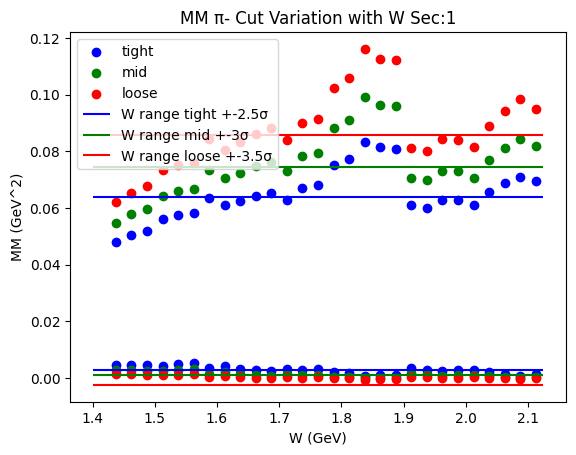

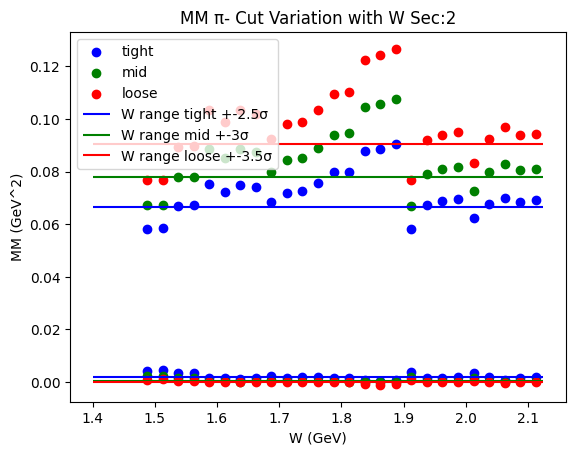

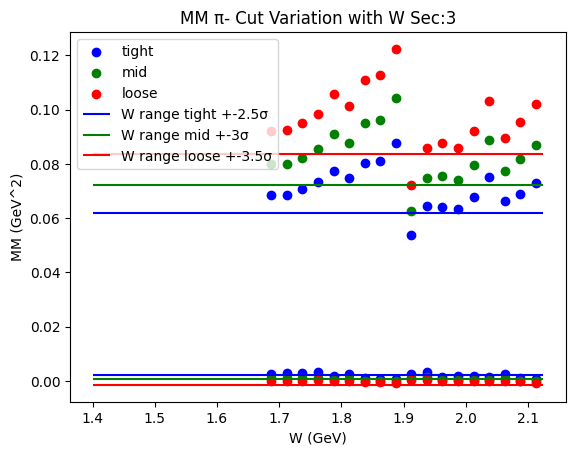

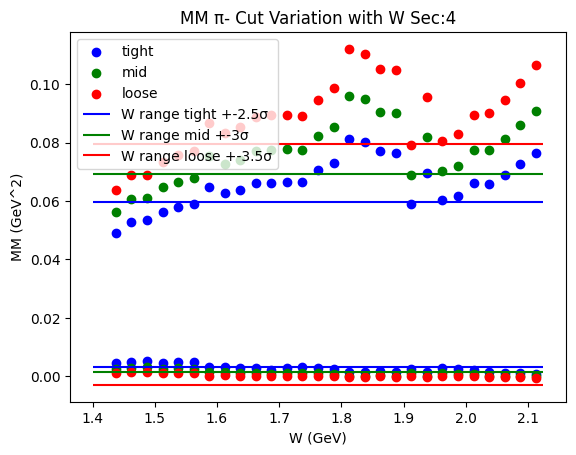

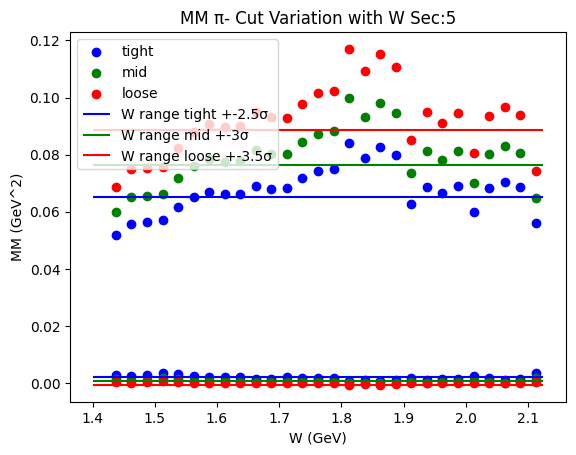

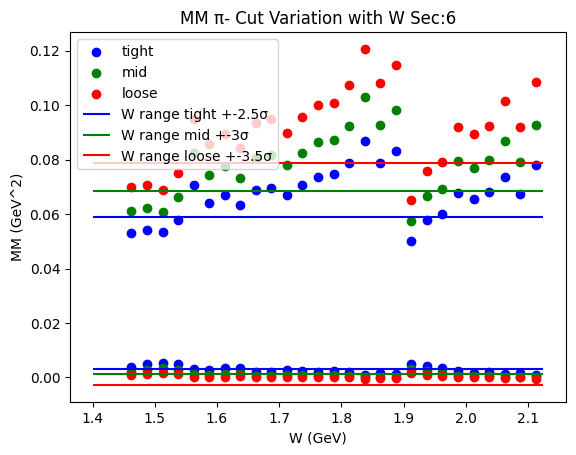

In [34]:
W_bins = [W_center(i) for i in range(_W_bins_)]


for sec in range(6):
    for cut in range(3):
        for side in range(2):
            x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)])
            y = Remove_Zeros_Y([cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)])
            if side==0:
                plt.scatter(x,y,color=color_order[cut],label=cut_names[cut])
            else:
                plt.scatter(x,y,color=color_order[cut])
    plt.hlines(cut_bounds[sec][_W_bins_][0][0],_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
    plt.hlines(cut_bounds[sec][_W_bins_][1][0],_W_min_,_W_max_,color='b')
    plt.hlines(cut_bounds[sec][_W_bins_][0][1],_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
    plt.hlines(cut_bounds[sec][_W_bins_][1][1],_W_min_,_W_max_,color='g')
    plt.hlines(cut_bounds[sec][_W_bins_][0][2],_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
    plt.hlines(cut_bounds[sec][_W_bins_][1][2],_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV^2)")
    plt.show()
    
    
    
    

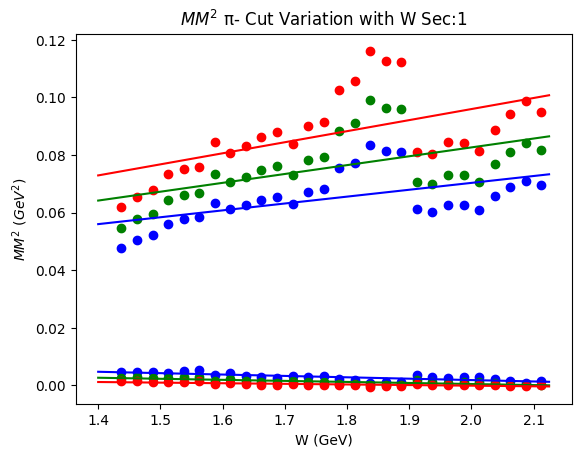

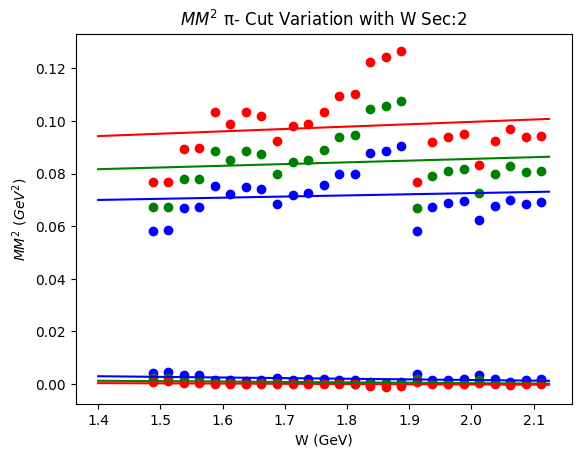

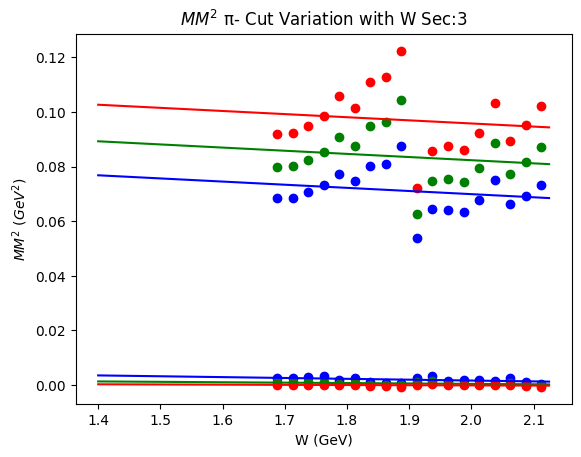

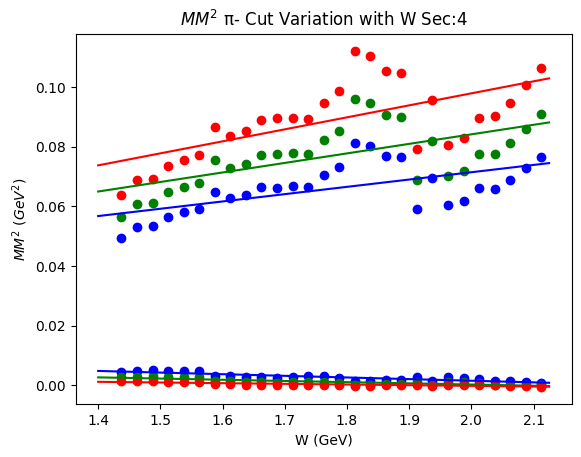

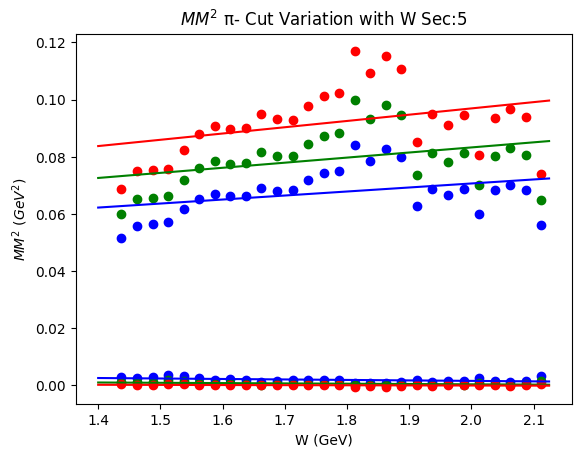

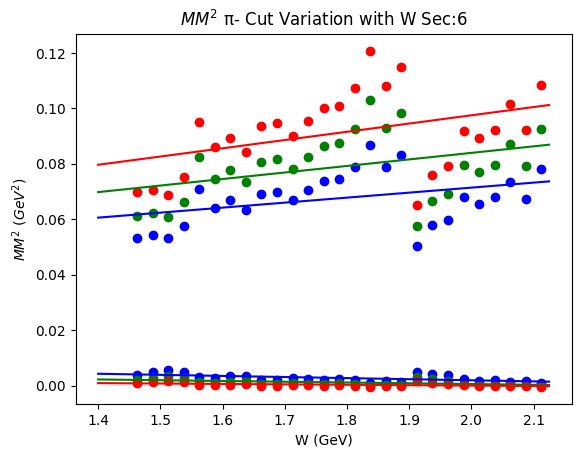

In [35]:
ini_lin1 = [-0.01,0.01]
ini_lin2 = [0.03,0.03]


def Linear(x_, a_,b_):
    return a_*x_ + b_


cut_pars = np.zeros((6,2,3,2))

for sec in range(6):
    for cut in range(3):
        for side in range(2):
            x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)])
            y = Remove_Zeros_Y([cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)])
            if side==0:
                plt.scatter(x,y,color=color_order[cut],label=cut_names[cut])
                try: 
                    pars1, pars_cov1 = op.curve_fit(Linear,x,y,p0=ini_lin1,maxfev=5000)
                    cont_x = np.linspace(_W_min_,_W_max_,200)
                    plt.plot(cont_x,Linear(cont_x,*pars1),label=cut_names[cut],color=color_order[cut])
                    cut_pars[sec][side][cut][0] = pars1[0]
                    cut_pars[sec][side][cut][1] = pars1[1]
                except RuntimeError:
                    print("Runtime Error 1.1\n\tJust skip it for now")
                except ValueError:
                    print("Value Error 1.1\n\tJust skip it for now")
            else:
                plt.scatter(x,y,color=color_order[cut])
                try: 
                    pars2, pars_cov2 = op.curve_fit(Linear,x,y,p0=ini_lin2,maxfev=5000)
                    cont_x = np.linspace(_W_min_,_W_max_,200)
                    plt.plot(cont_x,Linear(cont_x,*pars2),color=color_order[cut])
                    cut_pars[sec][side][cut][0] = pars2[0]
                    cut_pars[sec][side][cut][1] = pars2[1]
                except RuntimeError:
                    print("Runtime Error 1.1\n\tJust skip it for now")
                except ValueError:
                    print("Value Error 1.1\n\tJust skip it for now")
    plt.title(r'$MM^2$ {} Cut Variation with W Sec:{}'.format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel(r'$MM^{2}$ ($GeV^{2}$)')
    plt.show()

In [36]:




# for sec in range(6):
#     y_tight_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     y_tight_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)])
#     y_mid_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
#     y_mid_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)])
#     y_loose_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
#     y_loose_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)])
#     #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
#     #x_loose = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
#     plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     try: 
#         tight_pars1, tight_pars_cov1 = op.curve_fit(Linear,x,y_tight_w1,p0=ini_lin1,maxfev=5000)
#         cont_x = np.linspace(_W_min_,_W_max_,200)
#         plt.plot(cont_x,Linear(cont_x,*tight_pars1),label="tight fit",color='b')
#         cut_pars[sec][0][0][0] = tight_pars1[0]
#         cut_pars[sec][0][0][1] = tight_pars1[1]
#     except RuntimeError:
#         print("Runtime Error 1.1\n\tJust skip it for now")
#     except ValueError:
#         print("Value Error 1.1\n\tJust skip it for now")
#     try: 
#         tight_pars2, tight_pars_cov2 = op.curve_fit(Linear,x,y_tight_w2,p0=ini_lin2,maxfev=5000)
#         cont_x = np.linspace(_W_min_,_W_max_,200)
#         plt.plot(cont_x,Linear(cont_x,*tight_pars2),color='b')
#         cut_pars[sec][1][0][0] = tight_pars2[0]
#         cut_pars[sec][1][0][1] = tight_pars2[1]
#     except RuntimeError:
#         print("Runtime Error 1.2\n\tJust skip it for now")
#     except ValueError:
#         print("Value Error 1.2\n\tJust skip it for now")
#     try: 
#         mid_pars1, mid_pars_cov1 = op.curve_fit(Linear,x,y_mid_w1,p0=ini_lin1,maxfev=5000)
#         cont_x = np.linspace(_W_min_,_W_max_,200)
#         plt.plot(cont_x,Linear(cont_x,*mid_pars1),color='g')
#         cut_pars[sec][0][1][0] = mid_pars1[0]
#         cut_pars[sec][0][1][1] = mid_pars1[1]
#     except RuntimeError:
#         print("Runtime Error 2.1\n\tJust skip it for now")
#     except ValueError:
#         print("Value Error 2.1\n\tJust skip it for now")
#     try: 
#         mid_pars2, mid_pars_cov2 = op.curve_fit(Linear,x,y_mid_w2,p0=ini_lin2,maxfev=5000)
#         cont_x = np.linspace(_W_min_,_W_max_,200)
#         plt.plot(cont_x,Linear(cont_x,*mid_pars2),label="mid fit",color='g')
#         cut_pars[sec][1][1][0] = mid_pars2[0]
#         cut_pars[sec][1][1][1] = mid_pars2[1]
#     except RuntimeError:
#         print("Runtime Error 2.2\n\tJust skip it for now")
#     except ValueError:
#         print("Value Error 2.2\n\tJust skip it for now")
#     try: 
#         loose_pars1, loose_pars_cov1 = op.curve_fit(Linear,x,y_loose_w1,p0=ini_lin1,maxfev=5000)
#         cont_x = np.linspace(_W_min_,_W_max_,200)
#         plt.plot(cont_x,Linear(cont_x,*loose_pars1),label="loose fit",color='r')
#         cut_pars[sec][0][2][0] = loose_pars1[0]
#         cut_pars[sec][0][2][1] = loose_pars1[1]
#     except RuntimeError:
#         print("Runtime Error 3.1\n\tJust skip it for now")
#     except ValueError:
#         print("Value Error 3.1\n\tJust skip it for now")
#     try: 
#         loose_pars2, loose_pars_cov2 = op.curve_fit(Linear,x,y_loose_w2,p0=ini_lin2,maxfev=5000)
#         cont_x = np.linspace(_W_min_,_W_max_,200)
#         plt.plot(cont_x,Linear(cont_x,*loose_pars2),color='r')
#         cut_pars[sec][1][2][0] = loose_pars2[0]
#         cut_pars[sec][1][2][1] = loose_pars2[1]
#     except RuntimeError:
#         print("Runtime Error 3.2\n\tJust skip it for now")
#     except ValueError:
#         print("Value Error 3.2\n\tJust skip it for now")
#     plt.legend()
#     plt.title("MM^2 {} Cut Variation with W Sec:{}".format(Particle,sec+1))
#     plt.xlabel("W (GeV)")
#     plt.ylabel("MM^2 (GeV^2)")
#     plt.show()

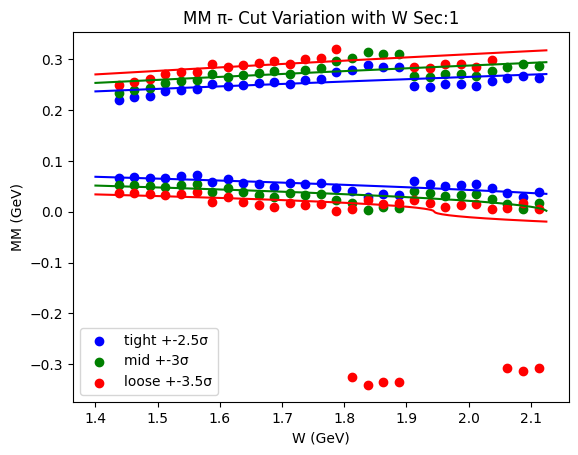

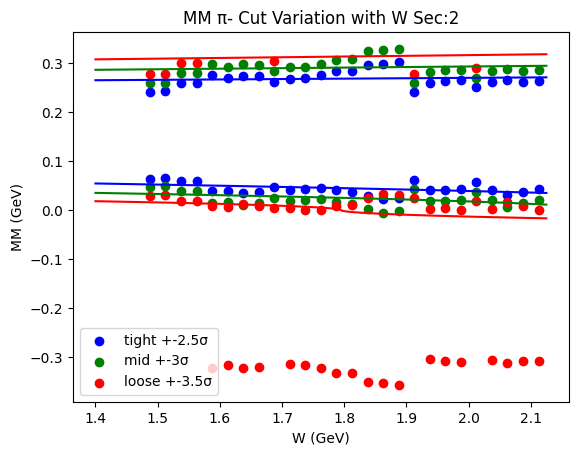

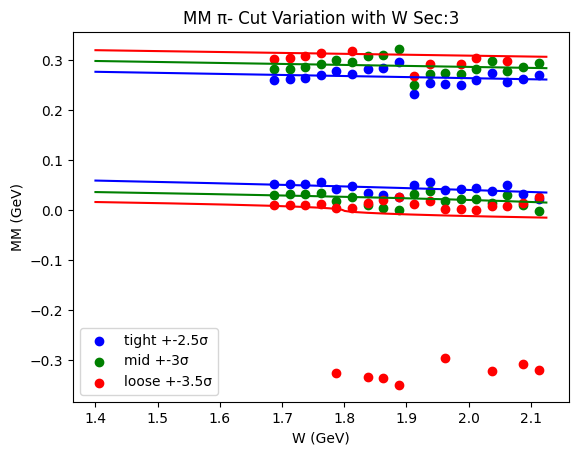

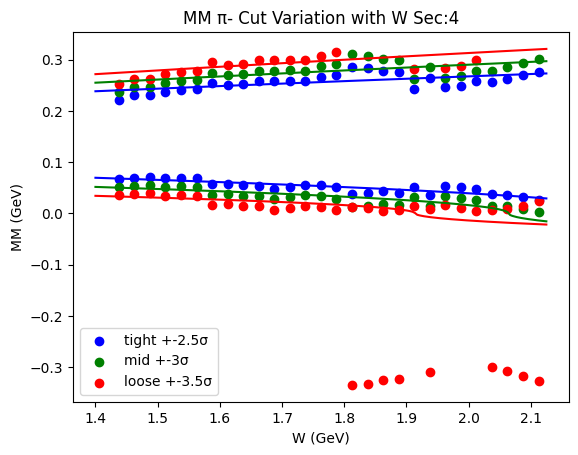

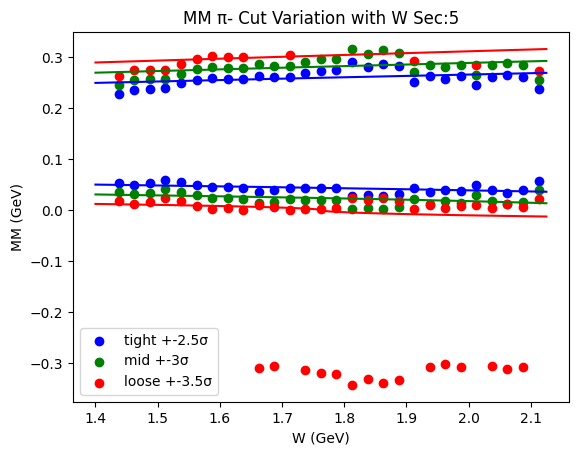

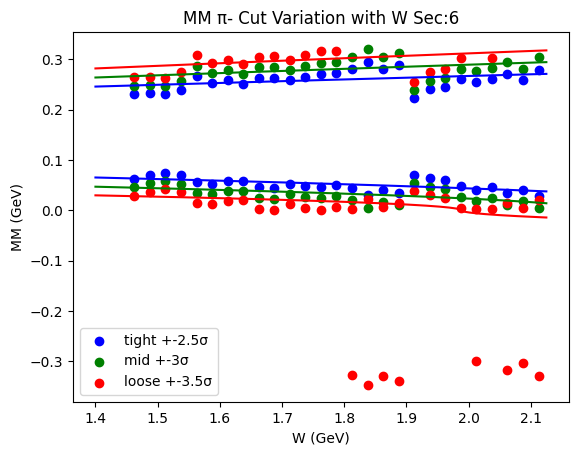

In [37]:
def Linear_sq(x_, a_,b_):
    return [sign(a_*x_[i] + b_)*math.sqrt(sign((a_*x_[i] + b_))*(a_*x_[i] + b_)) for i in range(len(x_))]

for sec in range(6):
    y_tight_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][0])*math.sqrt(sign(cut_bounds[sec][Wbin][0][0])*cut_bounds[sec][Wbin][0][0]) for Wbin in range(_W_bins_)])
    y_tight_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][0]) for Wbin in range(_W_bins_)])
    y_mid_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][1])*math.sqrt(sign(cut_bounds[sec][Wbin][0][1])*cut_bounds[sec][Wbin][0][1]) for Wbin in range(_W_bins_)])
    y_mid_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][1]) for Wbin in range(_W_bins_)])
    y_loose_w1 = Remove_Zeros_Y([math.sqrt(sign(cut_bounds[sec][Wbin][0][2])*cut_bounds[sec][Wbin][0][2]) for Wbin in range(_W_bins_)])
    y_loose_w2 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][2])*math.sqrt(cut_bounds[sec][Wbin][1][2]) for Wbin in range(_W_bins_)])
    #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
    x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    #x_loose = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
    plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
    plt.scatter(x,y_tight_w2,color='b',)
    plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
    plt.scatter(x,y_mid_w2,color='g')
    plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
    plt.scatter(x,y_loose_w2,color='r')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][0][0]),color='b')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][1][0]),color='b')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][0][1]),color='g')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][1][1]),color='g')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][0][2]),color='r')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][1][2]),color='r')
    
    
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV)")
    plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

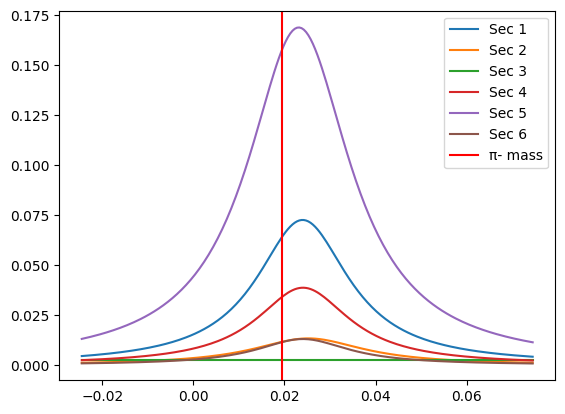

In [38]:
Wbin = 5#_W_bins_
m_par = 0.13957018
for sec in range(6):
    plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="Sec {}".format(sec+1))
plt.axvline(x=m_par*m_par,label="{} mass".format(Particle),color='r')
plt.legend()
plt.show

In [39]:
# print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                     else:
#                         print("\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                 else:
#                     print("\t\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}}}")
#                     else:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}},")
#                 else: 
#                     print(cut_bounds[sec][_W_bins_][side][t],"},")
#             else: 
#                 print(cut_bounds[sec][_W_bins_][side][t],end=",")



In [40]:
print("MM ^2 "+Particle+" Linear Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]")
for sec in range(6):
    for side in range(2):
        for t in range(3):
            for a in range(2):
                if a == 0:
                    if t == 0:
                        if side ==0:
                            if sec==0:
                                print("{\t{\t{\t{",cut_pars[sec][side][t][a],end=",")
                            else:
                                print("\t{\t{\t{",cut_pars[sec][side][t][a],end=",")
                        else:
                            print("\t\t{\t{",cut_pars[sec][side][t][a],end=",")
                    else:
                        print("\t{",cut_pars[sec][side][t][a],end=",")
                elif a ==1:
                    if t == 2:
                        if side == 1:
                            if sec == 5:
                                print(cut_pars[sec][side][t][a],"}}}}")
                            else:
                                print(cut_pars[sec][side][t][a],"}}},")
                        else: 
                            print(cut_pars[sec][side][t][a],"}},")
                    else: 
                        print(cut_pars[sec][side][t][a],end="},")
                else:
                    print(cut_pars[sec][side][t][a],end=",")

MM ^2 π- Linear Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]
{	{	{	{ -0.00480054041717226,0.011433483380582539},	{ -0.003635968940112992,0.007729680820340814},	{ -0.002119837490849966,0.0041230710479833255 }},
		{	{ 0.02387562284820129,0.02257339732957425},	{ 0.03077542859771644,0.021097574625031562},	{ 0.03840835670982133,0.019150882029662745 }}},
	{	{	{ -0.0023813641292413012,0.006287660184516844},	{ -0.0015316647182863942,0.0033809032849914404},	{ -0.0008419491621388797,0.0015109638555719424 }},
		{	{ 0.004331568511258691,0.06391726539249834},	{ 0.00652970250415467,0.0725289746493681},	{ 0.009005445489665486,0.08165863556421599 }}},
	{	{	{ -0.0031326013633251114,0.007909398380918824},	{ -0.0014957128880981586,0.003413973276975696},	{ -0.0006768962885311047,0.0012167847132271185 }},
		{	{ -0.011510783627597596,0.09293051250354309},	{ -0.011547323638371689,0.10543529017048917},	{ -0.011438168044632524,0.11866780886459467 }}},
	{	{	{ -0.005470123986081993,0.012469827064